# Trabajo Práctico 3: Clustering
Para la materia: Topicos avanzados en minería de datos - C2 2024

**Alumno:** [Joaquin Caporalini](mailto:joaquicaporalini@gmail.com)

**Docente:** [Pablo Granitto](mailto:granitto@cifasis-conicet.gov.ar)

## 1.a. Intentar clusterizar *Crabs*
En este primer ejercicio voy a intentar recuperar las clases originales del dataset *crabs*. En este conjunto de datos existen dos clasificaciones de los datos:
+ Por un lado se clasifican por especie (**sp**)
+ Por otro la clasificación por sexo (**sex**)

La idea va a ser aplicar distintas tácticas para lograr separar en clusters.
+ Logaritmo + PCA + Escalado
+ Logaritmo + Escalado + PCA

Primero con **k-means** y luego con **hclust**

### Comparar resultados (dado)

In [10]:
library(e1071)

compararClases <- function(agrupacion1, agrupacion2){
    # Crear una tabla de confución de las dos clasificaciones
    cont.table <- table(agrupacion1, agrupacion2)
    # Encontrar la coincidencia óptima entre las dos clasificaciones
    class.match <- matchClasses(as.matrix(cont.table),method="exact")
    # Imprimir la tabla de confusión, con filas permutadas para maximizar la diagonal
    print(cont.table[,class.match])
}

### Cargando el dataset crabs

In [11]:
library(MASS)
data(crabs)

# Primer vistazo a su composición
crabs

# Aplico una transformación logarítmica a las variables 4 a 8 (datos)
crabs_log <- log(crabs[,4:8])

,sp,sex,index,FL,RW,CL,CW,BD
,<fct>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,B,M,1,8.1,6.7,16.1,19.0,7.0
2,B,M,2,8.8,7.7,18.1,20.8,7.4
3,B,M,3,9.2,7.8,19.0,22.4,7.7
4,B,M,4,9.6,7.9,20.1,23.1,8.2
5,B,M,5,9.8,8.0,20.3,23.0,8.2
6,B,M,6,10.8,9.0,23.0,26.5,9.8
7,B,M,7,11.1,9.9,23.8,27.1,9.8
8,B,M,8,11.6,9.1,24.5,28.4,10.4
9,B,M,9,11.8,9.6,24.2,27.8,9.7


 sp      sex         index            FL              RW              CL       
 B:100   F:100   Min.   : 1.0   Min.   : 7.20   Min.   : 6.50   Min.   :14.70  
 O:100   M:100   1st Qu.:13.0   1st Qu.:12.90   1st Qu.:11.00   1st Qu.:27.27  
                 Median :25.5   Median :15.55   Median :12.80   Median :32.10  
                 Mean   :25.5   Mean   :15.58   Mean   :12.74   Mean   :32.11  
                 3rd Qu.:38.0   3rd Qu.:18.05   3rd Qu.:14.30   3rd Qu.:37.23  
                 Max.   :50.0   Max.   :23.10   Max.   :20.20   Max.   :47.60  
       CW              BD       
 Min.   :17.10   Min.   : 6.10  
 1st Qu.:31.50   1st Qu.:11.40  
 Median :36.80   Median :13.90  
 Mean   :36.41   Mean   :14.03  
 3rd Qu.:42.00   3rd Qu.:16.60  
 Max.   :54.60   Max.   :21.60  

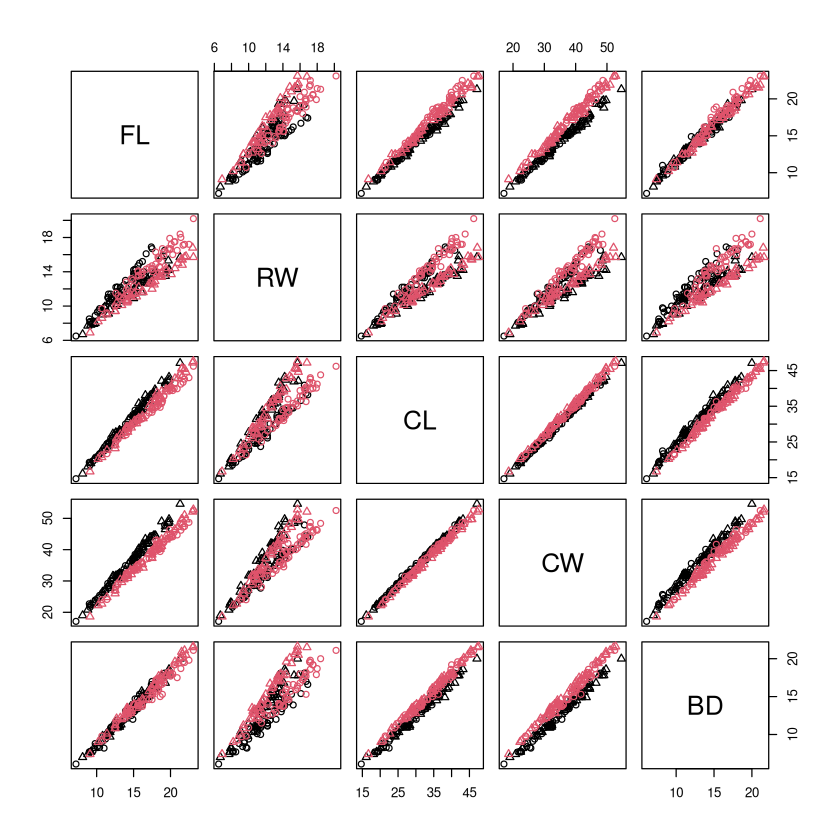

In [12]:
# Resumen de los datos
summary(crabs)

plot(crabs[,4:8], col=as.numeric(crabs[,1]), pch=as.numeric(crabs[,2]))

### Obtengo todas las modificaciones de los datos

En cada caso me voy a detener para ver como se logro separar los datos.

#### Logaritmo + PCA + Escalado

Importance of components:
                          PC1     PC2     PC3     PC4      PC5
Standard deviation     0.5179 0.07484 0.04803 0.02487 0.009075
Proportion of Variance 0.9689 0.02023 0.00833 0.00223 0.000300
Cumulative Proportion  0.9689 0.98914 0.99747 0.99970 1.000000

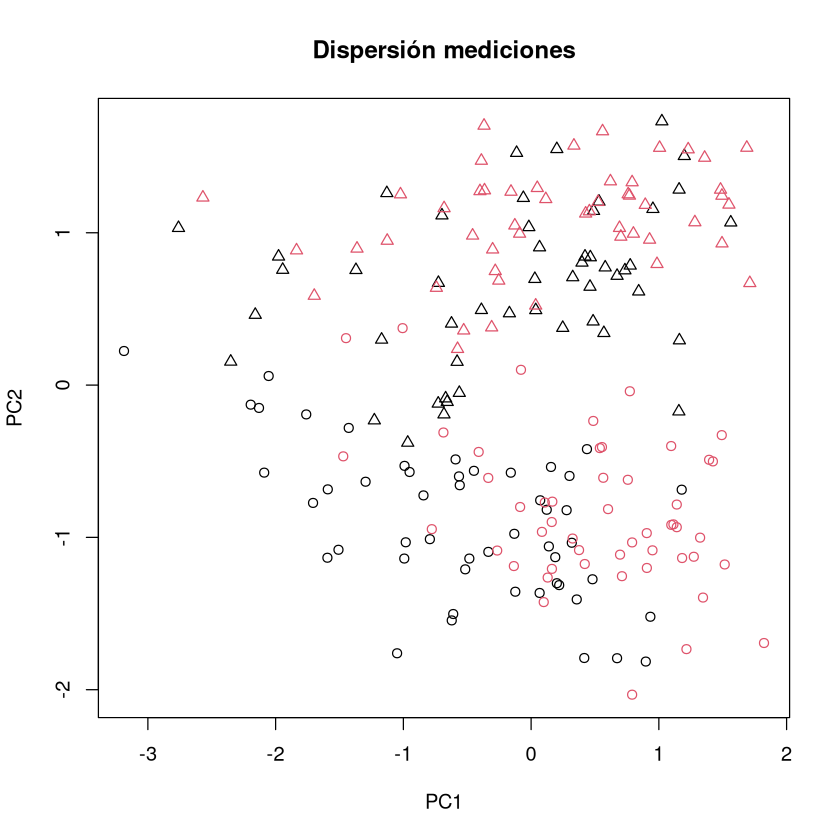

In [13]:
# Aplico la PCA
crabs_log.pca <- prcomp(crabs_log)
summary(crabs_log.pca)

# Escalo los datos
crabs_log.pca.scale.x <- scale(as.data.frame(crabs_log.pca$x))

# Grafico los datos
plot(crabs_log.pca.scale.x[], col=as.numeric(crabs[,1]), pch=as.numeric(crabs[,2]), main="Dispersión mediciones")

#### Logaritmo + Escalado + PCA

Importance of components:
                          PC1     PC2     PC3     PC4     PC5
Standard deviation     2.1976 0.34370 0.20180 0.10084 0.03871
Proportion of Variance 0.9659 0.02363 0.00814 0.00203 0.00030
Cumulative Proportion  0.9659 0.98952 0.99767 0.99970 1.00000

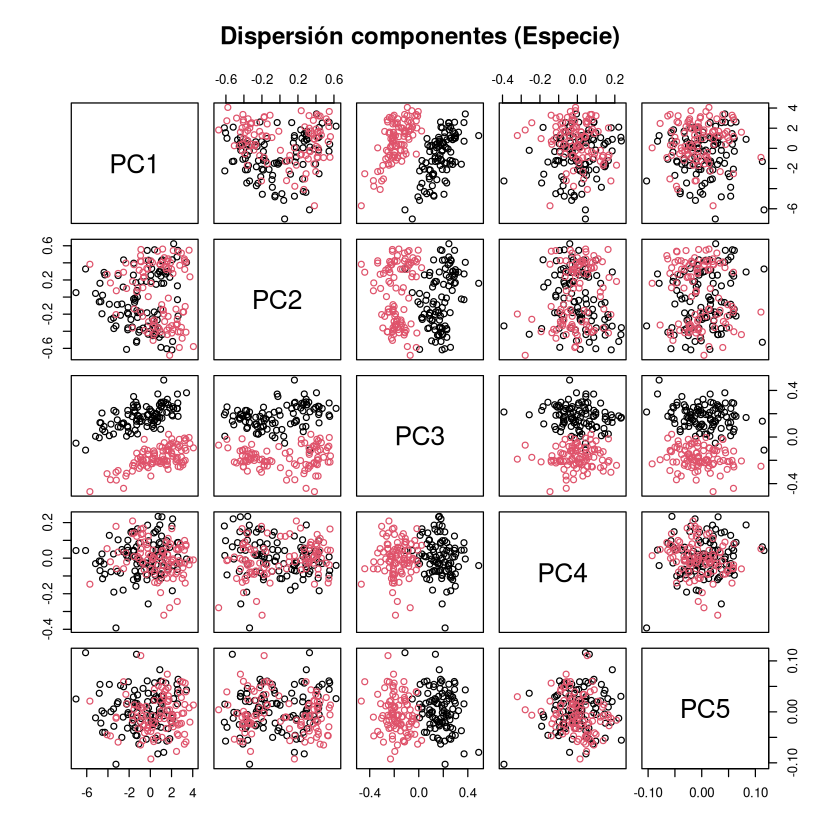

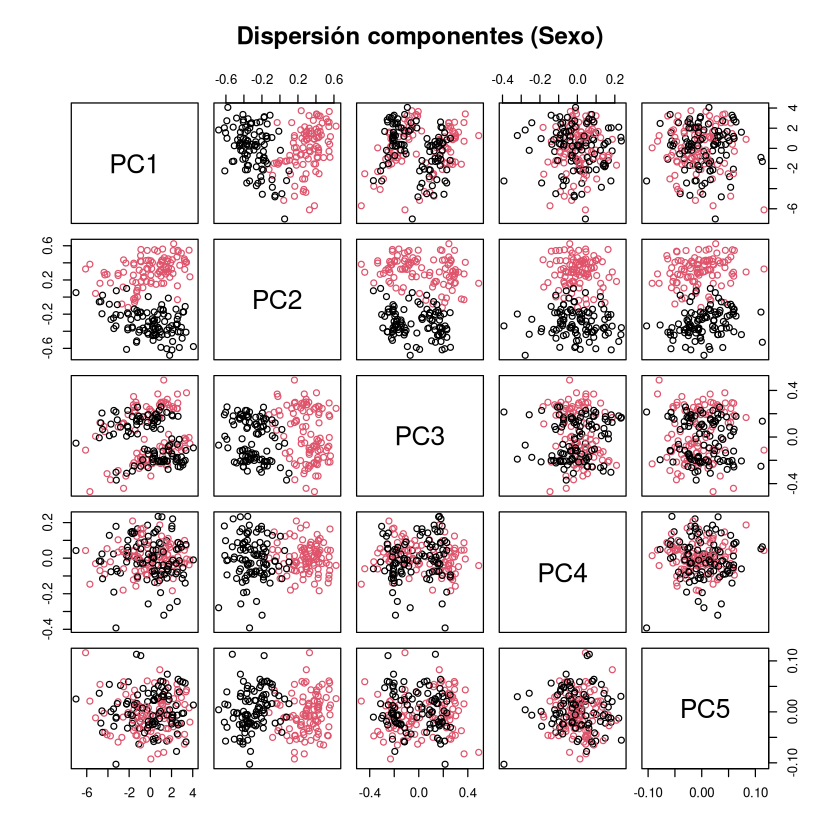

In [14]:
# Escalo los datos
crabs_log.scale <- scale(crabs_log)

# Descompongo en componentes principales
crabs_log.scale.pca <- prcomp(crabs_log.scale)
summary(crabs_log.scale.pca)

# Obtengo los datos de los componentes
crabs_log.scale.pca.x <- as.data.frame(crabs_log.scale.pca$x)

# Grafico los datos
plot(crabs_log.scale.pca.x, col=as.numeric(crabs[,1]), main="Dispersión componentes (Especie)")
plot(crabs_log.scale.pca.x, col=as.numeric(crabs[,2]), main="Dispersión componentes (Sexo)")

### Realizo el clustering

Voy a buscar si se puede separar en
+ **4 clusters**: De las 4 convinaciones posibles *Especie* + *Sexo*.
+ **2 clusters**: Intentar separar o bien por *Especie* ó por *Sexo*.

In [15]:
crabs.y <- crabs[,1:2]
crabs.y.comb <- paste(crabs.y$sp, crabs.y$sex, sep=".")
k4 <- 4
k2 <- 2

#### Buenas prácticas (fuera de R)

In [16]:
# Clasificación con k-means
calcular_kmeans <- function(x){
    crabs.kmeans.4 <- kmeans(x, centers=k4)
    crabs.kmeans.2 <- kmeans(x, centers=k2)

    # Clases comparadas con Especie + Sexo
    cat("Especie + Sexo\n")
    compararClases(crabs.y.comb, crabs.kmeans.4$cluster)
    cat("\n-----------------------------------------\n")
    cat("\nEspecie\n")
    compararClases(crabs.y[,1], crabs.kmeans.2$cluster)
    cat("\n-----------------------------------------\n")
    cat("\nSexo\n")
    compararClases(crabs.y[,2], crabs.kmeans.2$cluster)
    cat("\n-----------------------------------------\n")
    plot(x, col=as.factor(crabs.y.comb), pch=crabs.kmeans.4$cluster, main="Clasificación k-means (4 clusters)")
    plot(x, col=as.factor(crabs.y[,1]), pch=crabs.kmeans.2$cluster, main="Clasificación k-means (2 clusters sp)")
    plot(x, col=as.factor(crabs.y[,2]), pch=crabs.kmeans.2$cluster, main="Clasificación k-means (2 clusters sx)")
}

In [67]:
calcular_hclust <- function(x, methodUse = "compleat"){
    # Clasificación con hclust
    crabs.dist  <- dist(x)
    crabs.hclust <- hclust(crabs.dist, method = methodUse)

    plot(as.dendrogram(crabs.hclust))

    crabs.hclust.cut.2 <- cutree(crabs.hclust, k = 2)
    crabs.hclust.cut.4 <- cutree(crabs.hclust, k = 4)

    cat("Especie + Sexo\n")
    compararClases(crabs.y.comb, crabs.hclust.cut.4)
    cat("\n-----------------------------------------\n")
    cat("\nEspecie\n")
    compararClases(crabs.y[,1], crabs.hclust.cut.2)
    cat("\n-----------------------------------------\n")
    cat("\nSexo\n")
    compararClases(crabs.y[,2], crabs.hclust.cut.2)
    cat("\n-----------------------------------------\n")
    # Estan al final por problemas de visualización de R sobre jupyter
    plot(x, col=as.factor(crabs.y.comb), pch=crabs.hclust.cut.4, main="Clasificación hclust (4 clusters)")
    plot(x, col=as.factor(crabs.y[,1]), pch=crabs.hclust.cut.2, main="Clasificación hclust (2 clusters sp)")
    plot(x, col=as.factor(crabs.y[,2]), pch=crabs.hclust.cut.2, main="Clasificación k-means (2 clusters sx)")
}

#### Aplico k-means sobre Logaritmo + PCA + Escalado

Especie + Sexo
Direct agreement: 2 of 4 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 61 %
           agrupacion2
agrupacion1  4  2  1  3
        B.F 28 16  0  6
        B.M 11 38  0  1
        O.F  1  0 34 15
        O.M  0  1 27 22

-----------------------------------------

Especie
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 100 %
           agrupacion2
agrupacion1   2   1
          B 100   0
          O   0 100

-----------------------------------------

Sexo
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 50 %
           agrupacion2
agrupacion1  1  2
          F 50 50
          M 50 50

-----------------------------------------


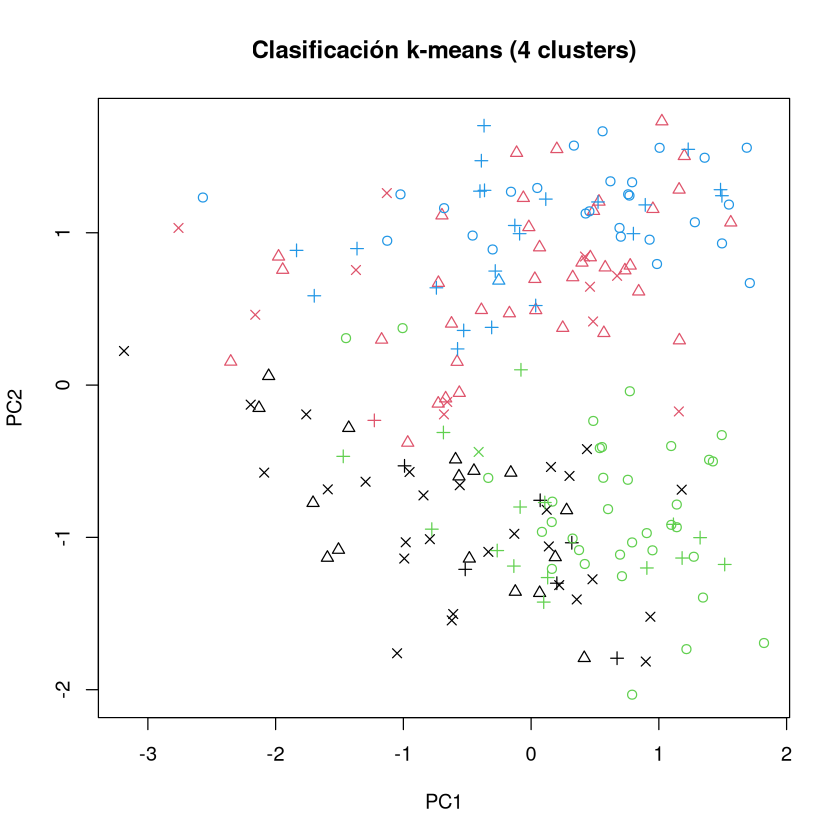

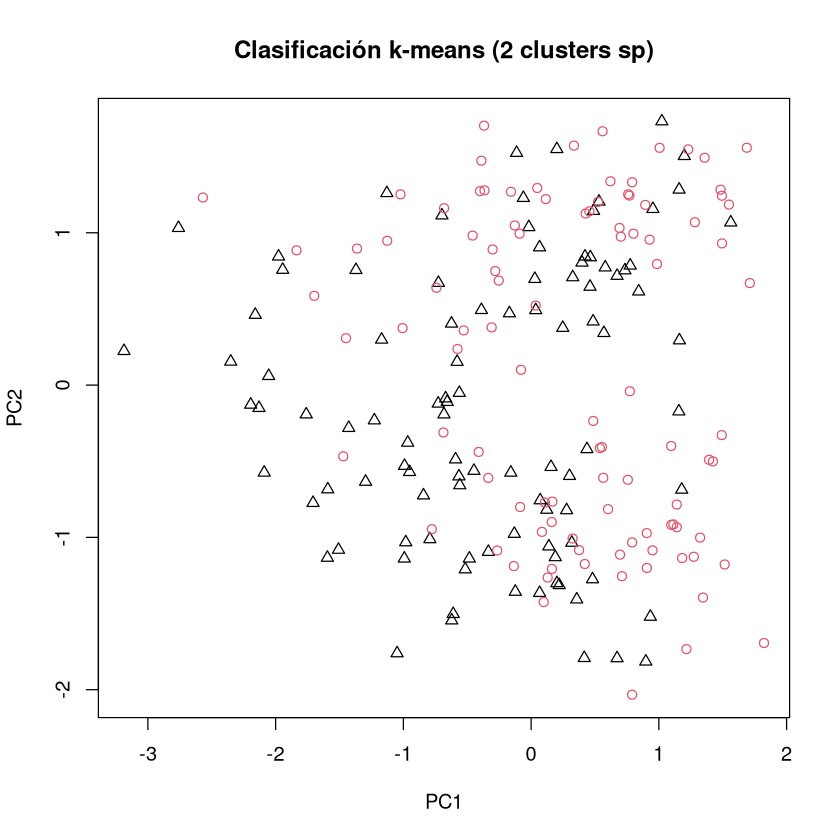

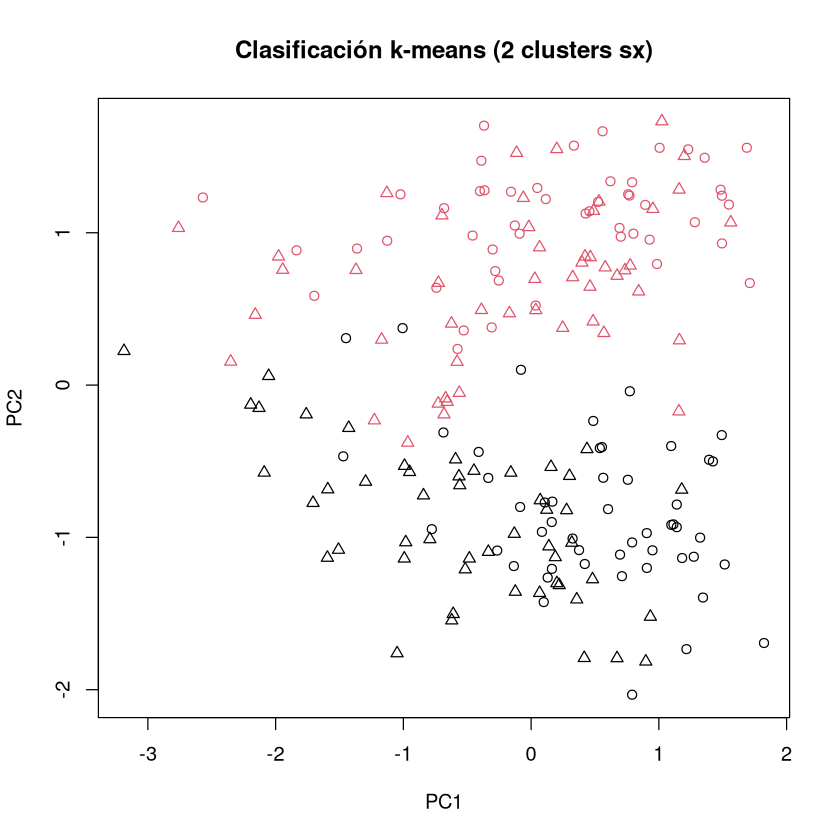

In [18]:
calcular_kmeans(crabs_log.pca.scale.x)

#### Aplico k-means sobre Logaritmo + Escalado + PCA


Especie + Sexo
Direct agreement: 0 of 4 pairs
Iterations for permutation matching: 24 
Cases in matched pairs: 35 %
           agrupacion2
agrupacion1  3  2  1  4
        B.F 11 18  4 17
        B.M  6 20 10 14
        O.F  2 18 24  6
        O.M  4 12 19 15

-----------------------------------------

Especie
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 60.5 %
           agrupacion2
agrupacion1  1  2
          B 48 52
          O 27 73

-----------------------------------------

Sexo
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.5 %
           agrupacion2
agrupacion1  2  1
          F 64 36
          M 61 39

-----------------------------------------


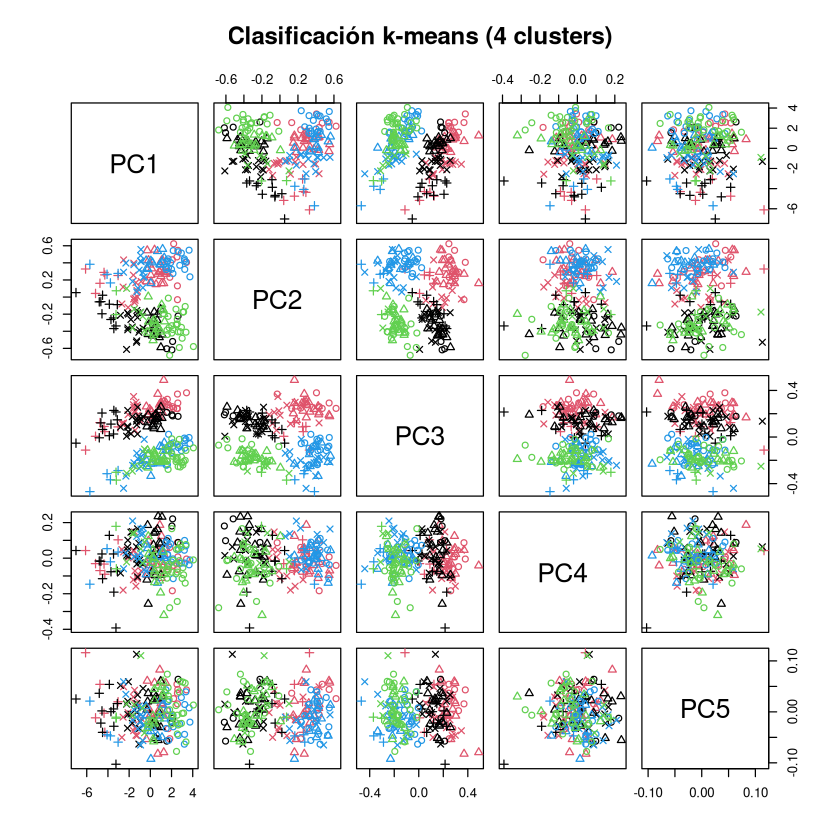

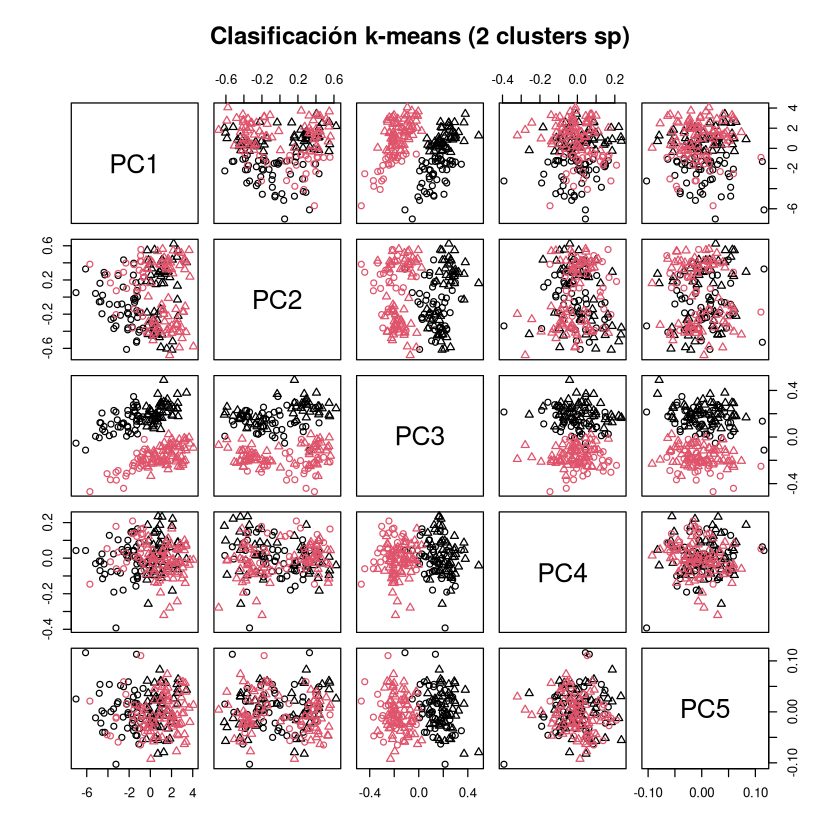

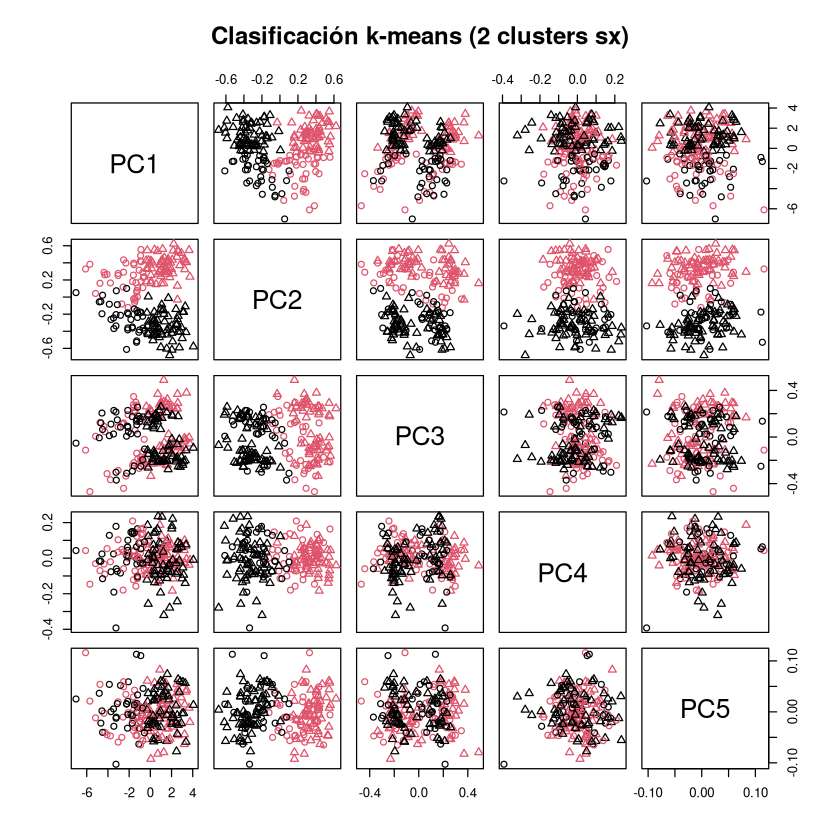

In [19]:
calcular_kmeans(crabs_log.scale.pca.x)


#### Aplico hclust sobre Logaritmo + Escalado + PCA

Especie + Sexo
Direct agreement: 0 of 4 pairs
Iterations for permutation matching: 24 
Cases in matched pairs: 33.5 %
           agrupacion2
agrupacion1  1  3  4  2
        B.F 12 21  1 16
        B.M  7 25  5 13
        O.F  2 27 15  6
        O.M  4 22  9 15

-----------------------------------------

Especie
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 60.5 %
           agrupacion2
agrupacion1  1  2
          B 48 52
          O 27 73

-----------------------------------------

Sexo
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.5 %
           agrupacion2
agrupacion1  2  1
          F 64 36
          M 61 39

-----------------------------------------


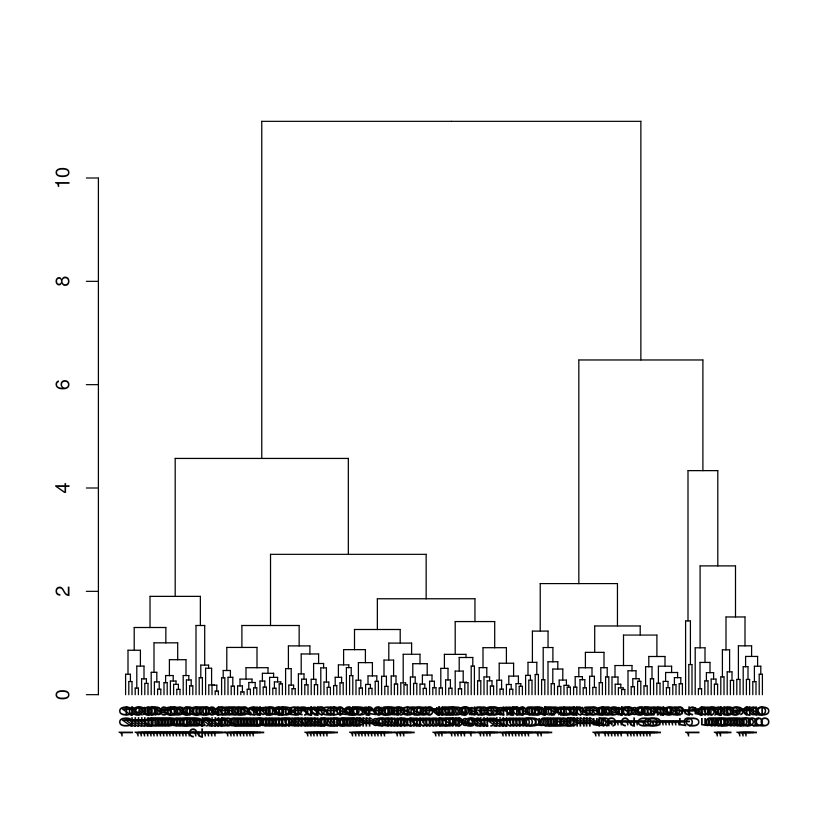

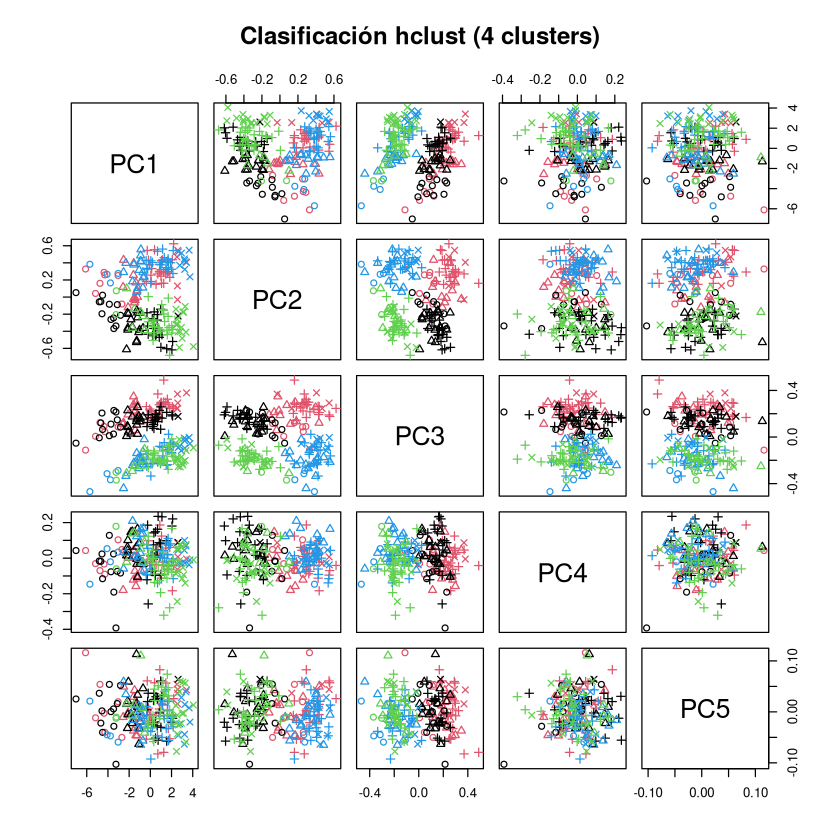

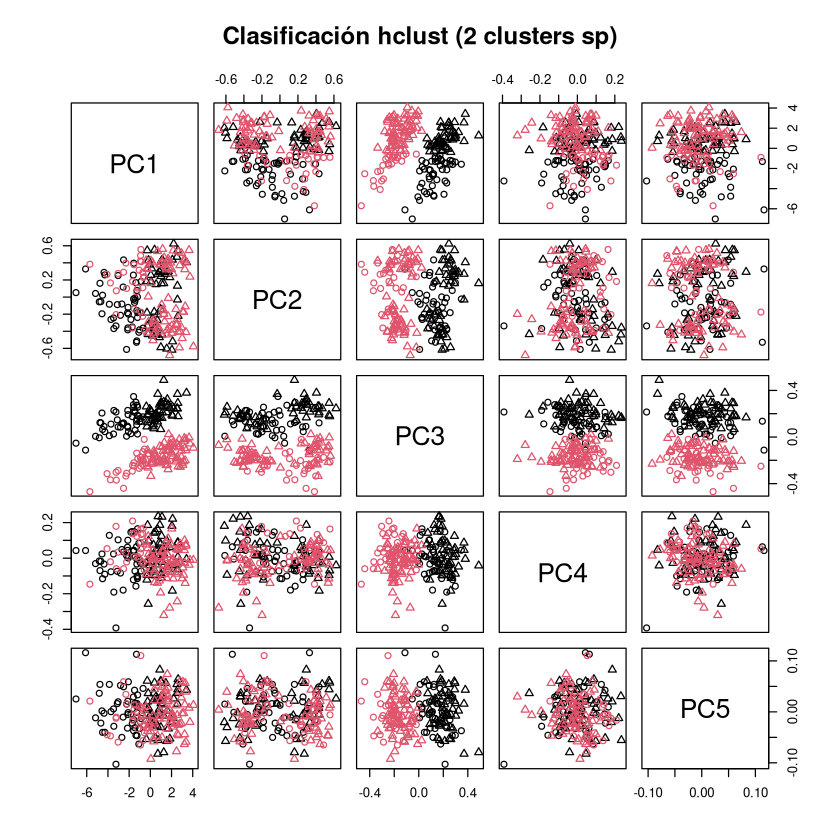

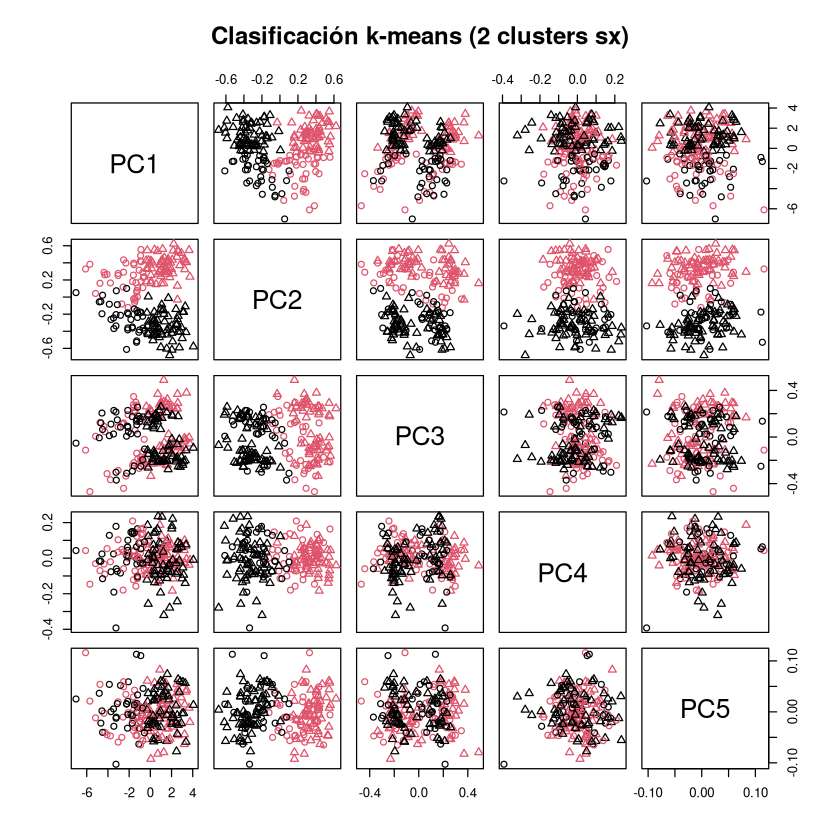

In [68]:
calcular_hclust(crabs_log.scale.pca.x, "complete")

Especie + Sexo
Direct agreement: 1 of 4 pairs
Iterations for permutation matching: 6 
Cases in matched pairs: 36 %
           agrupacion2
agrupacion1  2  1  4  3
        B.F 11  1 22 16
        B.M  8  1 23 18
        O.F  3  0 41  6
        O.M  5  1 25 19

-----------------------------------------

Especie
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 50.5 %
           agrupacion2
agrupacion1  1  2
          B  2 98
          O  1 99

-----------------------------------------

Sexo
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 50.5 %
           agrupacion2
agrupacion1  2  1
          F 99  1
          M 98  2

-----------------------------------------


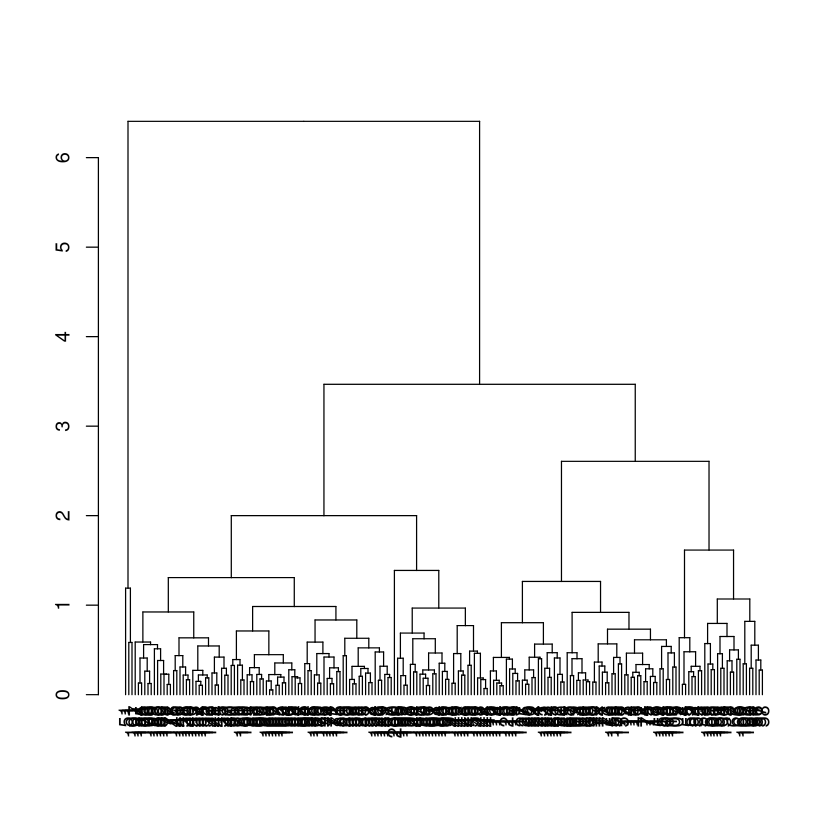

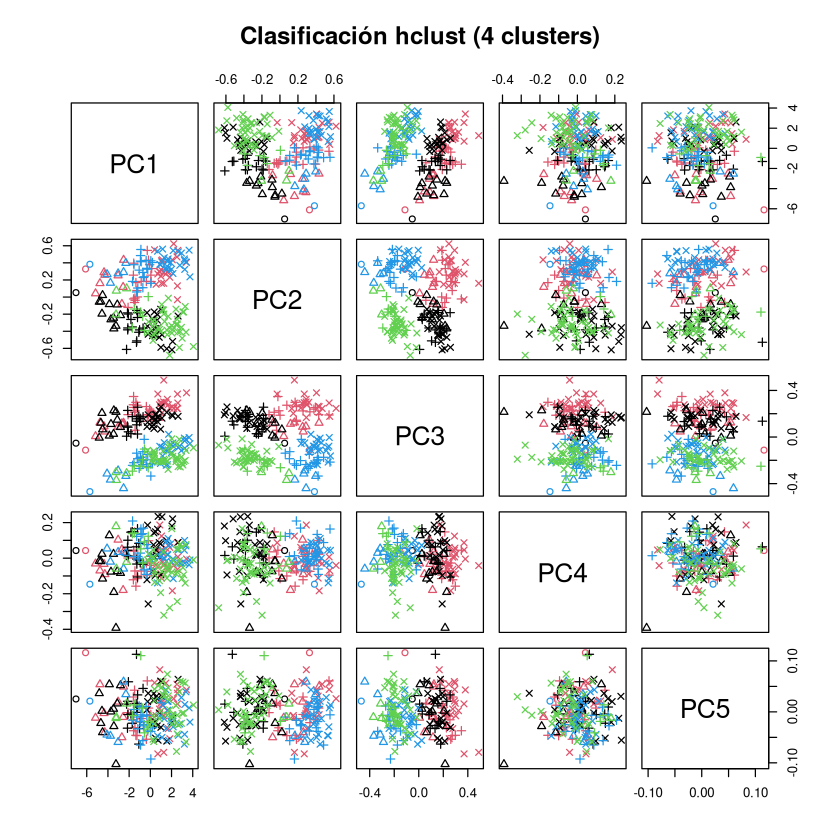

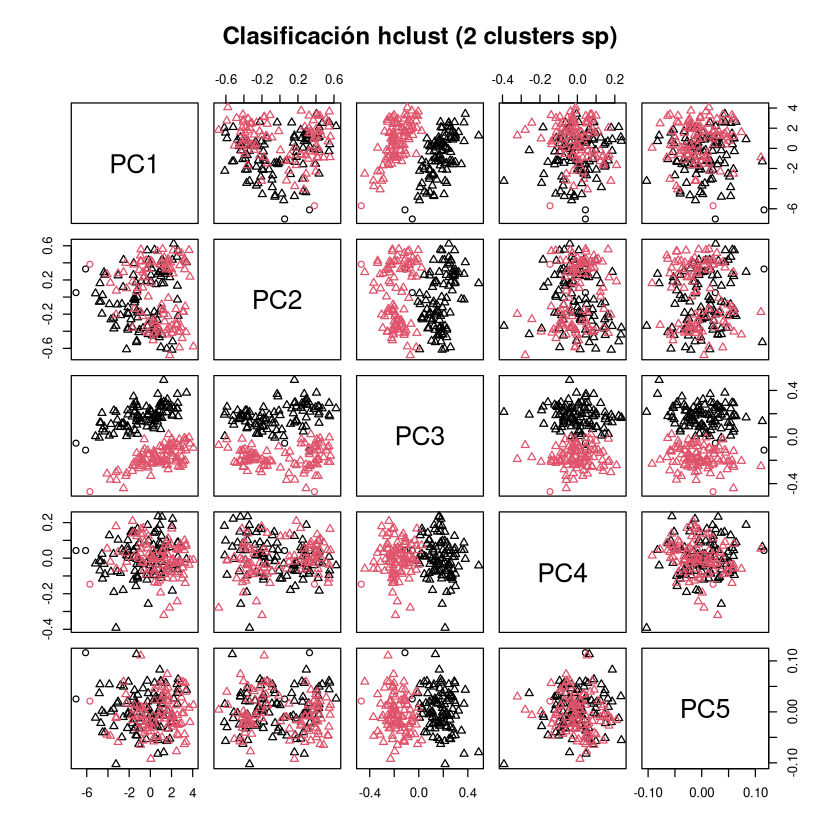

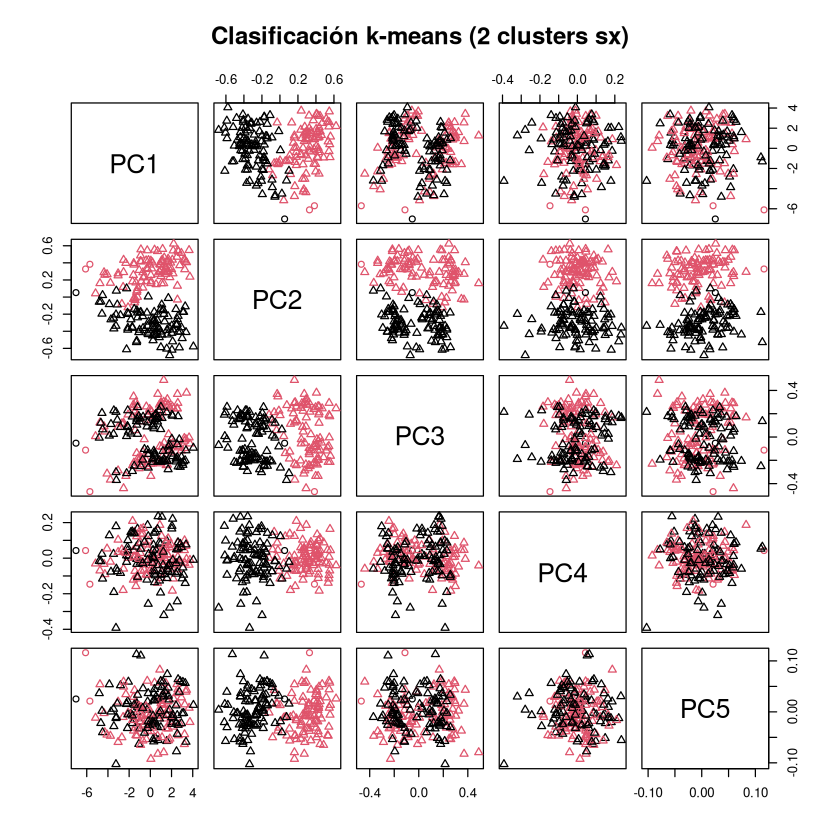

In [21]:
calcular_hclust(crabs_log.scale.pca.x, "average")

Especie + Sexo
Direct agreement: 0 of 4 pairs
Iterations for permutation matching: 24 
Cases in matched pairs: 26 %
           agrupacion2
agrupacion1  3  1  4  2
        B.F  1  0  0 49
        B.M  0  1  0 49
        O.F  0  0  1 49
        O.M  0  1  0 49

-----------------------------------------

Especie
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 50.5 %
           agrupacion2
agrupacion1   2   1
          B   1  99
          O   0 100

-----------------------------------------

Sexo
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 50.5 %
           agrupacion2
agrupacion1   2   1
          F   1  99
          M   0 100

-----------------------------------------


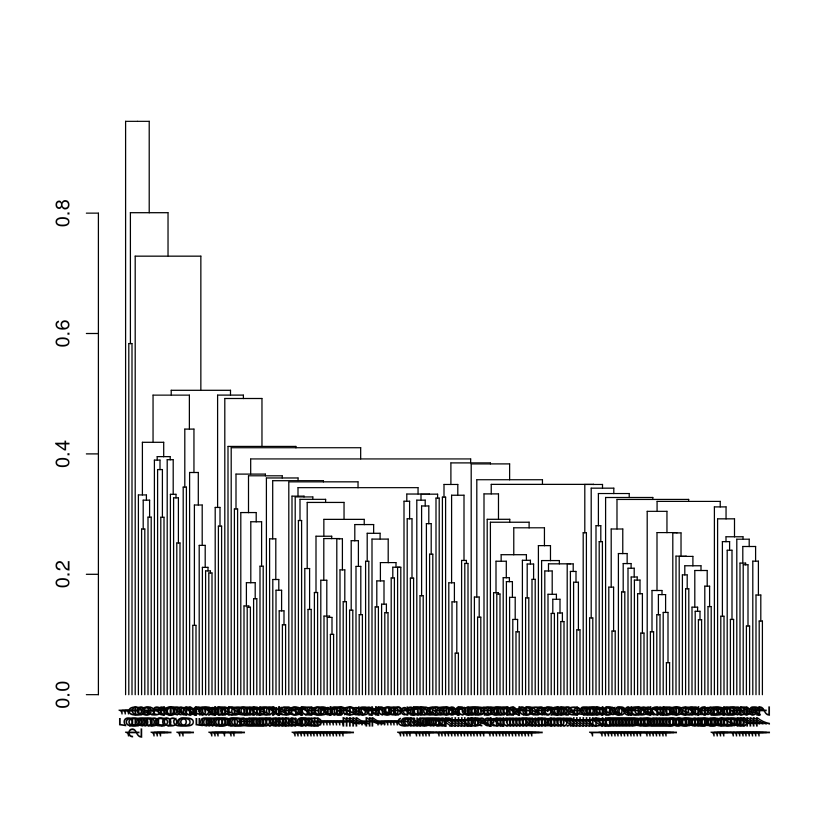

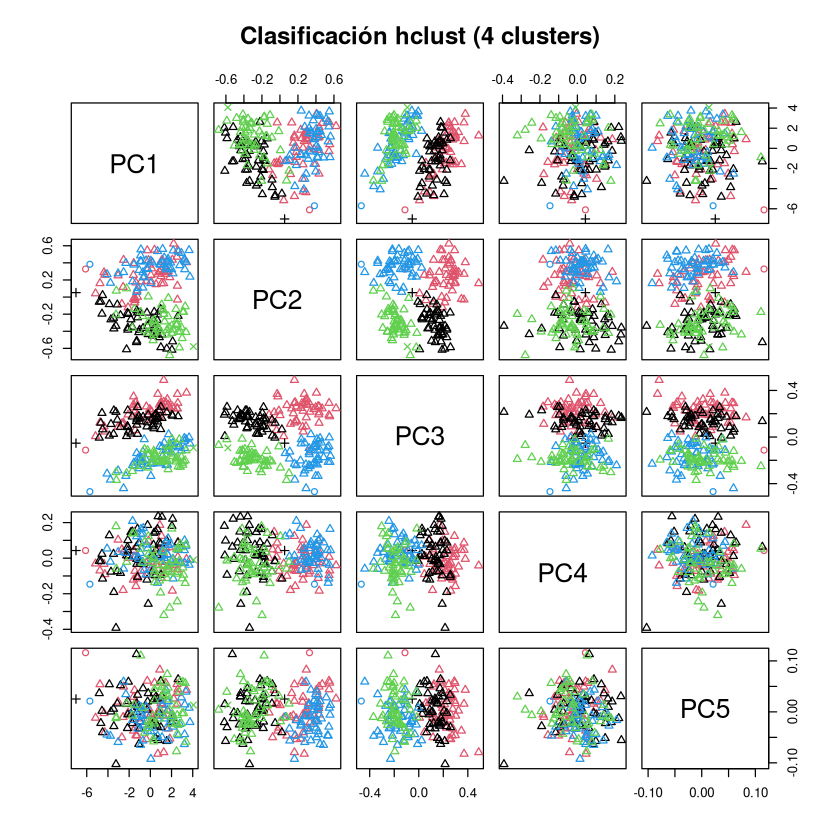

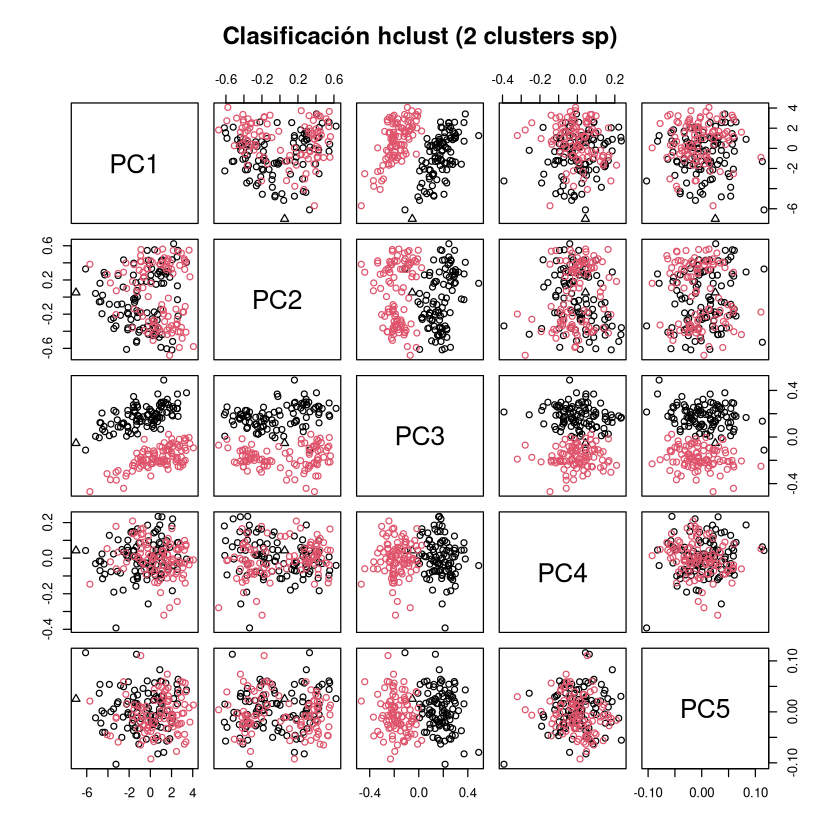

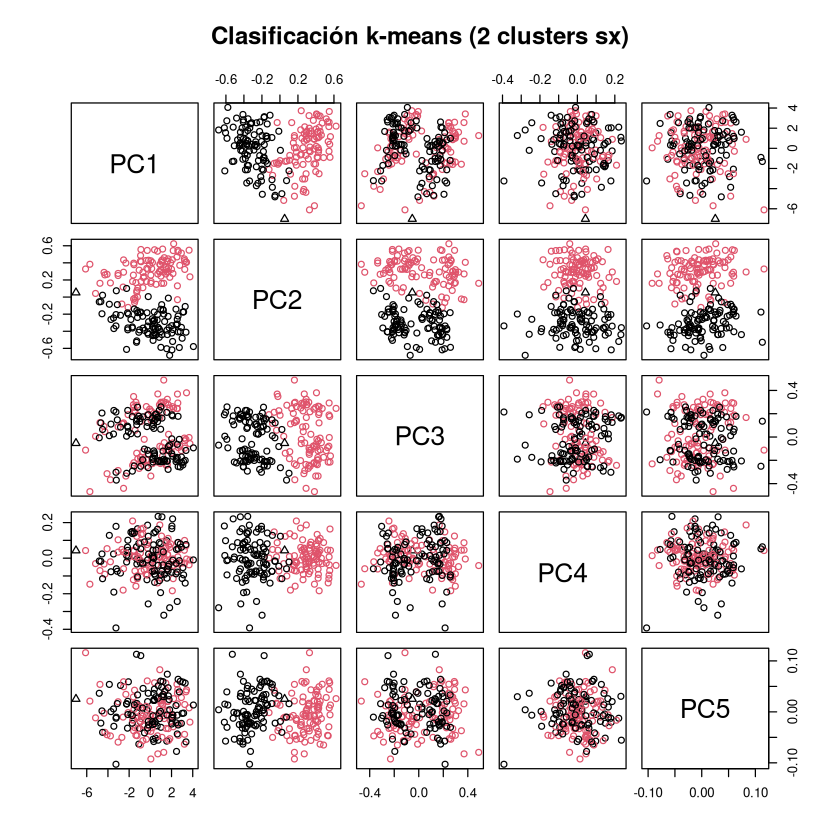

In [22]:
calcular_hclust(crabs_log.scale.pca.x, "single")

#### Aplico hclust sobre Logaritmo + PCA + Escalado


Especie + Sexo
Direct agreement: 1 of 4 pairs
Iterations for permutation matching: 6 
Cases in matched pairs: 38.5 %
           agrupacion2
agrupacion1  1  3  4  2
        B.F  1  3  3 43
        B.M  1 19  0 30
        O.F  2 17 10 21
        O.M  3  0  0 47

-----------------------------------------

Especie
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 53.5 %
           agrupacion2
agrupacion1  1  2
          B 97  3
          O 90 10

-----------------------------------------

Sexo
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 56.5 %
           agrupacion2
agrupacion1   2   1
          F  13  87
          M   0 100

-----------------------------------------


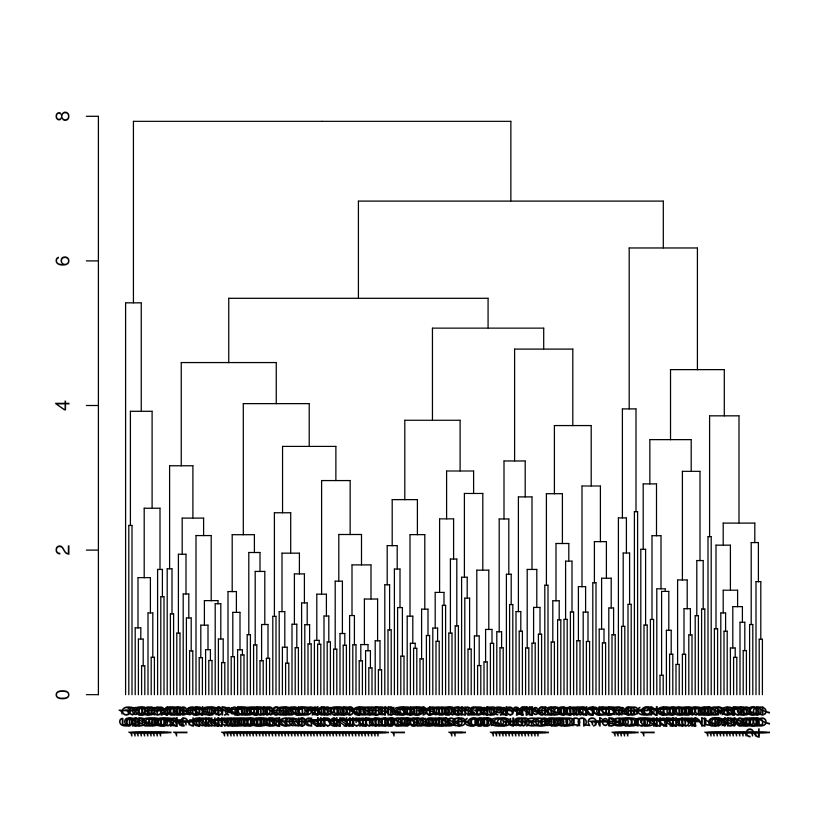

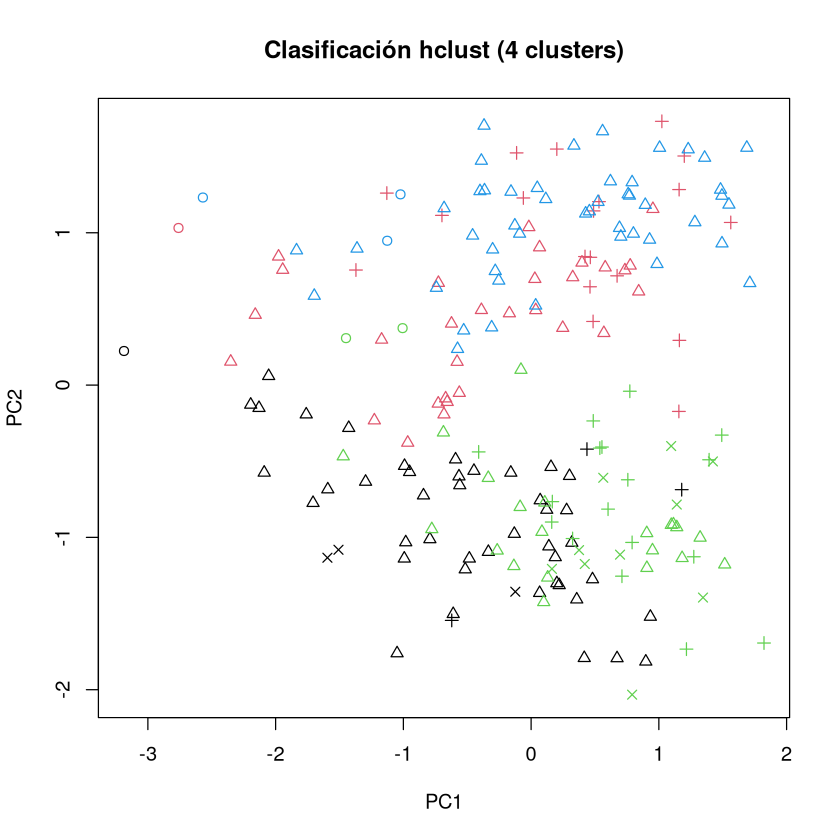

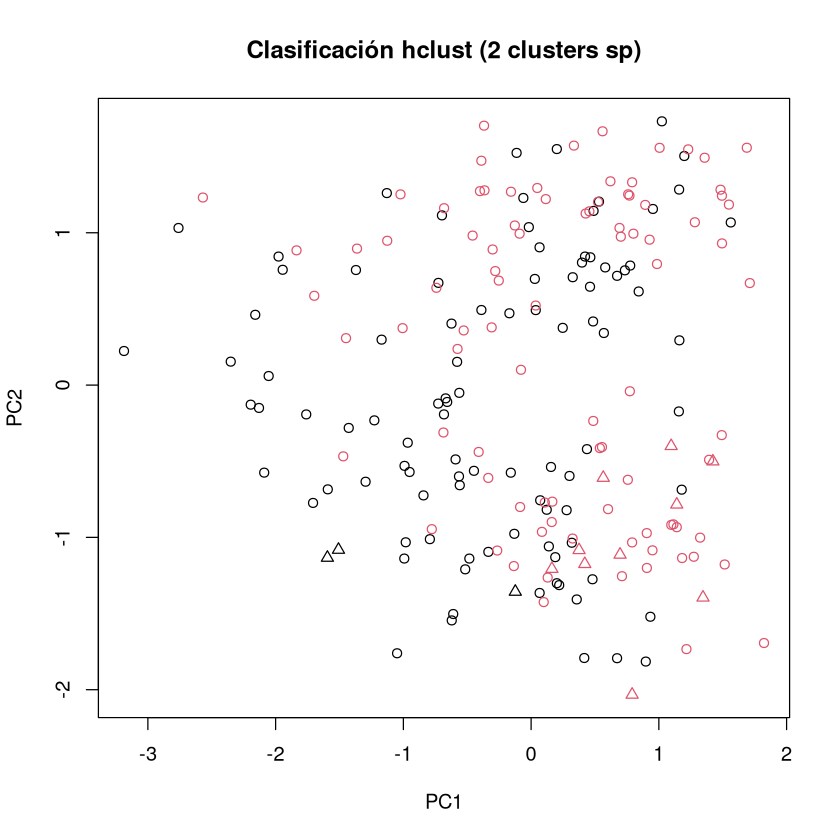

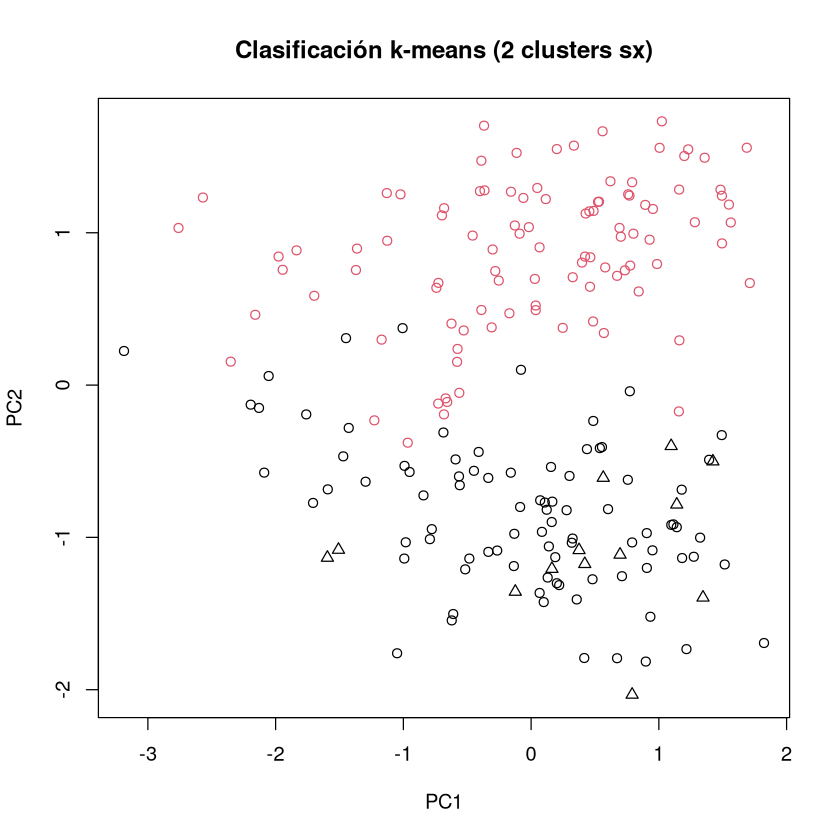

In [69]:
calcular_hclust(crabs_log.pca.scale.x, "complete")

Especie + Sexo
Direct agreement: 0 of 4 pairs
Iterations for permutation matching: 24 
Cases in matched pairs: 27.5 %
           agrupacion2
agrupacion1  3  1  4  2
        B.F  1  4  1 44
        B.M  0  4  0 46
        O.F  0  3  3 44
        O.M  0  3  0 47

-----------------------------------------

Especie
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 50.5 %
           agrupacion2
agrupacion1   2   1
          B   1  99
          O   0 100

-----------------------------------------

Sexo
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 50.5 %
           agrupacion2
agrupacion1   2   1
          F   1  99
          M   0 100

-----------------------------------------


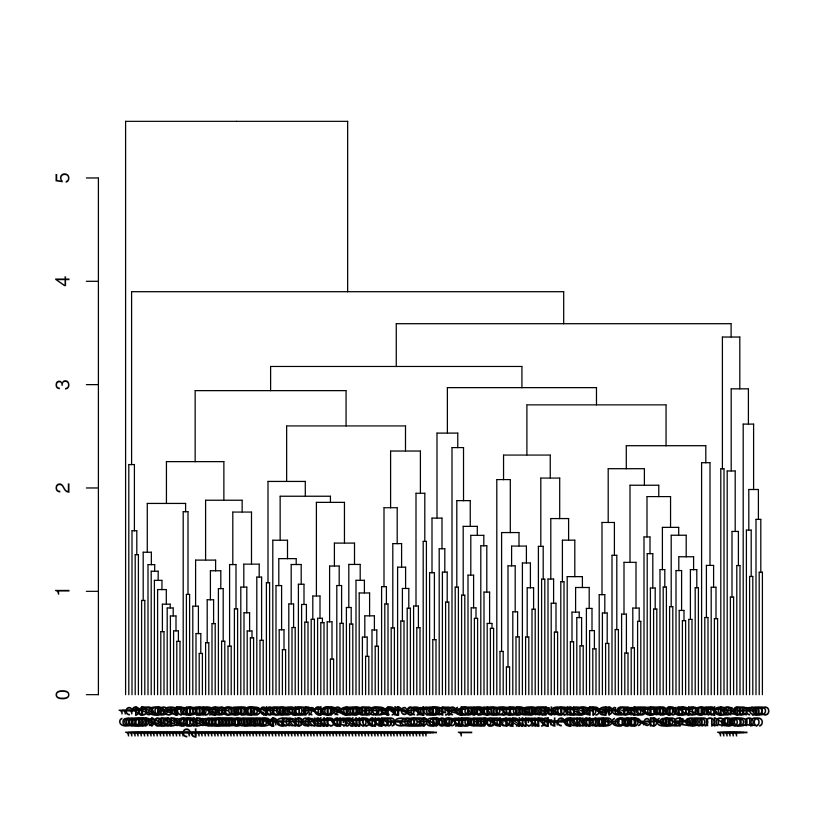

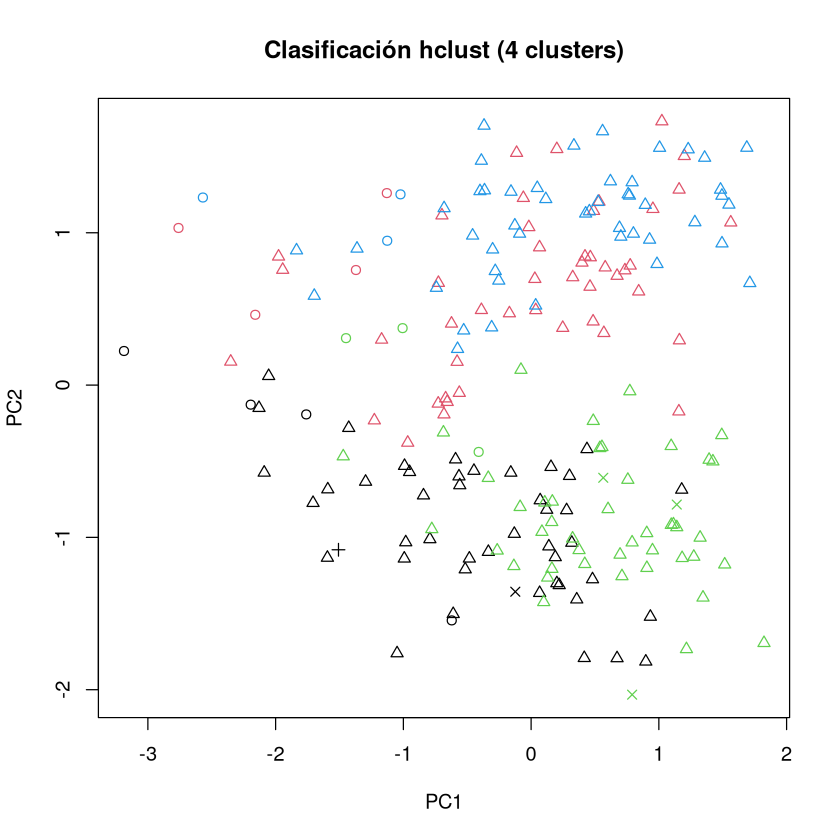

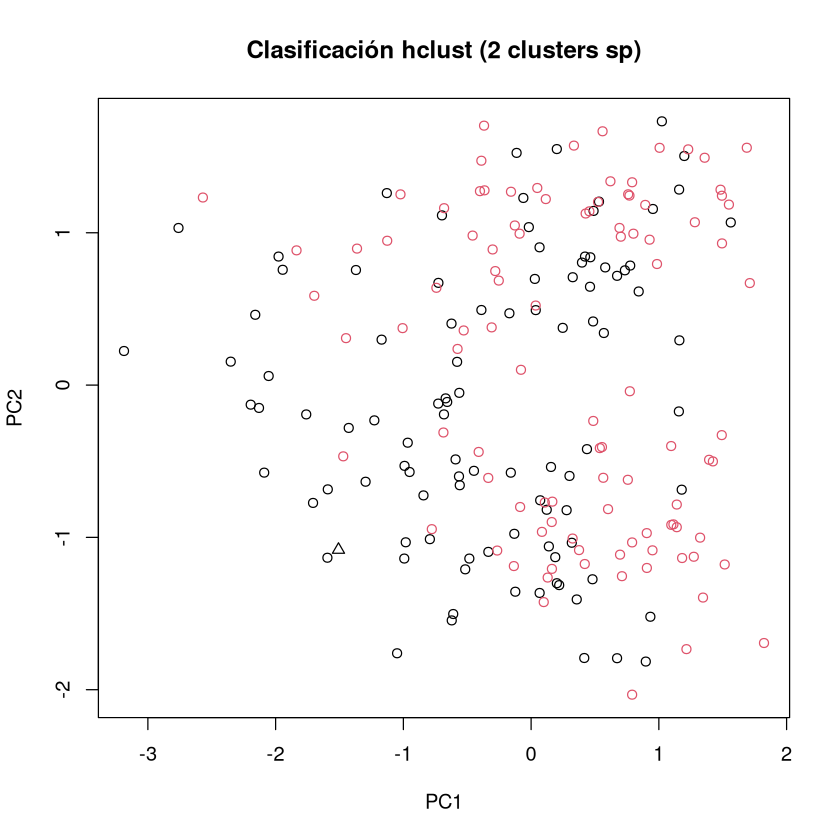

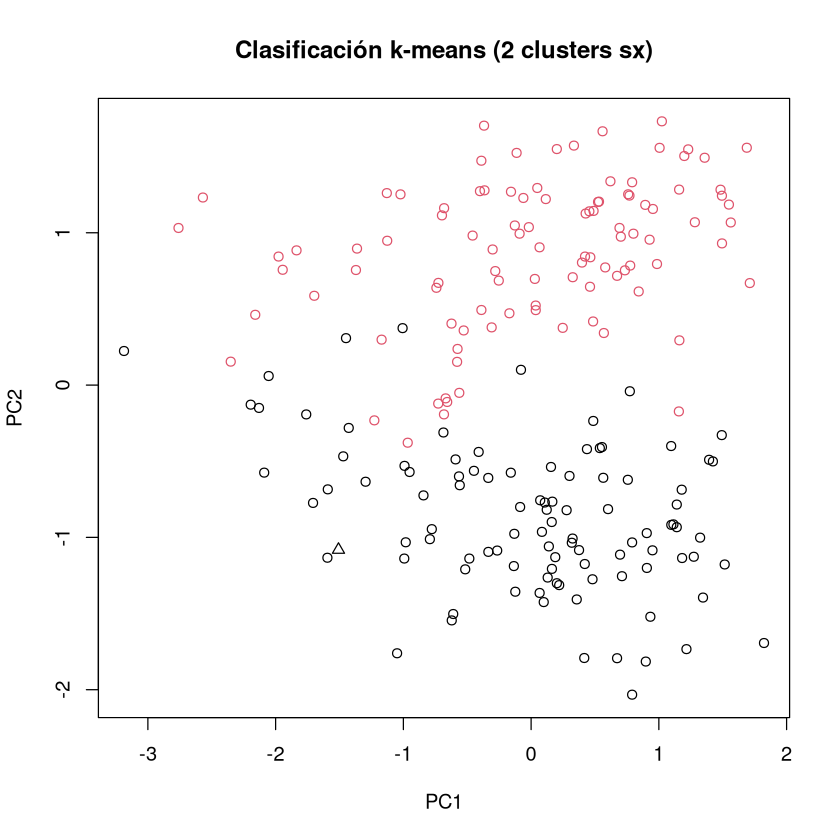

In [70]:
calcular_hclust(crabs_log.pca.scale.x, "average")

Especie + Sexo
Direct agreement: 1 of 4 pairs
Iterations for permutation matching: 6 
Cases in matched pairs: 26.5 %
           agrupacion2
agrupacion1  3  1  4  2
        B.F  1  0  0 49
        B.M  0  1  0 49
        O.F  0  0  1 49
        O.M  0  0  0 50

-----------------------------------------

Especie
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 50.5 %
           agrupacion2
agrupacion1   2   1
          B   1  99
          O   0 100

-----------------------------------------

Sexo
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 50.5 %
           agrupacion2
agrupacion1   2   1
          F   1  99
          M   0 100

-----------------------------------------


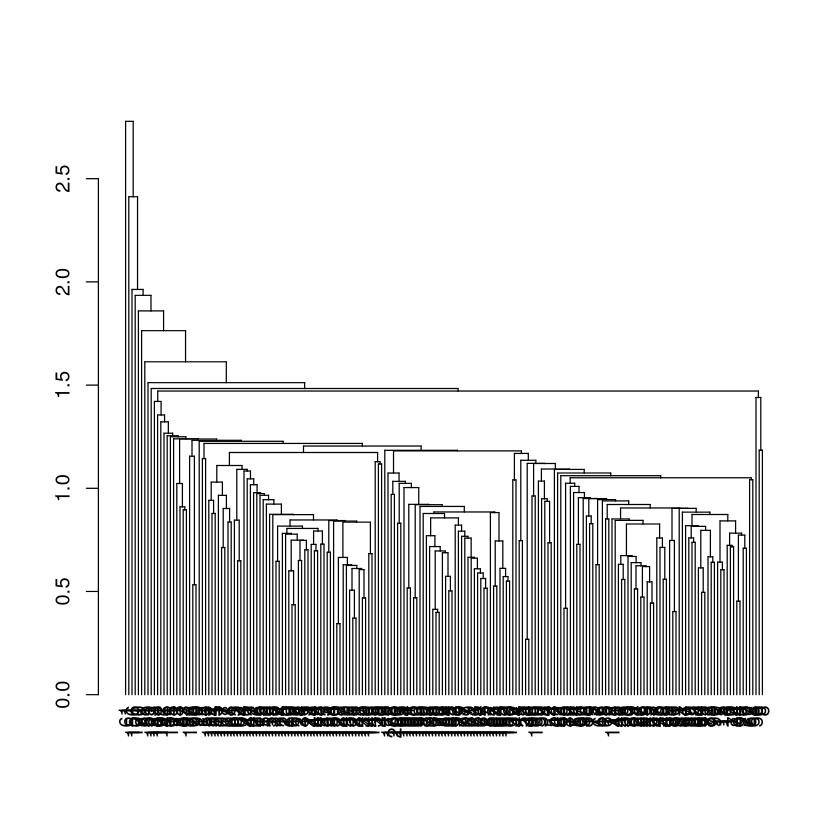

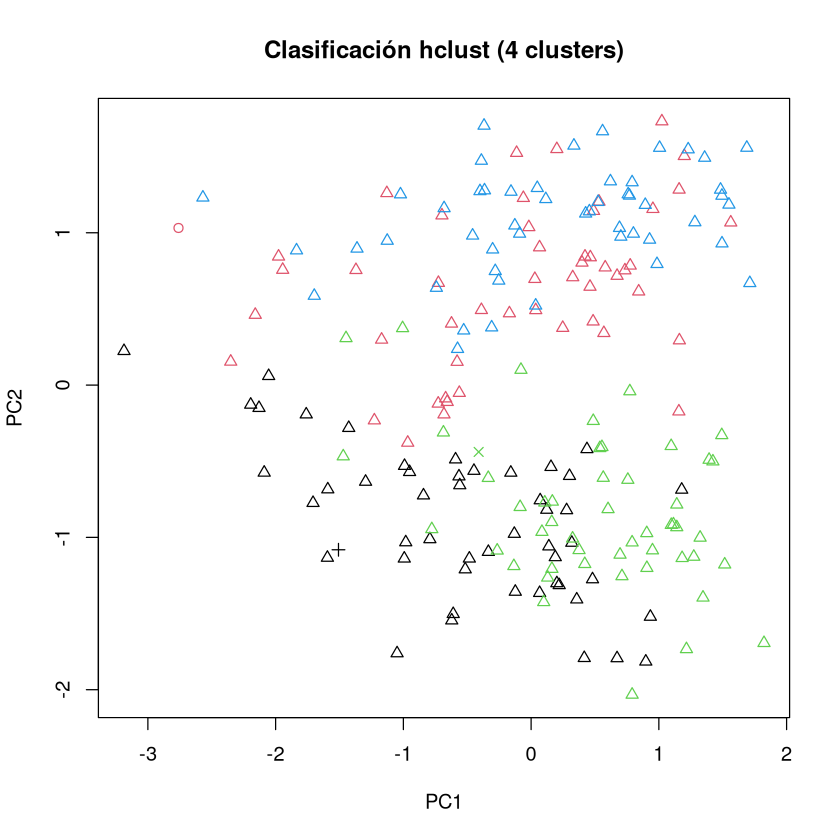

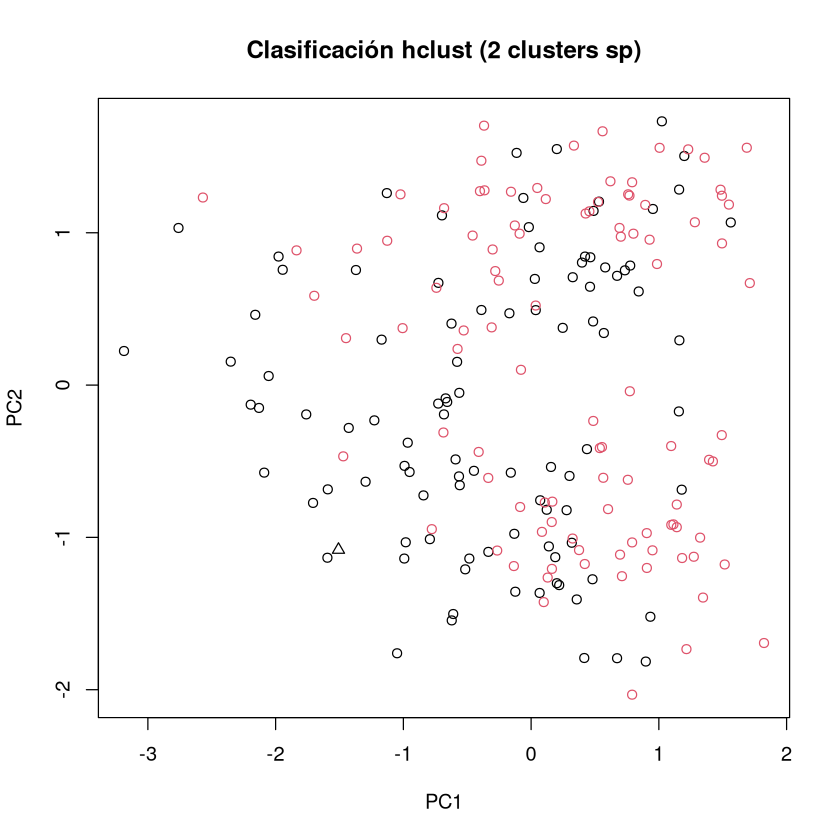

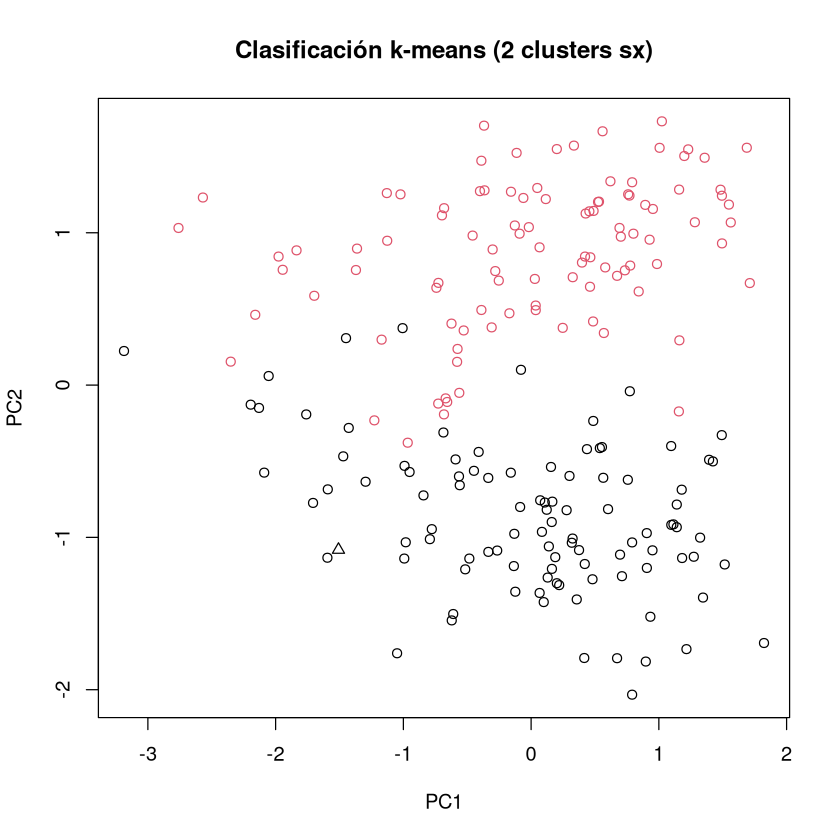

In [25]:
calcular_hclust(crabs_log.pca.scale.x, "single")

### Conclusiones

Comparando, combinando *Especie* y *Sexo* puedo ver que comparado con los datos originales se logran recuperar las clases originales con un porcentaje de la siguiente forma:
| Trasformación   | k-means | hclust(compleat) | hclust(average) | hclust(single) |
|:----------------|:--------|:-----------------|:----------------|:---------------|
| log+PCA+Escalado| 61      | 38               | 27              | 26             |
| log+Escalado+PCA| 35      | 33               | 36              | 26             |

En el caso de comparar la clase *Especie* original para los datos con la forma de obtenida tengo

| Trasformación   | k-means | hclust(compleat) | hclust(average) | hclust(single) |
|:----------------|:--------|:-----------------|:----------------|:---------------|
| log+PCA+Escalado| 100     | 53               | 50              | 50             |
| log+Escalado+PCA| 60      | 60               | 50              | 50             |

Por último al comparar las clases con las obtenidas al realizar clustering para *Sexo* observo que se logró que coincidieran

| Trasformación   | k-means | hclust(compleat) | hclust(average) | hclust(single) |
|:----------------|:--------|:-----------------|:----------------|:---------------|
| log+PCA+Escalado| 75      | 56               | 50              | 50             |
| log+Escalado+PCA| 51      |   51             | 50              | 50             |



## 1.b. Intentar clusterizar *Lampone*
para este segundo caso voy a intentar recuperar las clases originales del dataset *lampone*. En este conjunto de datos existen dos clasificaciones de los datos:
+ Año de la medición (**anno**)
+ Especie de blueberry (**N_tipo**)

La idea va a ser aplicar distintas tácticas para lograr separar en clusters al igual que el anterior.
+ Logaritmo + PCA + Escalado
+ Logaritmo + Escalado + PCA

Primero con **k-means** y luego con **hclust**

,anno,m33,m34,m35,m36,m40,m41,m42,m43,m44,⋯,m183,m185,m187,m191,m193,m194,m195,m205,N_tipo,Numero
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>
11,2006,32.24,0.27,0.06,0.01,0,0.30,0.02,2.05,0.11,⋯,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0,2,2e
12,2006,33.41,0.34,0.05,0.01,0,0.12,0.02,10.42,0.25,⋯,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0,2,2d
13,2006,31.93,0.32,0.05,0.01,0,0.09,0.02,9.32,0.24,⋯,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0,2,2c
14,2006,43.62,0.45,0.08,0.02,0,0.11,0.02,12.67,0.31,⋯,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0,2,2a
15,2006,47.08,0.47,0.09,0.02,0,0.20,0.03,3.19,0.12,⋯,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0,2,2b
16,2006,21.38,0.20,0.03,0.00,0,0.06,0.01,12.01,0.27,⋯,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0,2,2i
17,2006,37.20,0.38,0.06,0.01,0,0.07,0.02,3.45,0.14,⋯,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0,2,2h
18,2006,57.00,0.51,0.08,0.00,0,0.08,0.02,2.63,0.09,⋯,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0,2,2g
19,2006,13.31,0.16,0.02,0.00,0,0.14,0.02,11.92,0.26,⋯,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0,2,2f


[1]  49 144

   anno         m33              m34              m35             m36         
 2006:19   Min.   : 13.31   Min.   :0.1600   Min.   :0.020   Min.   :0.00000  
 2007:30   1st Qu.: 37.70   1st Qu.:0.3900   1st Qu.:0.060   1st Qu.:0.01000  
           Median : 63.97   Median :0.6500   Median :0.110   Median :0.01000  
           Mean   : 69.47   Mean   :0.7751   Mean   :0.132   Mean   :0.01143  
           3rd Qu.: 80.30   3rd Qu.:0.9800   3rd Qu.:0.170   3rd Qu.:0.01000  
           Max.   :255.31   Max.   :2.9500   Max.   :0.540   Max.   :0.02000  
                                                                              
      m40         m41              m42               m43       
 Min.   :0   Min.   :0.0600   Min.   :0.01000   Min.   : 1.49  
 1st Qu.:0   1st Qu.:0.1400   1st Qu.:0.02000   1st Qu.: 5.45  
 Median :0   Median :0.2500   Median :0.03000   Median :10.42  
 Mean   :0   Mean   :0.2818   Mean   :0.03449   Mean   :15.09  
 3rd Qu.:0   3rd Qu.:0.3700   3rd Qu.:0.04000   

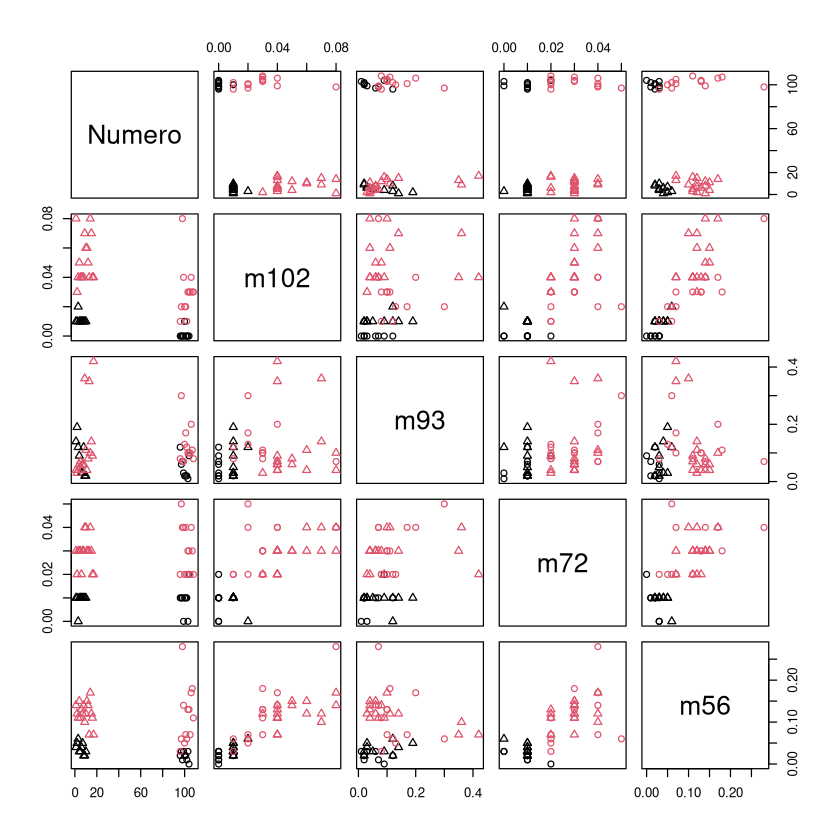

In [26]:
load("./Pablo/lampone.Rdata")

# Primer vistazo a su composición
lampone

# Clasificaciones 
# - Año de medición (1)
# - Especie de blueberry (143)
dim(lampone)
summary(lampone)
# Este gráfico no tiene sentido, ya que no se puede graficar 143 dimensiones y entender algo
# plot(lampone, -c(1,143), col=as.numeric(crabs[,1]), pch=as.numeric(crabs[,143]))
ltShow = sample(c(2:142,144), 5, replace = FALSE, prob = NULL)
plot(lampone[,ltShow], , col=lampone[,1], pch=as.numeric(lampone[,143]))
# , col=lampone[,1], pch=lampone[,143]

In [27]:
lampone.y <- lampone[,c(1,143)]
lampone.y.comb <- paste(lampone.y[,1], lampone.y[,2], sep=".")

lampone.x <- lampone[,-c(1,143)]

# hay columnas que no son numéricas molestando, las borro
columnas_numericas <- sapply(lampone.x, is.numeric)
lampone.x <- lampone.x[,columnas_numericas]

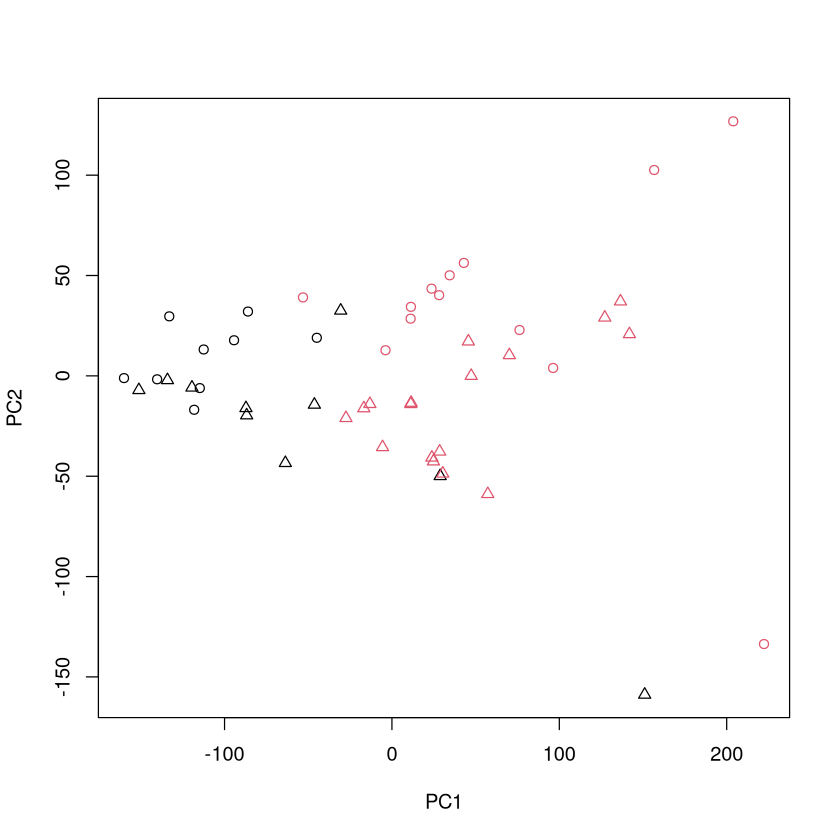

In [28]:
lampone.x.pca <- prcomp(lampone.x)
plot(lampone.x.pca$x[, 1:2], col = as.numeric(lampone[, 1]), pch = as.numeric(lampone[, 143]))

In [29]:
lampone.x.pca.scale <- scale(as.data.frame(lampone.x.pca$x))

### Funciones útiles

In [30]:
calcular_kmeans <- function(x){
    lampone.kmeans.4 <- kmeans(x, centers=k4)
    lampone.kmeans.2 <- kmeans(x, centers=k2)

    cat("Año + variedad\n")
    compararClases(lampone.y.comb, lampone.kmeans.4$cluster)
    cat("\n-----------------------------------------\n")
    cat("\nAño\n")
    compararClases(lampone.y[,1],  lampone.kmeans.2$cluster)
    cat("\n-----------------------------------------\n")
    cat("\nVariedad\n")
    compararClases(lampone.y[,2],  lampone.kmeans.2$cluster)
    cat("\n-----------------------------------------\n")
    
    # Mostralas a todas no tiene mucho sentido, pero si algunas
    # muestro las primeras 5 columnas (las primeras son interesantes luego de la PCA)
    plot(x[,1:5], col=as.factor(lampone.y.comb), pch=lampone.kmeans.4$cluster, main="Clasificación k-means (4 clusters)")
    plot(x[,1:5], col=as.factor(lampone.y[,1]),  pch=lampone.kmeans.2$cluster, main="Clasificación k-means (2 clusters año)")
    plot(x[,1:5], col=as.factor(lampone.y[,2]),  pch=lampone.kmeans.2$cluster, main="Clasificación k-means (2 clusters var)")
}

In [31]:
calcular_hclust <- function(x, methodUse = "compleat"){
    # Clasificación con hclust
    lampone.dist  <- dist(x)
    lampone.hclust <- hclust(lampone.dist, method = methodUse)

    plot(as.dendrogram(lampone.hclust))

    lampone.hclust.cut.2 <- cutree(lampone.hclust, k = 2)
    lampone.hclust.cut.4 <- cutree(lampone.hclust, k = 4)

    cat("Año + variedad\n")
    compararClases(lampone.y.comb, lampone.hclust.cut.4)
    cat("\n-----------------------------------------\n")
    cat("\nAño\n")
    compararClases(lampone.y[,1],  lampone.hclust.cut.2)
    cat("\n-----------------------------------------\n")
    cat("\nVariedad\n")
    compararClases(lampone.y[,2],  lampone.hclust.cut.2)
    cat("\n-----------------------------------------\n")

    # Mostralas a todas no tiene mucho sentido, pero si algunas
    # mustro las primeras 5 columnas (las primeras son interesantes luego de la PCA)
    plot(x[,1:5], col=as.factor(lampone.y.comb), pch=lampone.hclust.cut.4, main="Clasificación hclust (4 clusters)", sub="col=Esperado pch=Obtenido")
    plot(x[,1:5], col=as.factor(lampone.y[,1]),  pch=lampone.hclust.cut.2, main="Clasificación hclust (2 clusters sp)")
    plot(x[,1:5], col=as.factor(lampone.y[,2]),  pch=lampone.hclust.cut.2, main="Clasificación k-means (2 clusters calcular_hclustsx)")
}

### k-means

#### Nada

Año + variedad
Direct agreement: 1 of 4 pairs
Iterations for permutation matching: 6 
Cases in matched pairs: 57.14 %
           agrupacion2
agrupacion1  1  2  3  4
    2006.10  5  3  1  1
    2006.2   3  6  0  0
    2007.10  1  0 13  3
    2007.2   1  0  8  4

-----------------------------------------

Año
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 91.84 %
           agrupacion2
agrupacion1  1  2
       2006 17  2
       2007  2 28

-----------------------------------------

Variedad
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 57.14 %
           agrupacion2
agrupacion1  1  2
         2  10 12
         10  9 18

-----------------------------------------


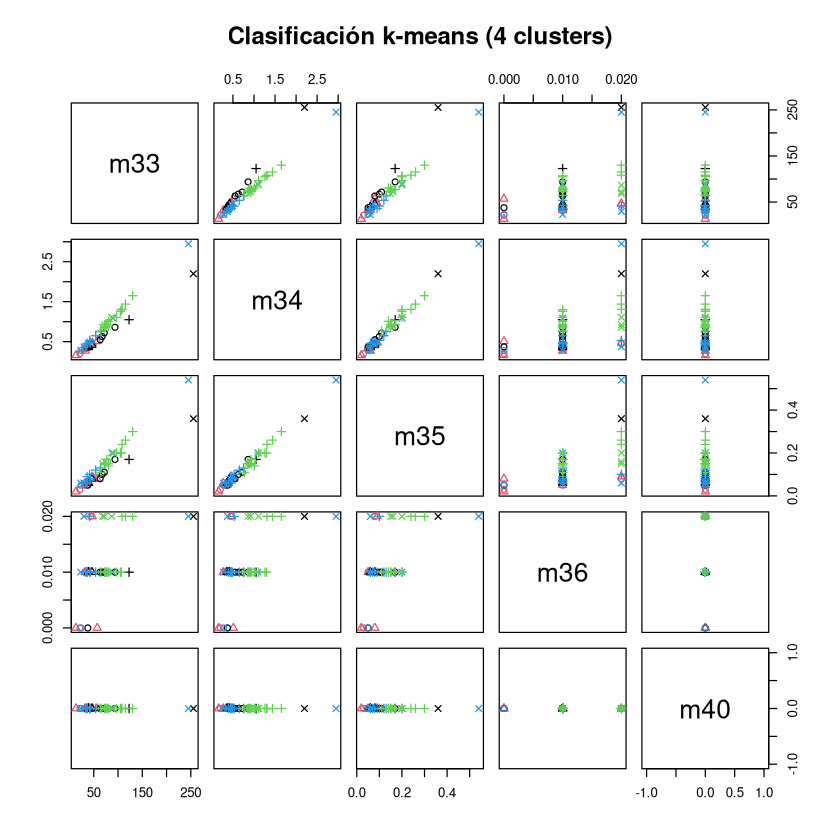

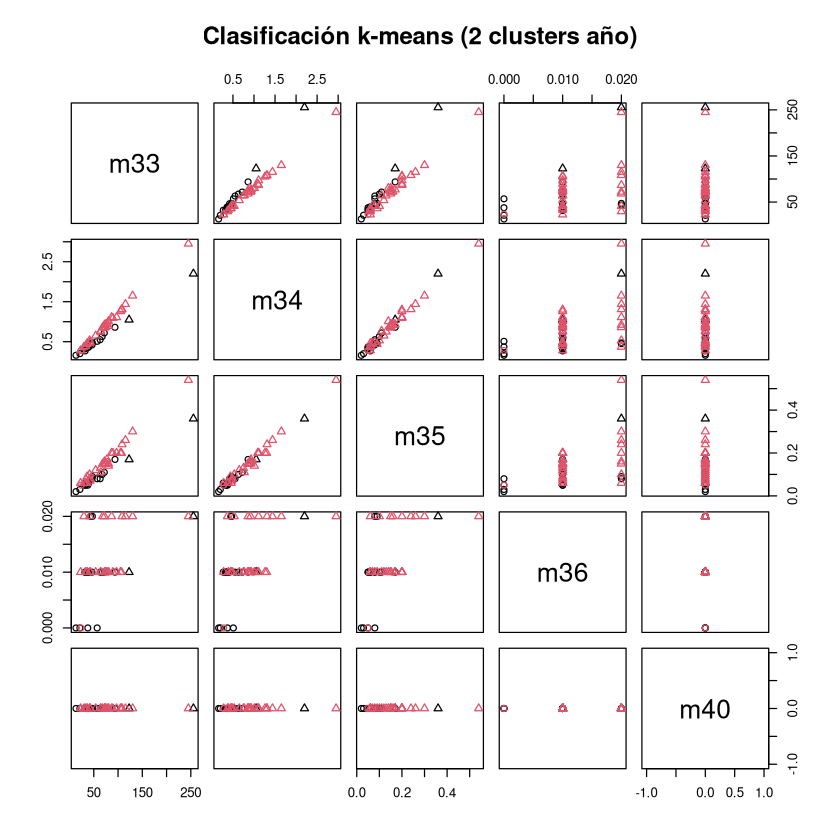

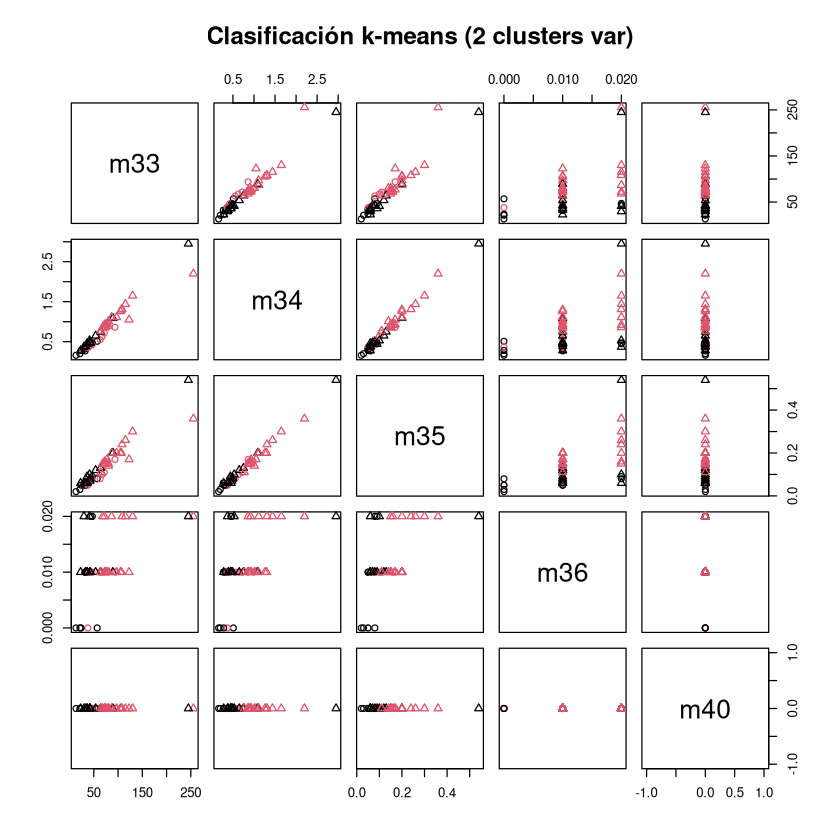

In [32]:
calcular_kmeans(lampone.x)

#### PCA

Año + variedad
Direct agreement: 1 of 4 pairs
Iterations for permutation matching: 6 
Cases in matched pairs: 48.98 %
           agrupacion2
agrupacion1  2  3  1  4
    2006.10  3  5  1  1
    2006.2   1  8  0  0
    2007.10  4  0 10  3
    2007.2   2  0  8  3

-----------------------------------------

Año
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 91.84 %
           agrupacion2
agrupacion1  1  2
       2006 17  2
       2007  2 28

-----------------------------------------

Variedad
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 57.14 %
           agrupacion2
agrupacion1  1  2
         2  10 12
         10  9 18

-----------------------------------------


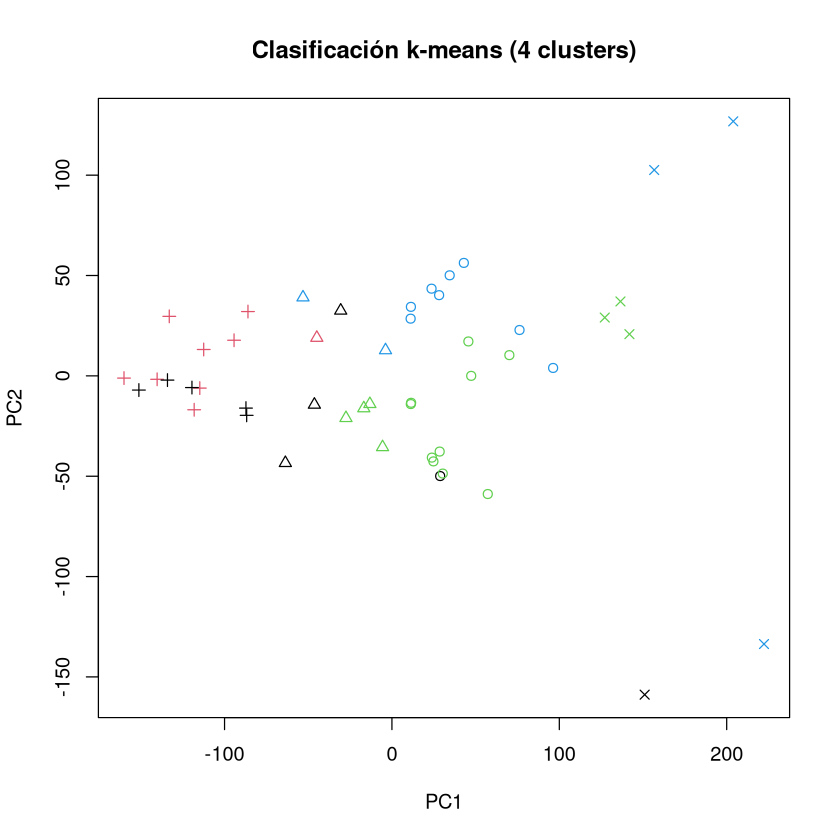

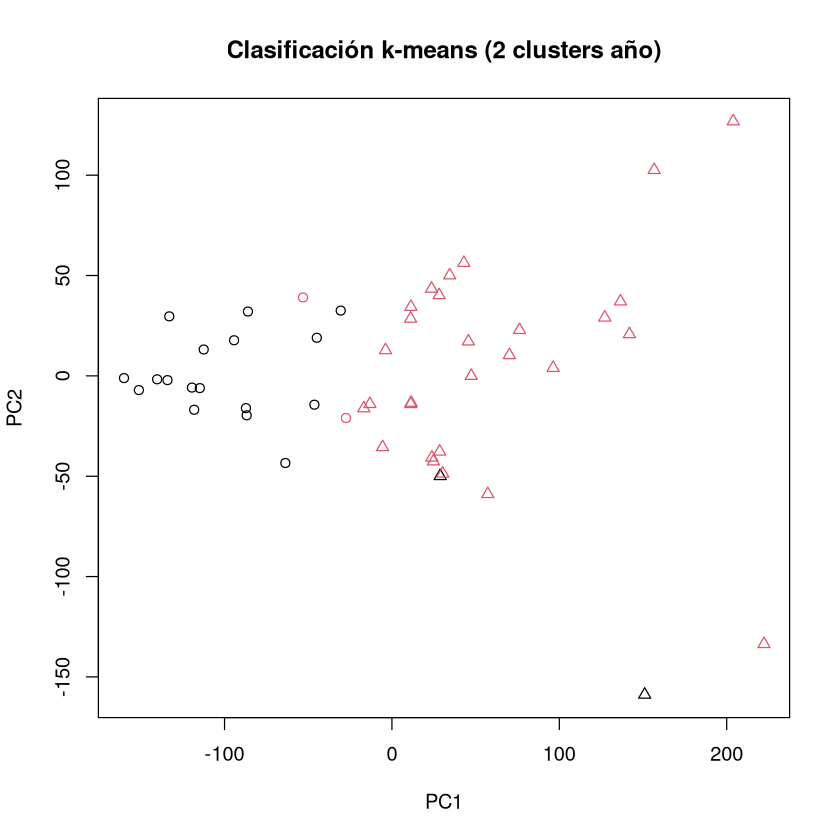

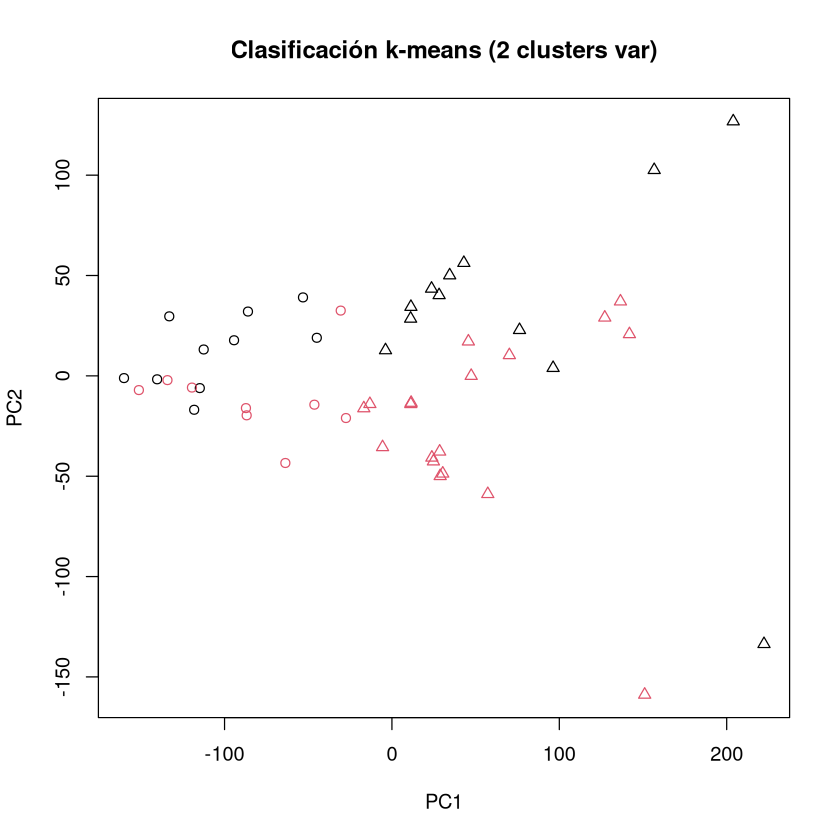

In [33]:
calcular_kmeans(lampone.x.pca$x)

#### PCA + Escalado

Año + variedad
Direct agreement: 0 of 4 pairs
Iterations for permutation matching: 24 
Cases in matched pairs: 34.69 %
           agrupacion2
agrupacion1 2 3 4 1
    2006.10 2 3 3 2
    2006.2  1 4 3 1
    2007.10 2 7 7 1
    2007.2  2 2 5 4

-----------------------------------------

Año
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 57.14 %
           agrupacion2
agrupacion1  1  2
       2006  5 14
       2007  7 23

-----------------------------------------

Variedad
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 63.27 %
           agrupacion2
agrupacion1  1  2
         2   8 14
         10  4 23

-----------------------------------------


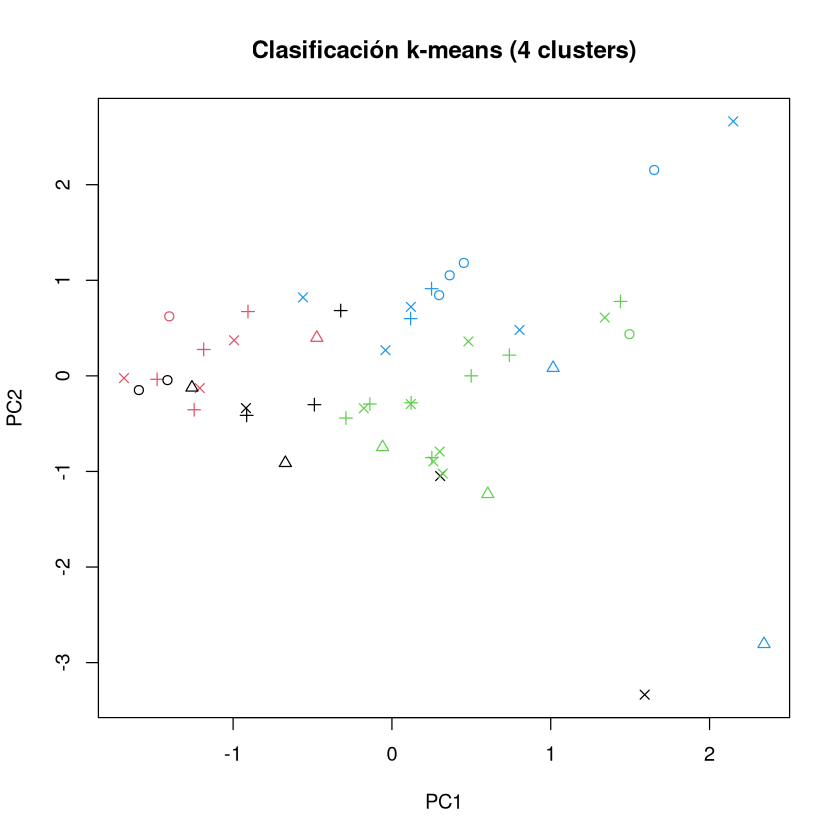

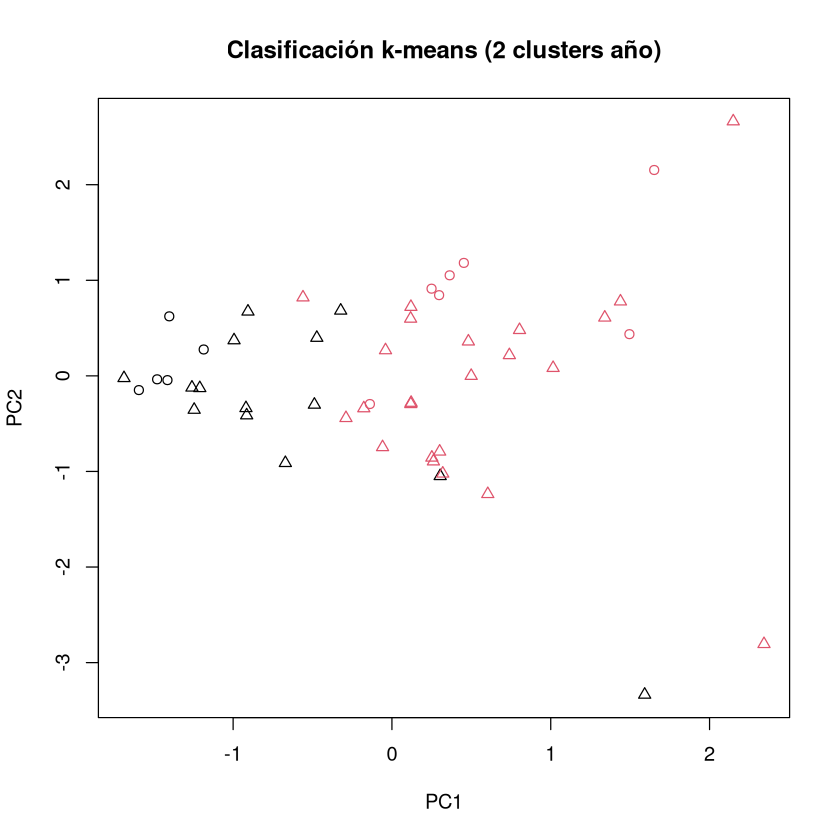

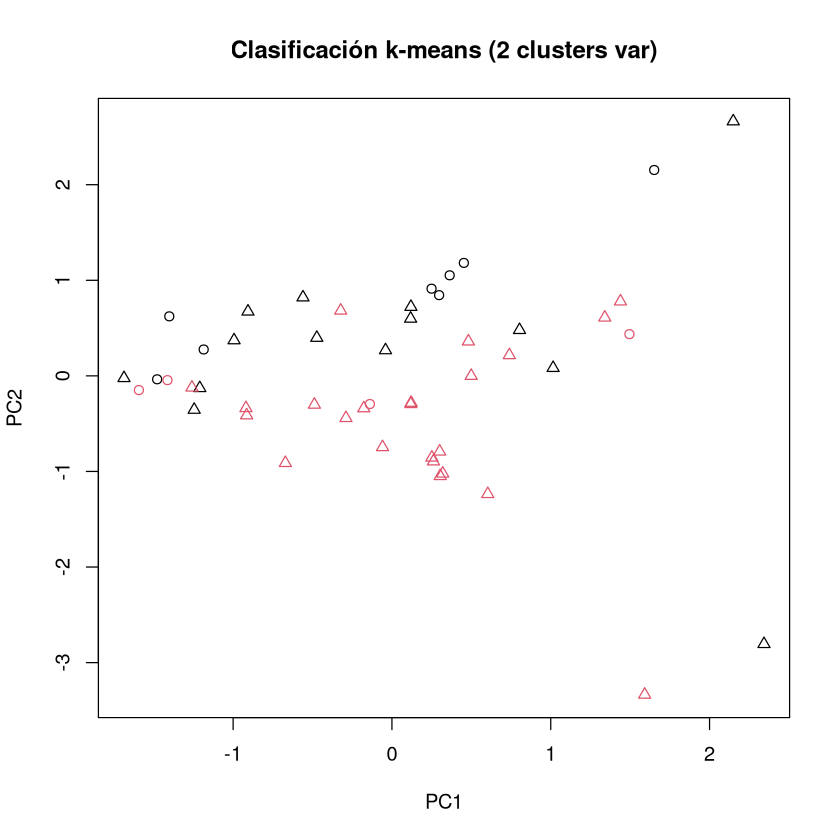

In [34]:
calcular_kmeans(lampone.x.pca.scale)

### hclust

#### Nada

Año + variedad
Direct agreement: 1 of 4 pairs
Iterations for permutation matching: 6 
Cases in matched pairs: 51.02 %
           agrupacion2
agrupacion1  3  1  2  4
    2006.10  1  7  2  0
    2006.2   0  8  1  0
    2007.10  0  0 14  3
    2007.2   1  0 10  2

-----------------------------------------

Año
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.02 %
           agrupacion2
agrupacion1  2  1
       2006  1 18
       2007  6 24

-----------------------------------------

Variedad
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 53.06 %
           agrupacion2
agrupacion1  2  1
         2   3 19
         10  4 23

-----------------------------------------


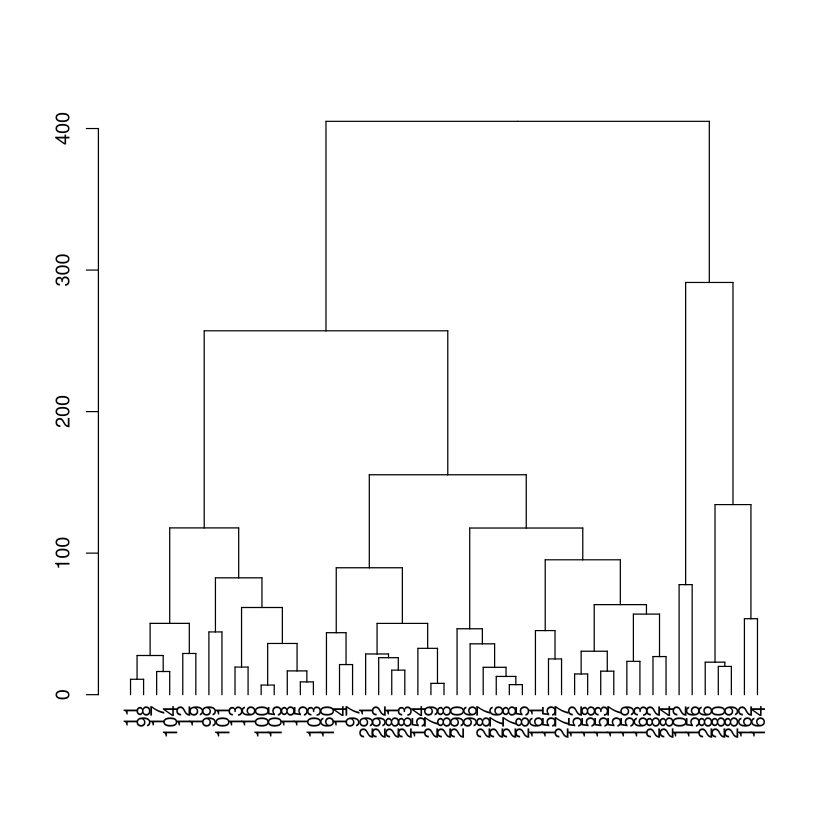

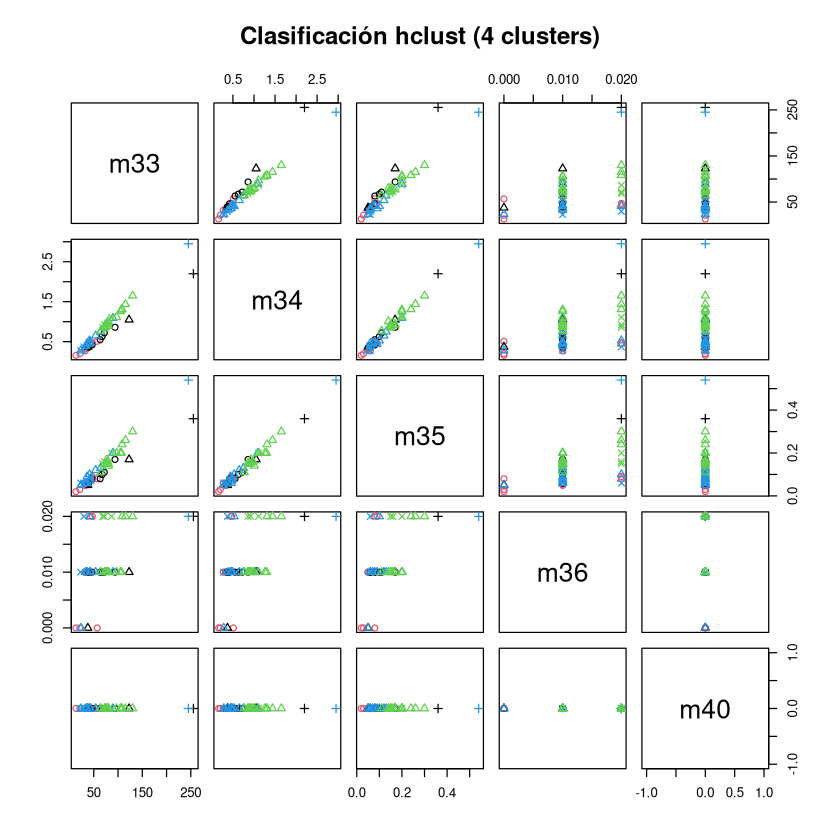

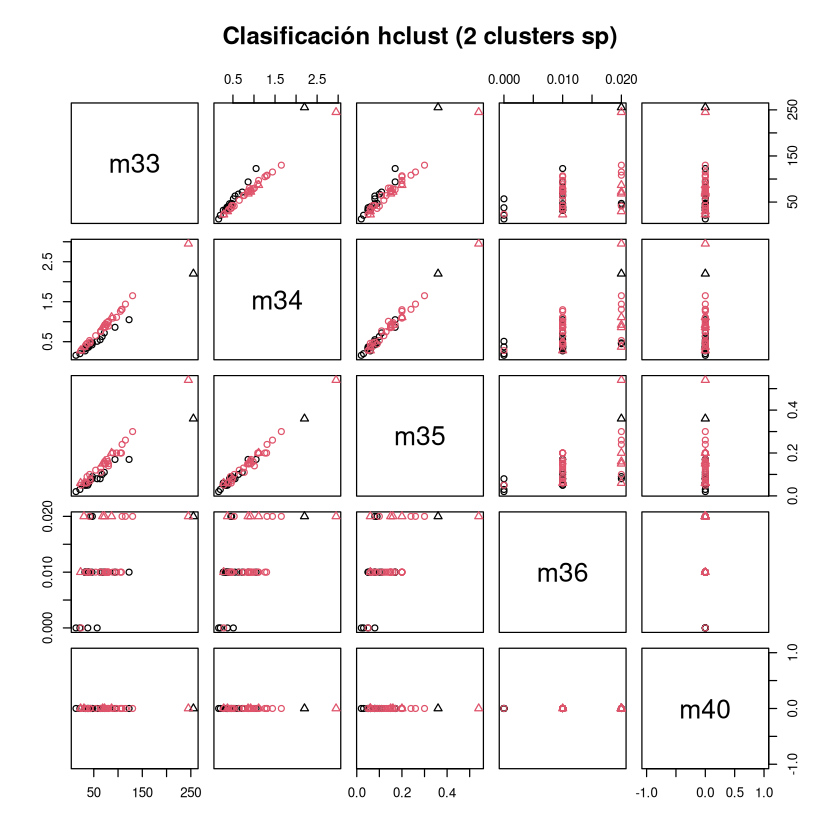

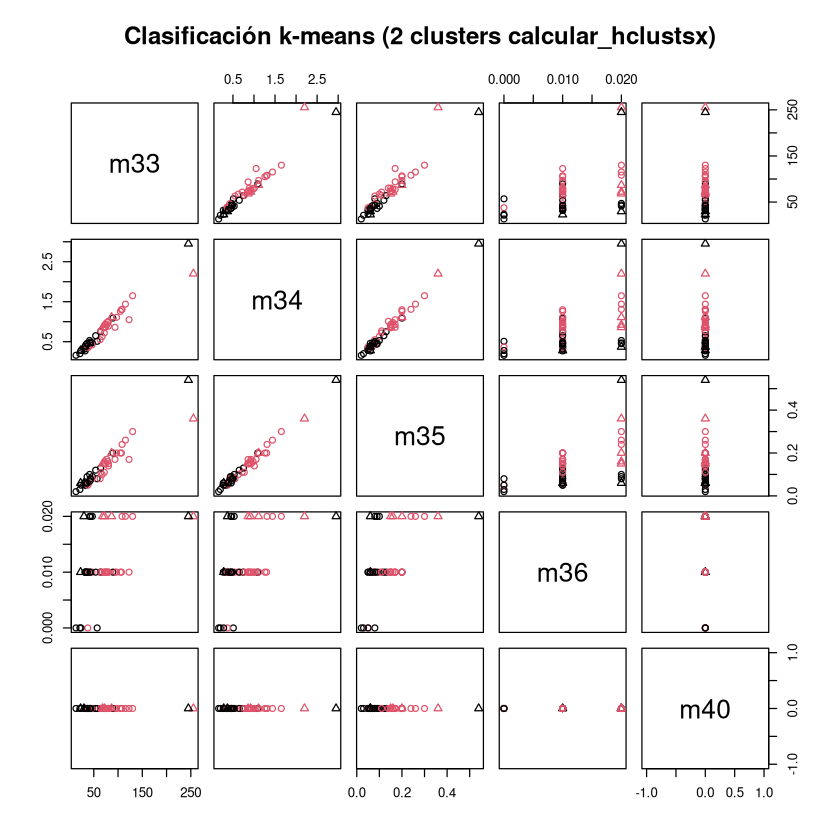

In [35]:
calcular_hclust(lampone.x, "complete")

Año + variedad
Direct agreement: 2 of 4 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 53.06 %
           agrupacion2
agrupacion1  3  1  2  4
    2006.10  1  8  1  0
    2006.2   0  9  0  0
    2007.10  0  0 14  3
    2007.2   1  1  9  2

-----------------------------------------

Año
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 61.22 %
           agrupacion2
agrupacion1  2  1
       2006  1 18
       2007  1 29

-----------------------------------------

Variedad
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 55.1 %
           agrupacion2
agrupacion1  2  1
         2   1 21
         10  1 26

-----------------------------------------


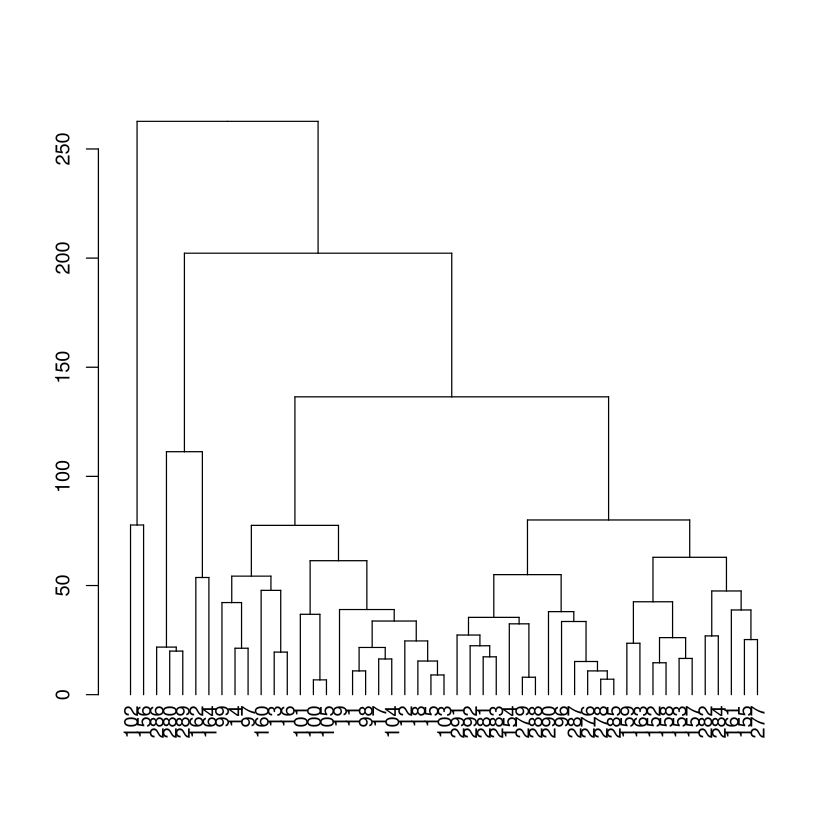

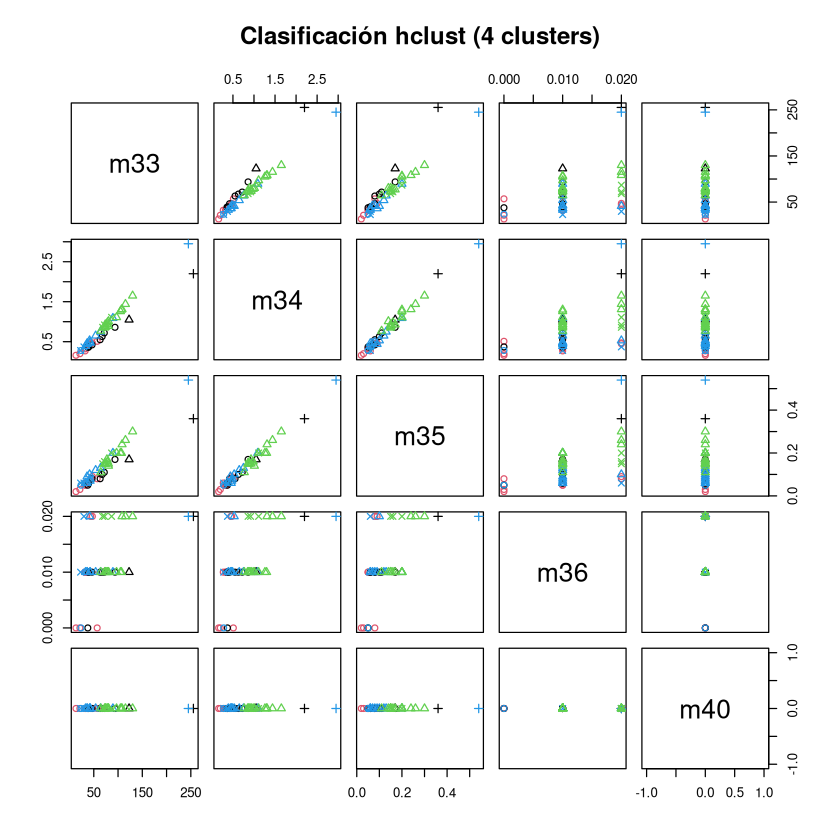

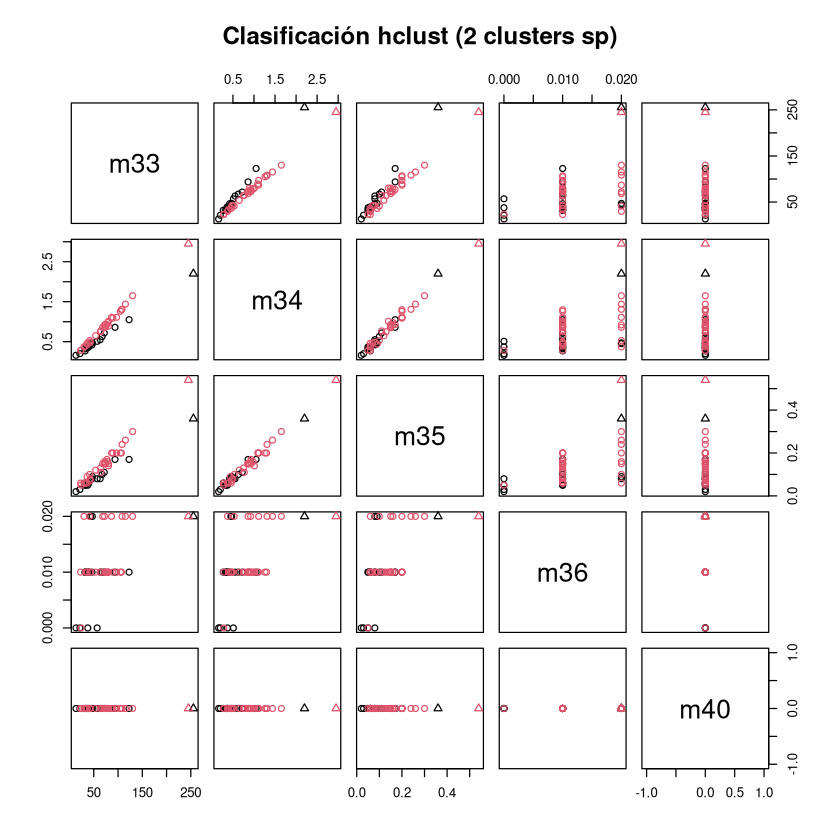

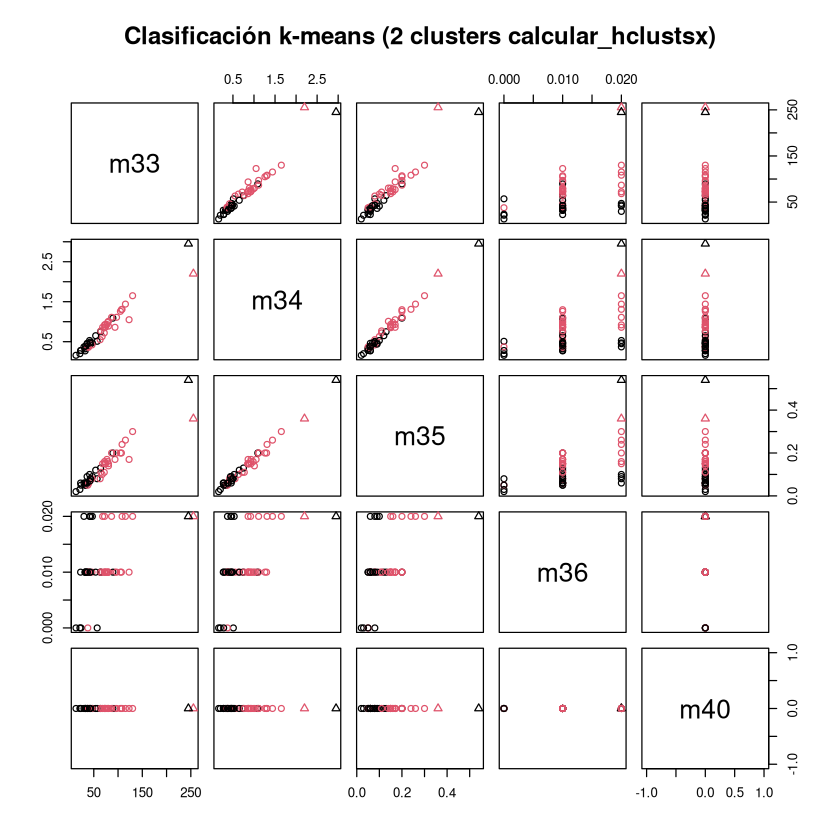

In [36]:
calcular_hclust(lampone.x, "average")


Año + variedad
Direct agreement: 1 of 4 pairs
Iterations for permutation matching: 6 
Cases in matched pairs: 40.82 %
           agrupacion2
agrupacion1  2  3  1  4
    2006.10  1  0  9  0
    2006.2   0  0  9  0
    2007.10  0  0 17  0
    2007.2   0  1 10  2

-----------------------------------------

Año
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 61.22 %
           agrupacion2
agrupacion1  2  1
       2006  1 18
       2007  1 29

-----------------------------------------

Variedad
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 55.1 %
           agrupacion2
agrupacion1  2  1
         2   1 21
         10  1 26

-----------------------------------------


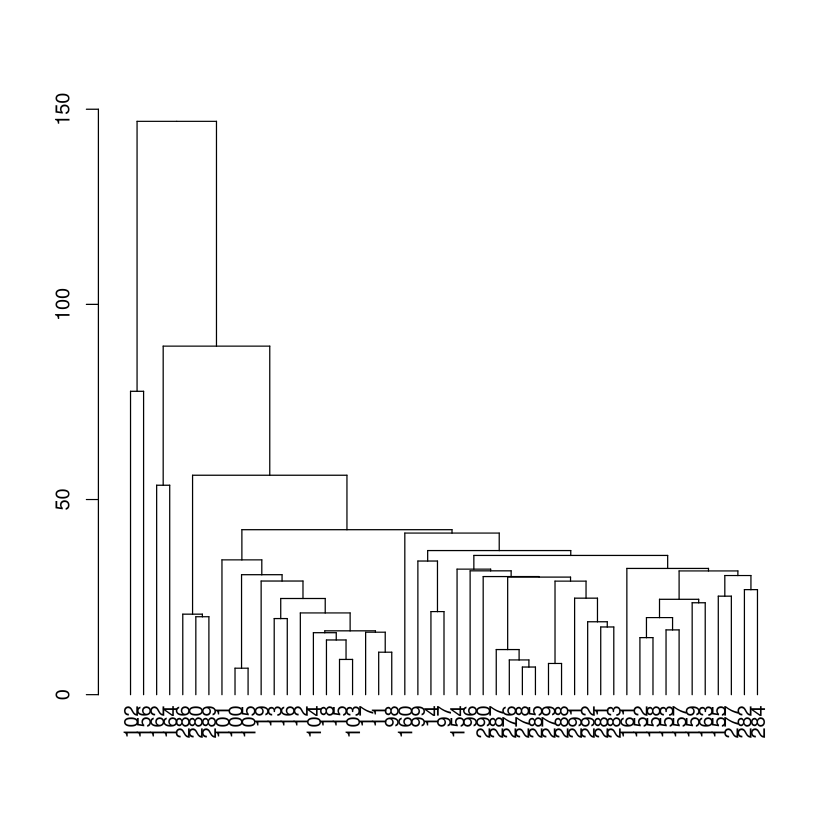

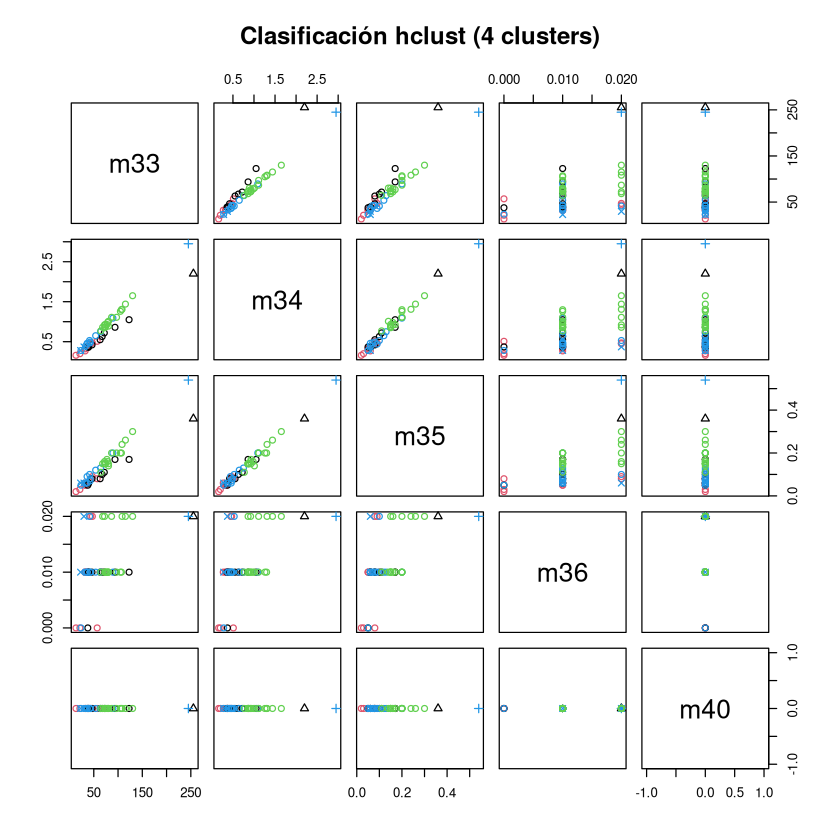

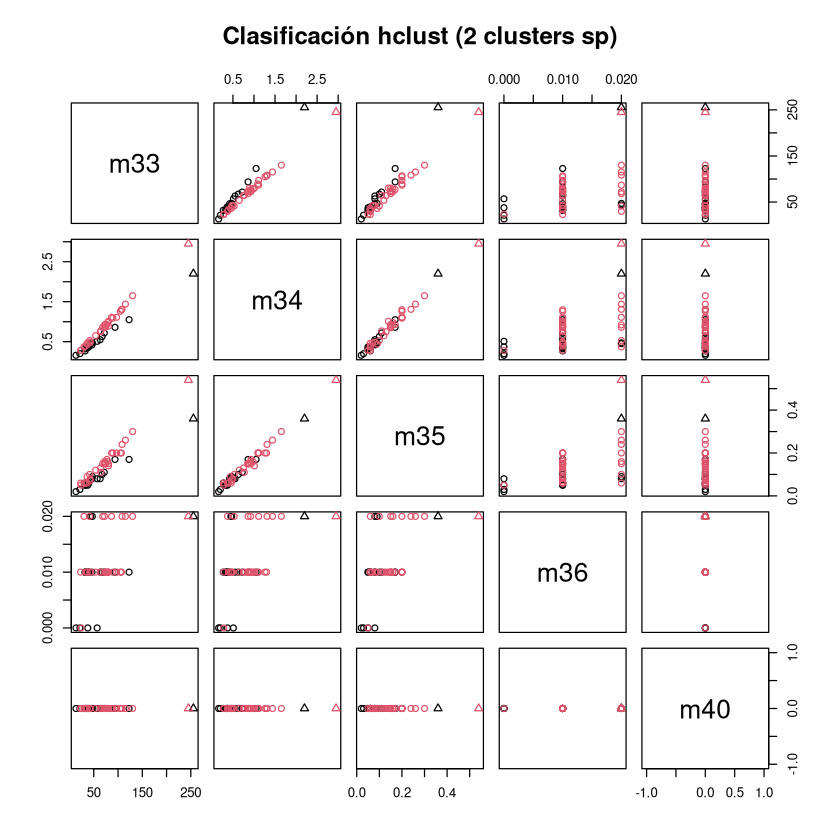

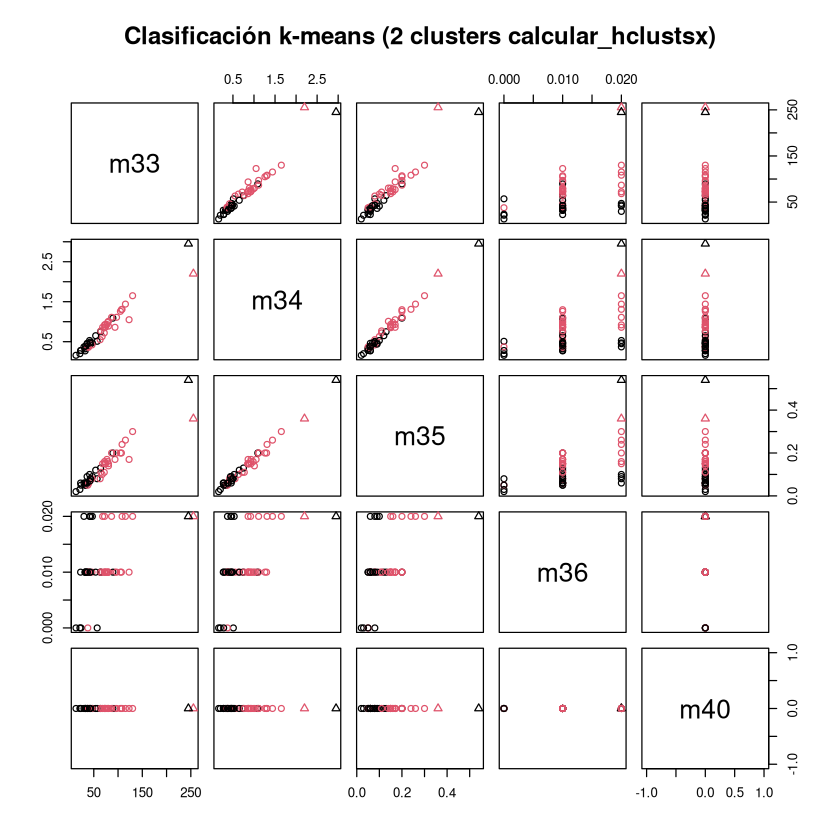

In [37]:
calcular_hclust(lampone.x, "single")


#### PCA

Año + variedad
Direct agreement: 1 of 4 pairs
Iterations for permutation matching: 6 
Cases in matched pairs: 51.02 %
           agrupacion2
agrupacion1  3  1  2  4
    2006.10  1  7  2  0
    2006.2   0  8  1  0
    2007.10  0  0 14  3
    2007.2   1  0 10  2

-----------------------------------------

Año
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.02 %
           agrupacion2
agrupacion1  2  1
       2006  1 18
       2007  6 24

-----------------------------------------

Variedad
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 53.06 %
           agrupacion2
agrupacion1  2  1
         2   3 19
         10  4 23

-----------------------------------------


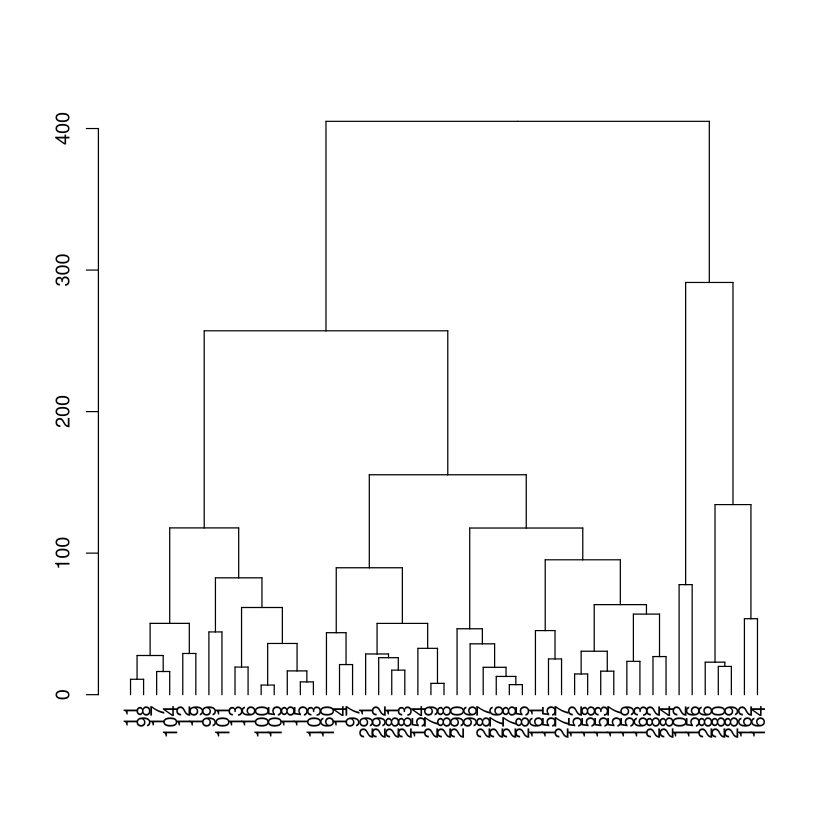

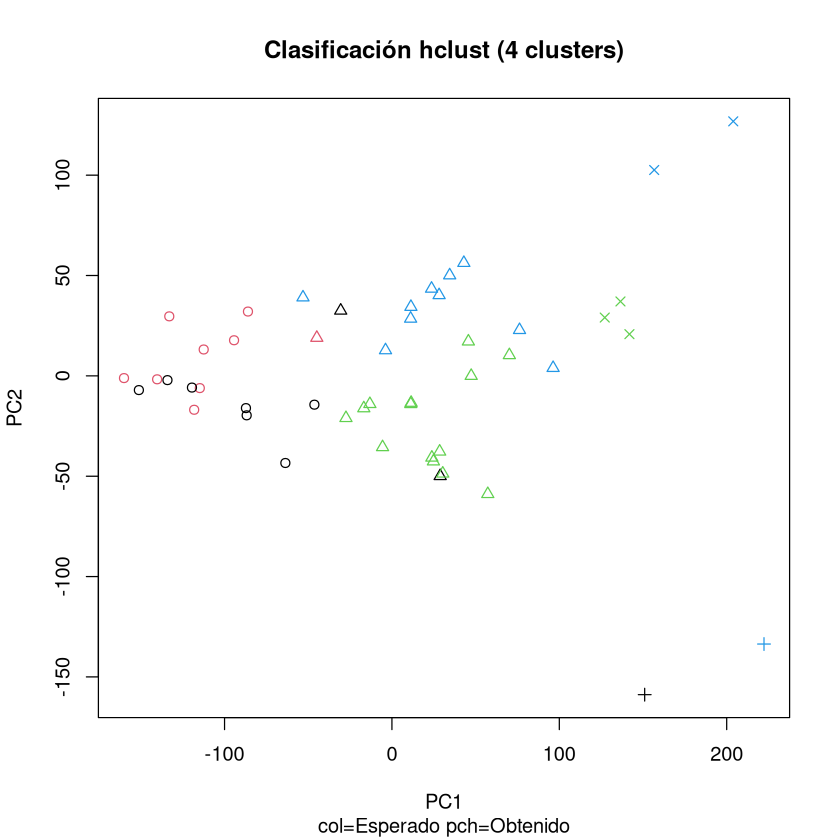

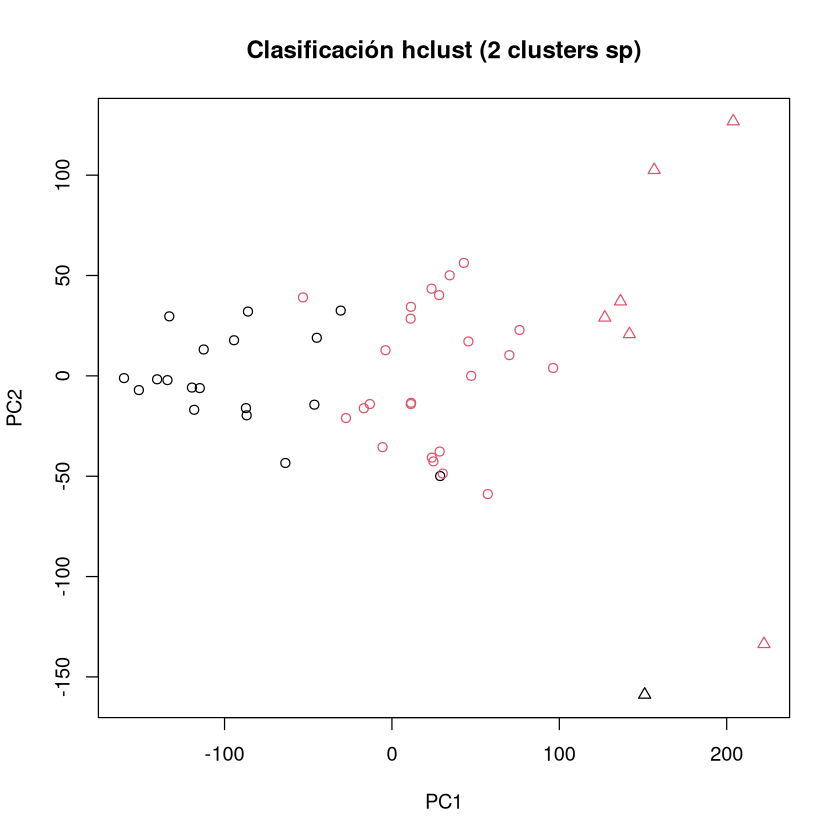

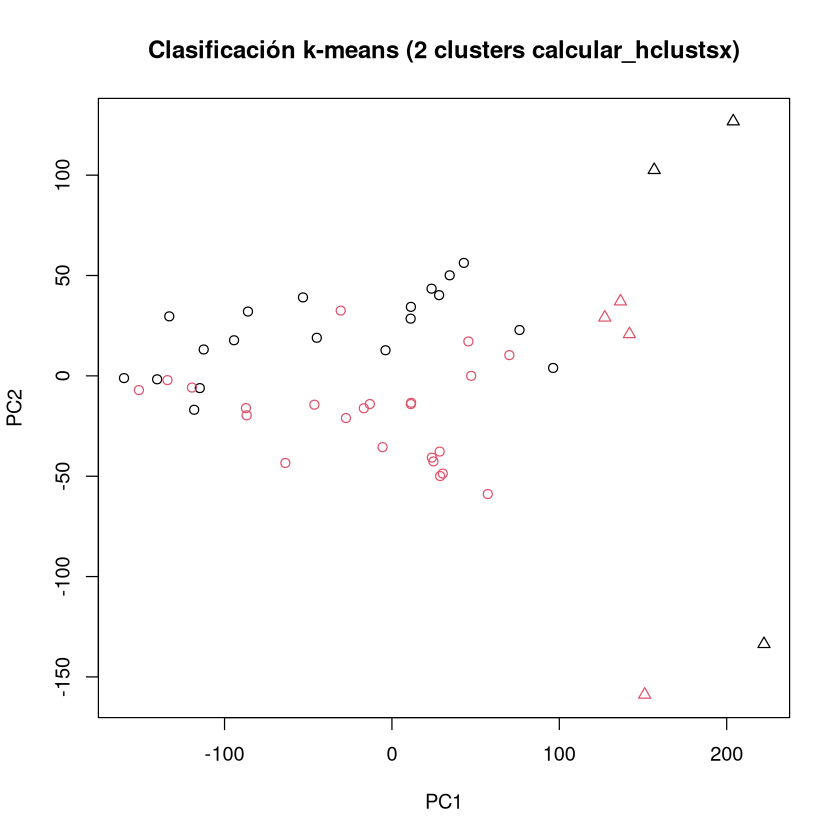

In [38]:
calcular_hclust(lampone.x.pca$x, "complete")

Año + variedad
Direct agreement: 2 of 4 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 53.06 %
           agrupacion2
agrupacion1  3  1  2  4
    2006.10  1  8  1  0
    2006.2   0  9  0  0
    2007.10  0  0 14  3
    2007.2   1  1  9  2

-----------------------------------------

Año
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 61.22 %
           agrupacion2
agrupacion1  2  1
       2006  1 18
       2007  1 29

-----------------------------------------

Variedad
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 55.1 %
           agrupacion2
agrupacion1  2  1
         2   1 21
         10  1 26

-----------------------------------------


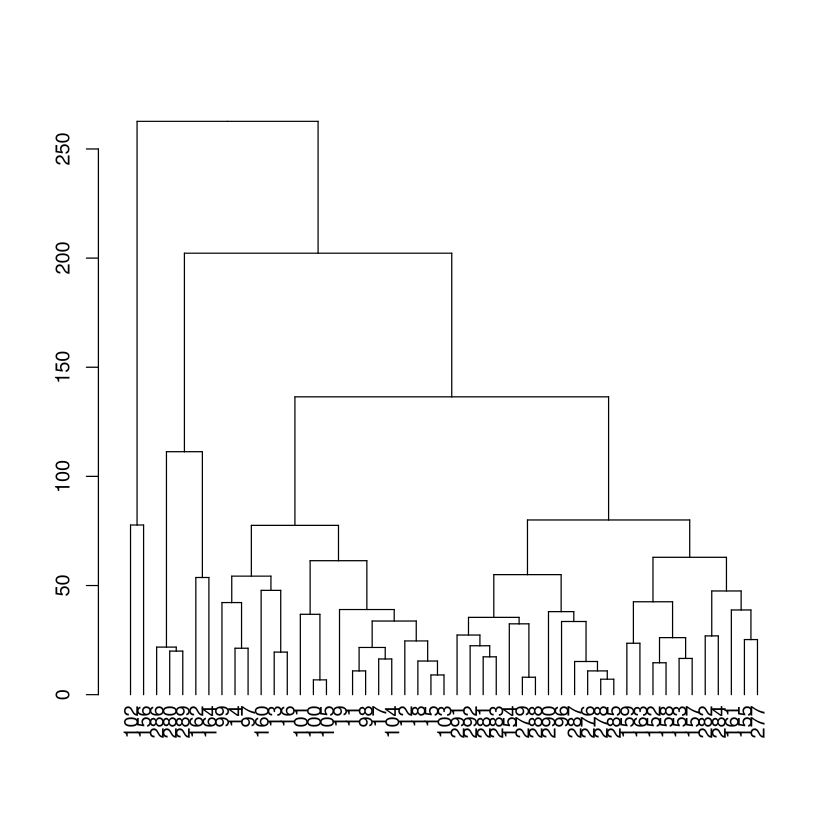

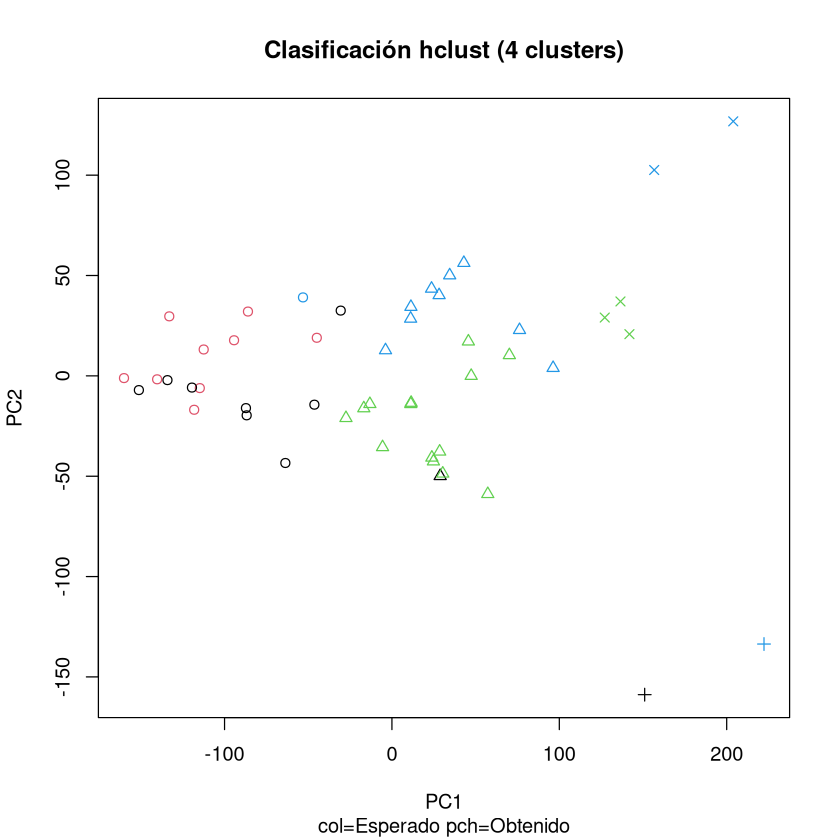

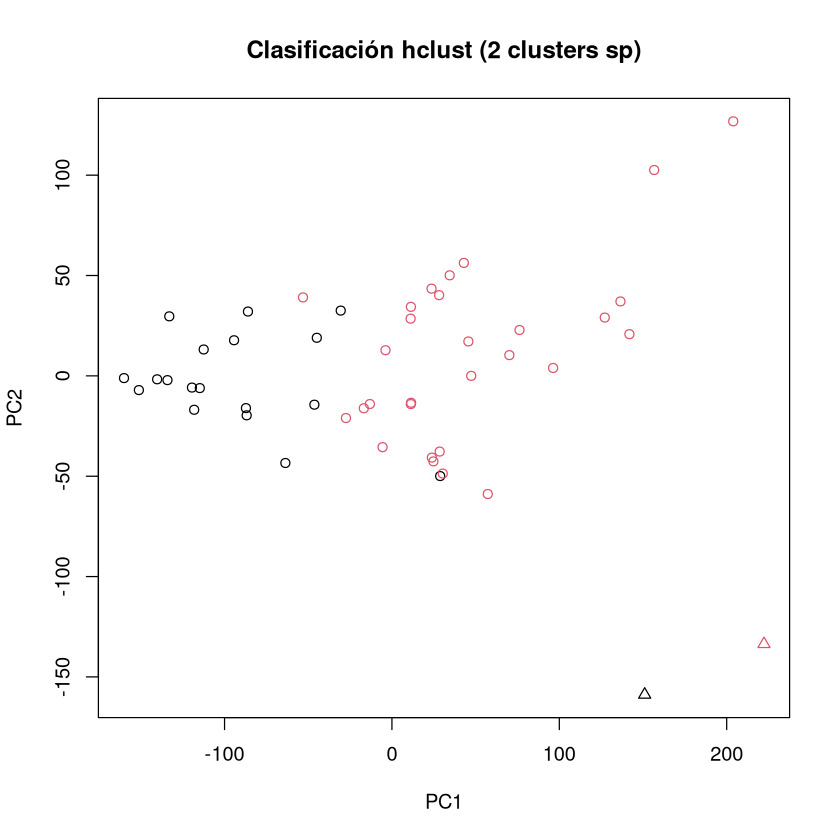

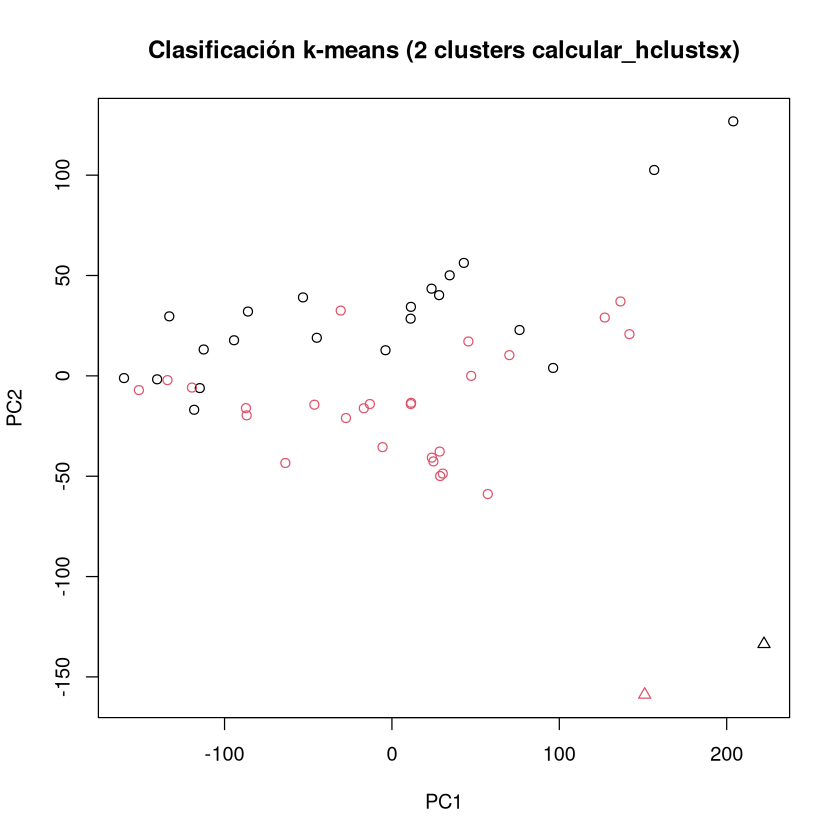

In [39]:
calcular_hclust(lampone.x.pca$x, "average")

Año + variedad
Direct agreement: 1 of 4 pairs
Iterations for permutation matching: 6 
Cases in matched pairs: 40.82 %
           agrupacion2
agrupacion1  2  3  1  4
    2006.10  1  0  9  0
    2006.2   0  0  9  0
    2007.10  0  0 17  0
    2007.2   0  1 10  2

-----------------------------------------

Año
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 61.22 %
           agrupacion2
agrupacion1  2  1
       2006  1 18
       2007  1 29

-----------------------------------------

Variedad
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 55.1 %
           agrupacion2
agrupacion1  2  1
         2   1 21
         10  1 26

-----------------------------------------


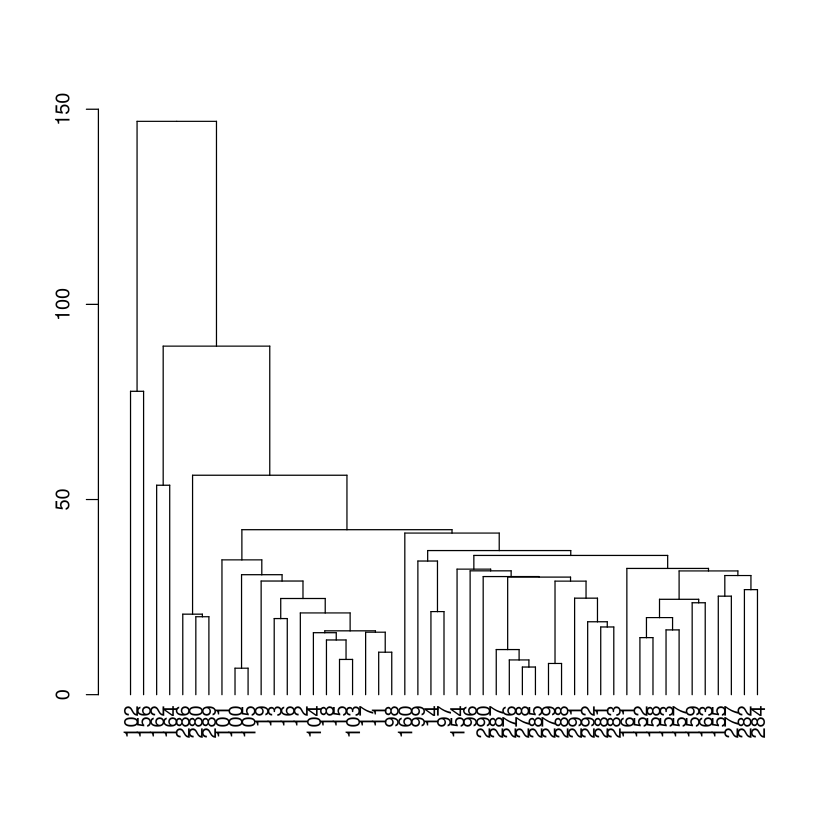

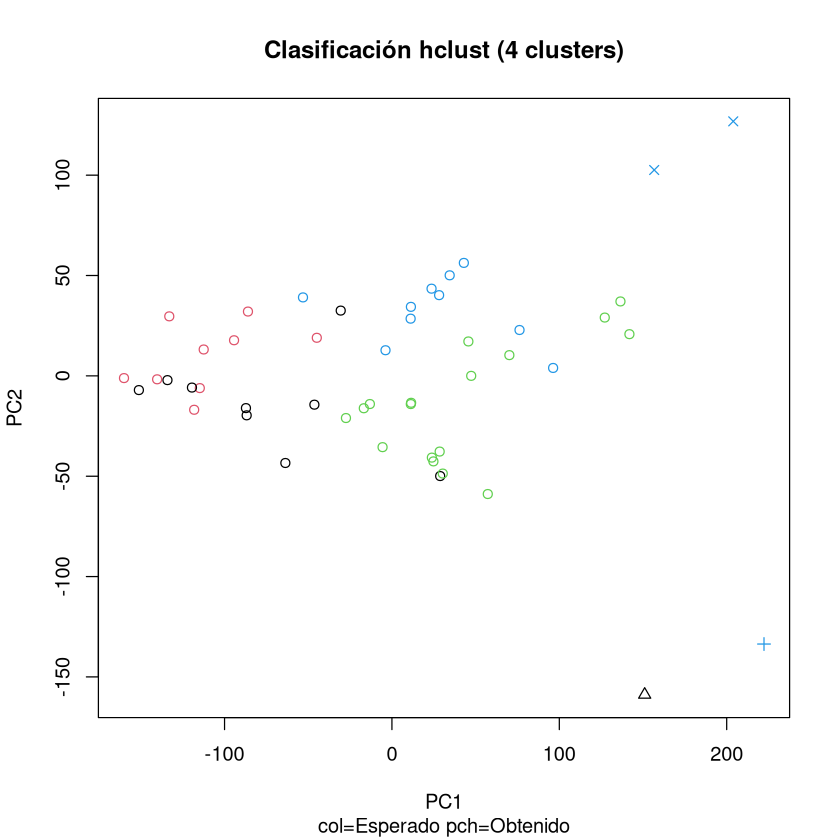

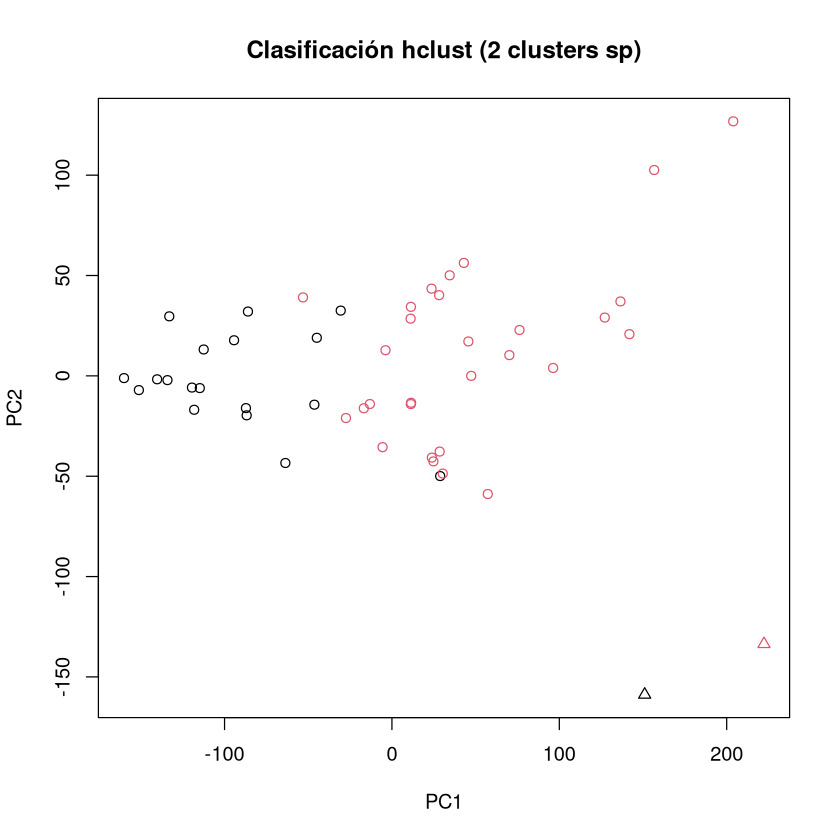

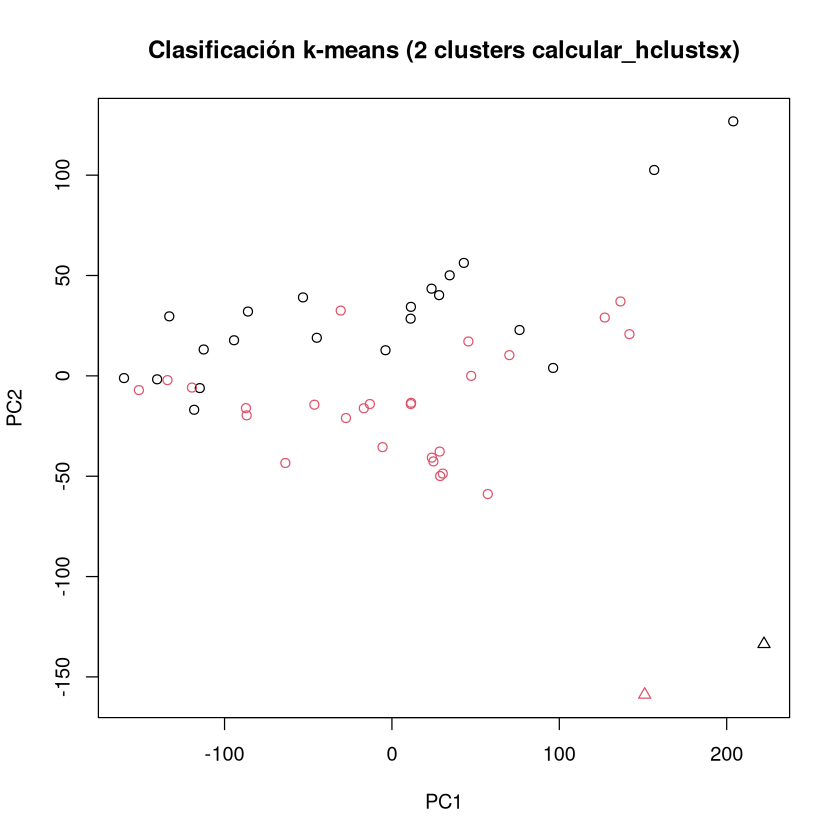

In [40]:
calcular_hclust(lampone.x.pca$x, "single")

#### PCA + Escalado

Año + variedad
Direct agreement: 0 of 4 pairs
Iterations for permutation matching: 24 
Cases in matched pairs: 36.73 %
           agrupacion2
agrupacion1 4 2 1 3
    2006.10 1 3 4 2
    2006.2  0 4 4 1
    2007.10 0 7 9 1
    2007.2  1 2 6 4

-----------------------------------------

Año
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 53.06 %
           agrupacion2
agrupacion1  2  1
       2006 10  9
       2007 14 16

-----------------------------------------

Variedad
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.02 %
           agrupacion2
agrupacion1  2  1
         2  11 11
         10 13 14

-----------------------------------------


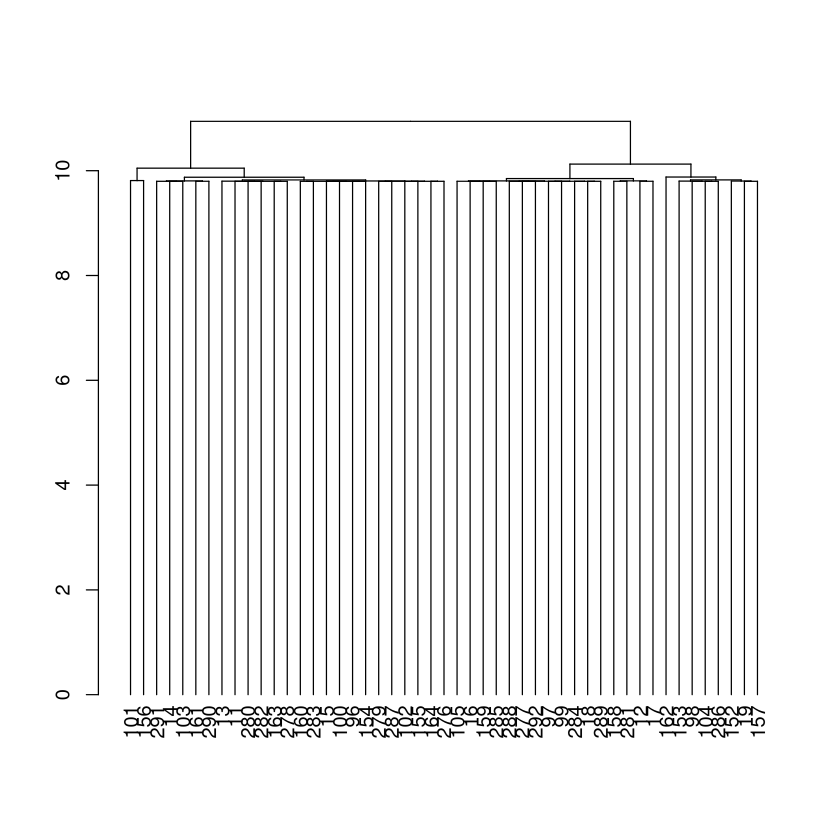

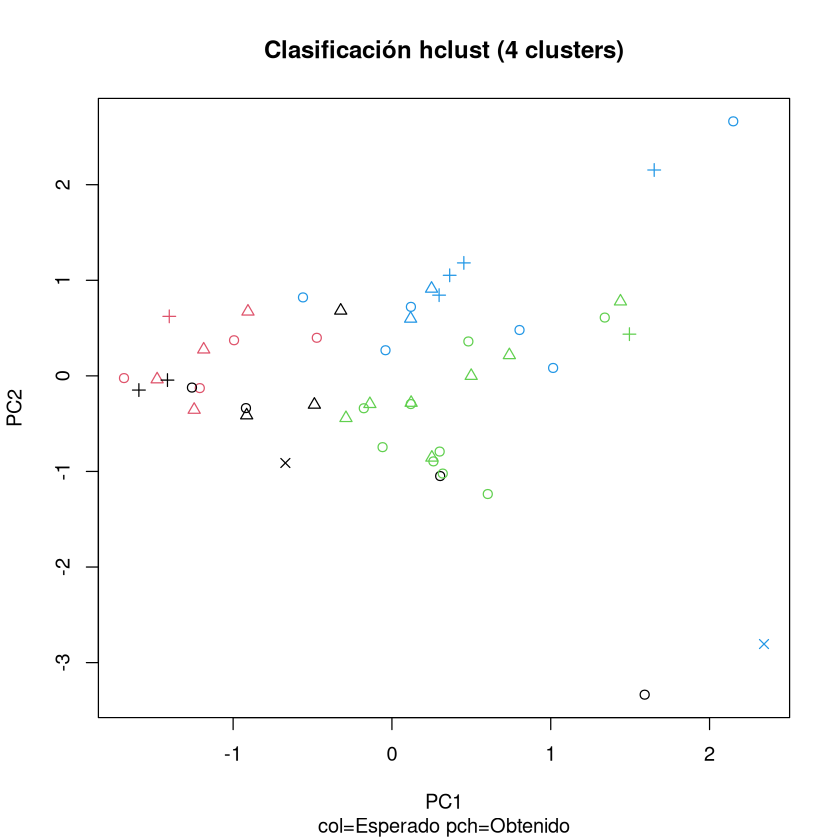

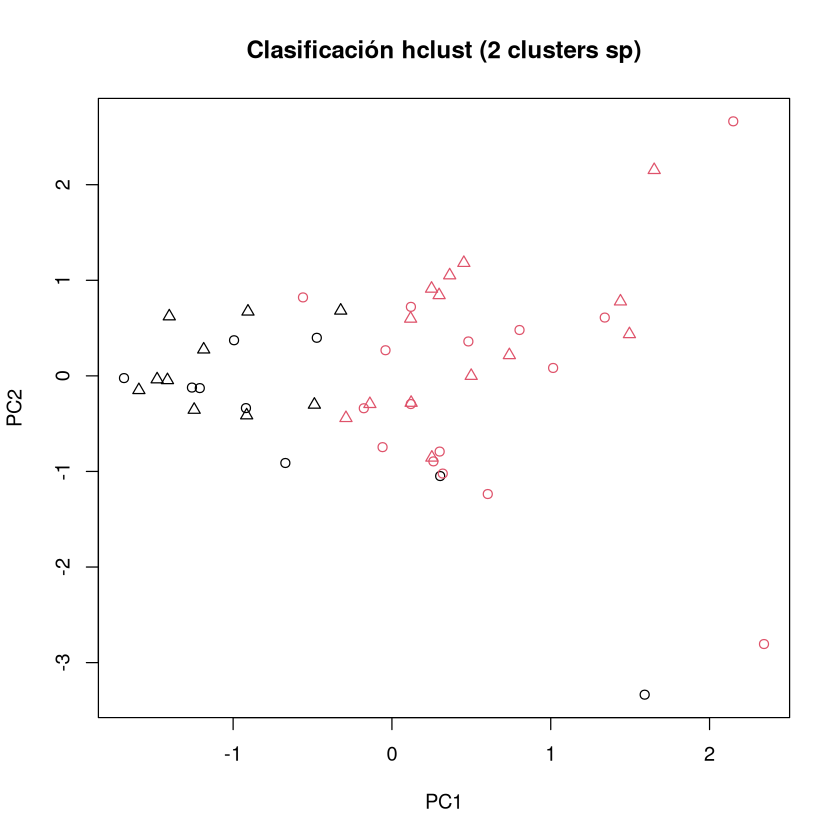

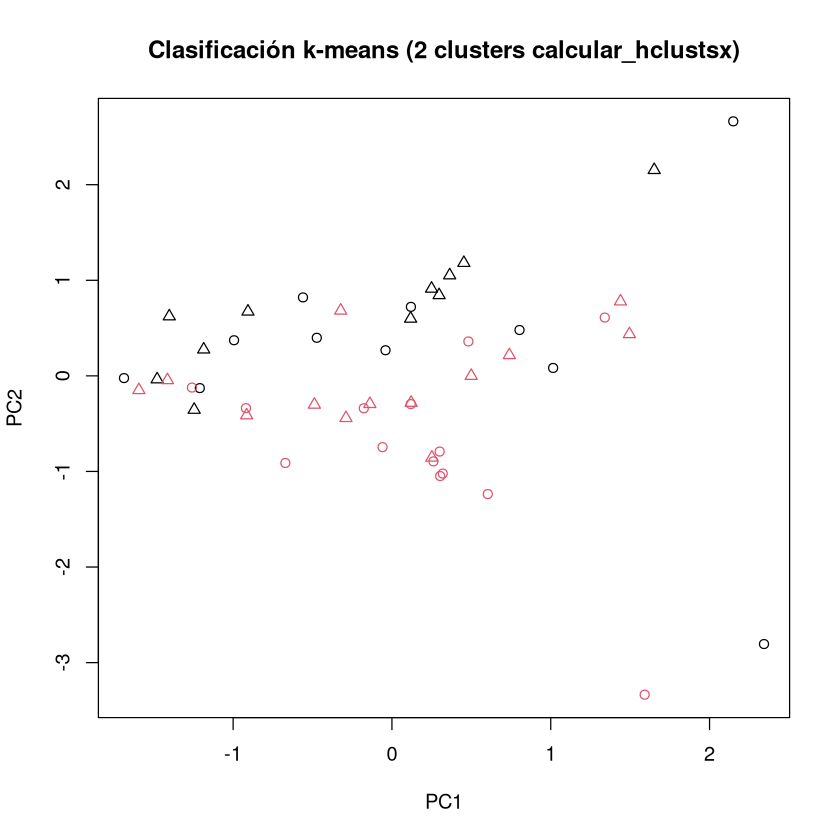

In [41]:
calcular_hclust(lampone.x.pca.scale, "complete")

Año + variedad
Direct agreement: 1 of 4 pairs
Iterations for permutation matching: 6 
Cases in matched pairs: 44.9 %
           agrupacion2
agrupacion1  4  2  1  3
    2006.10  1  0  7  2
    2006.2   0  2  6  1
    2007.10  0  1 15  1
    2007.2   1  1  7  4

-----------------------------------------

Año
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 57.14 %
           agrupacion2
agrupacion1  2  1
       2006  5 14
       2007  7 23

-----------------------------------------

Variedad
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 63.27 %
           agrupacion2
agrupacion1  2  1
         2   8 14
         10  4 23

-----------------------------------------


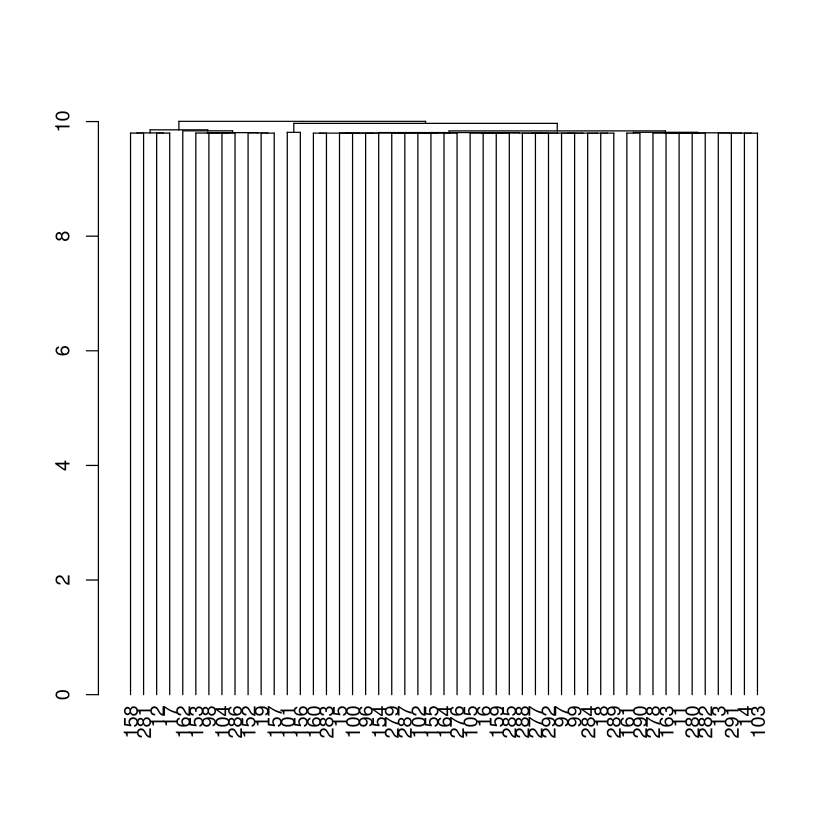

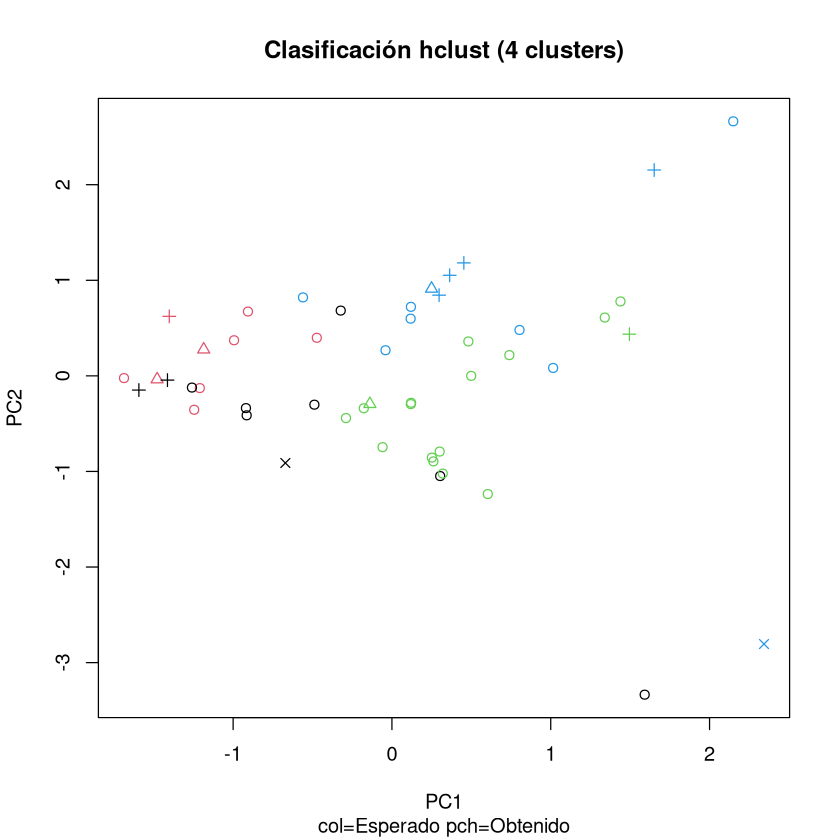

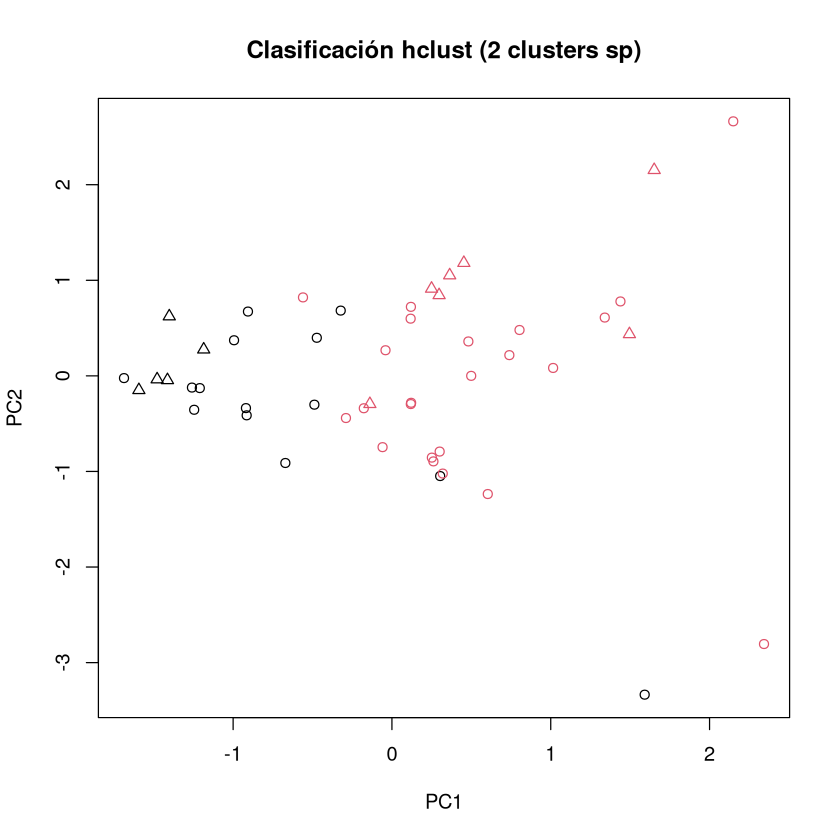

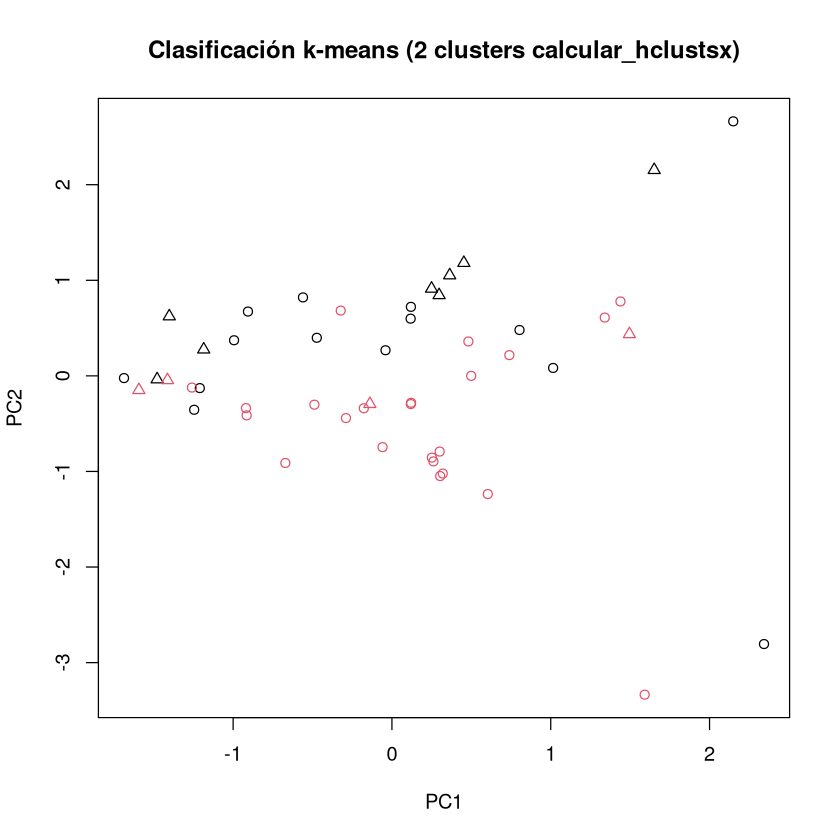

In [42]:
calcular_hclust(lampone.x.pca.scale, "average")

Año + variedad
Direct agreement: 1 of 4 pairs
Iterations for permutation matching: 6 
Cases in matched pairs: 38.78 %
           agrupacion2
agrupacion1  2  3  1  4
    2006.10  1  0  9  0
    2006.2   0  0  9  0
    2007.10  0  0 17  0
    2007.2   0  1 11  1

-----------------------------------------

Año
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 59.18 %
           agrupacion2
agrupacion1  2  1
       2006  0 19
       2007  1 29

-----------------------------------------

Variedad
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 57.14 %
           agrupacion2
agrupacion1  2  1
         2   1 21
         10  0 27

-----------------------------------------


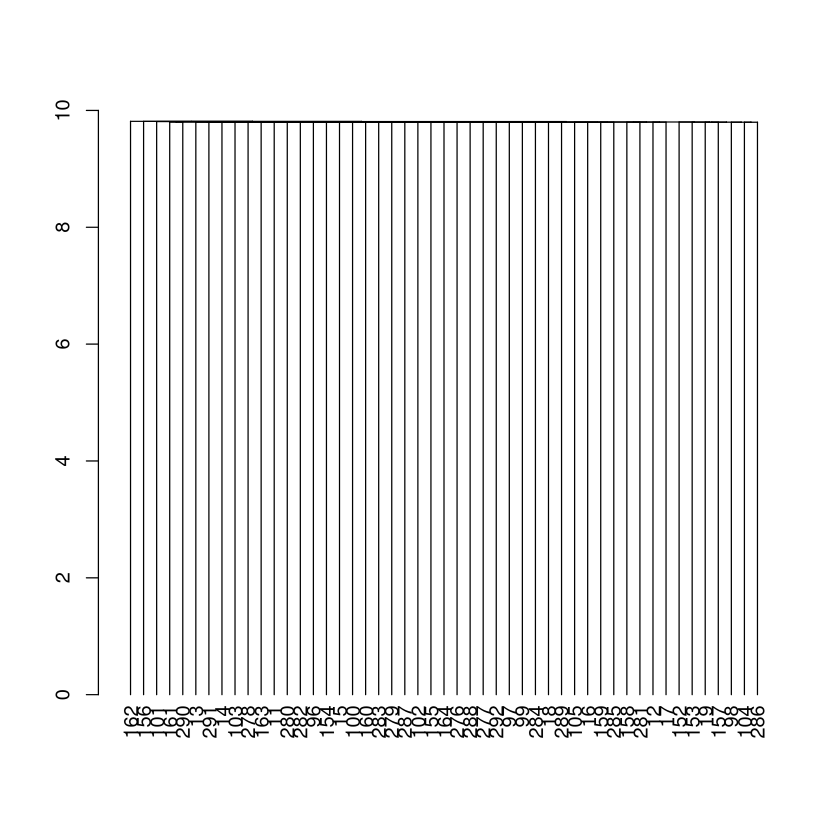

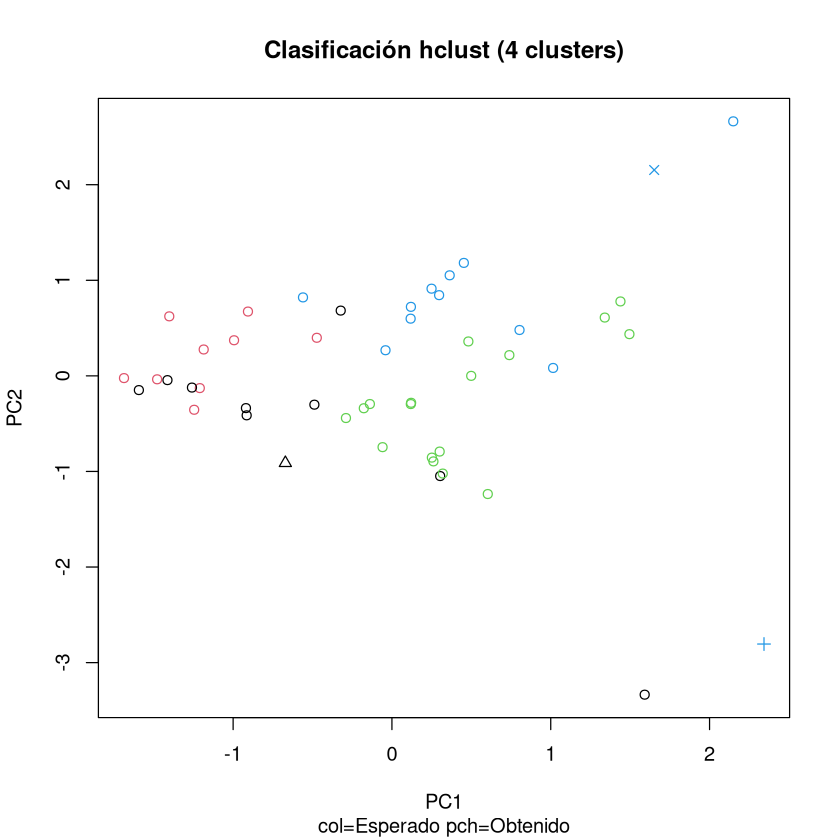

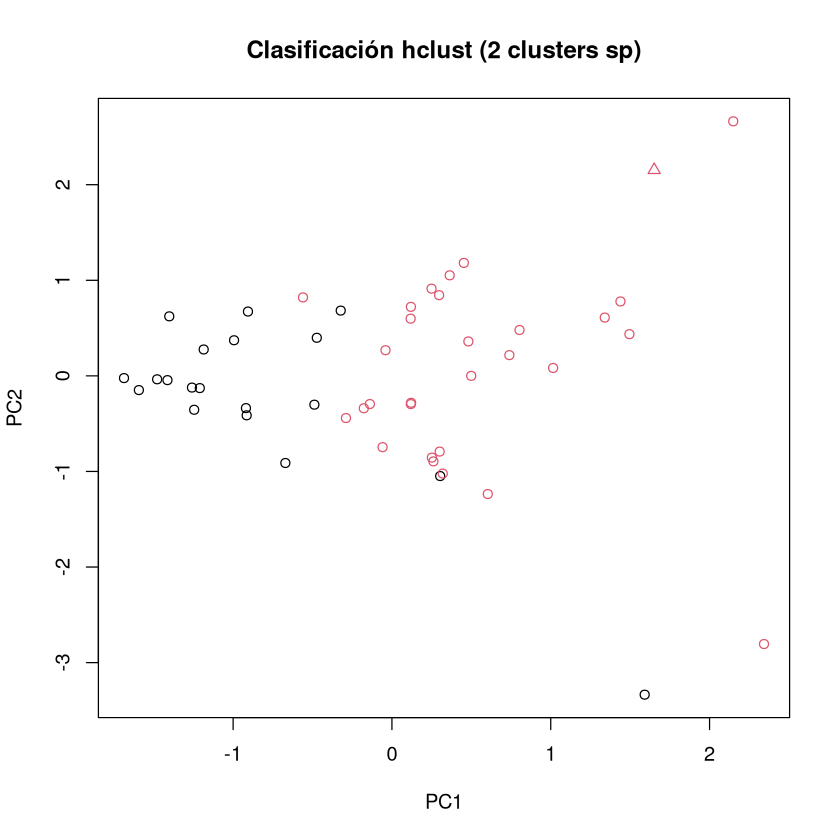

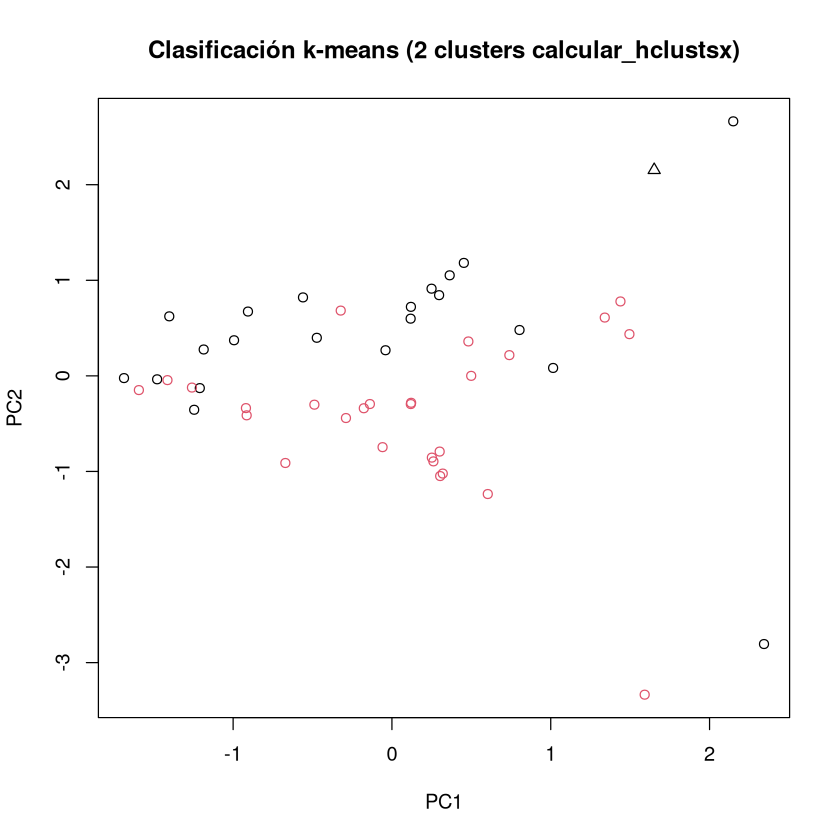

In [43]:
calcular_hclust(lampone.x.pca.scale, "single")

### Conclusiones

Al igual que hice para los *cangrejos* voy a comparar cuan parecidos son los clusters generados respecto a como son realmente las clases, daré el porcentaje de similitud entre el generado y el original

#### *Año* y *Variedad*
| Trasformación   | k-means | hclust(compleat) | hclust(average) | hclust(single) |
|:----------------|:--------|:-----------------|:----------------|:---------------|
| Nada            | 57      | 51               | 53              | 40             |
|    PCA          | 48      | 51               | 53              | 40             |
|  PCA+Escalado   | 34      | 36               | 44              | 38             |

#### *Año*

| Trasformación   | k-means | hclust(compleat) | hclust(average) | hclust(single) |
|:----------------|:--------|:-----------------|:----------------|:---------------|
| Nada            | 91      | 51               | 61              | 61             |
|    PCA          | 91      | 51               | 61              | 61             |
|  PCA+Escalado   | 57      | 53               | 57              | 59             |

#### *Sexo*

| Trasformación   | k-means | hclust(compleat) | hclust(average) | hclust(single) |
|:----------------|:--------|:-----------------|:----------------|:---------------|
| Nada            | 57      | 53               | 55              | 55             |
|    PCA          | 57      | 53               | 55              | 55             |
|  PCA+Escalado   | 63      | 51               | 63              | 57             |


## 2. Métodos *GAP statistic* y *Estabilidad*


### 2.a GAP statistic

In [44]:
# Input:
#       x: Matriz de datos
#       kMax: Máximo número de clusters a probar
#       b: Número de datos aleatorios a generar
#       nStart: Número de veces que se ejecutará kmeans
#       plotBool: Booleano para mostrar la gráfica (SOLO INFORMATIVO)
# Output:
#       k.optimal: Número de clusters óptimo
gap_statistic <- function(x, kMax = 15, b=15, nStart=15, plotBool=FALSE){
    # Inicializar una lista GAP[] para almacenar los valores GAP k
    gap.list <- double(kMax)
    # Inicializar una lista sd[] para almacenar desvío estandar k
    sd.list  <- double(kMax)
    # Inicializar una lista Wk[] para almacenar la medida de disperción k
    w_k.list <- numeric(kMax)

    # Calcular el rango de cada columna
    # es útil para samplear los datos de luego ya que tendremos en 
    # - [1,] mínimos
    # - [2,] máximos
    x.range <- apply(x, 2, range)

    for (k in 1:kMax) {
        # Calcular el GAP para el valor de k actual con los datos
        w_k         <- kmeans(x, centers = k, nstart = nStart)$tot.withinss
        w_k.list[k] <- w_k
        w_kb        <- double(b)

        

        for (j in 1:b) {
            # Generar datos aleatorios
            x_rand <- matrix(runif(nrow(x) * ncol(x), min=x.range[1,], max=x.range[2,]), ncol=ncol(x))
            # Calcular el GAP para el valor de k actual con los datos aleatorios (Es un dato en ´tot.withinss´)
            w_kb[j] <- kmeans(x_rand, centers = k, nstart = nStart)$tot.withinss
        }

        # Calcular el GAP para el valor de k actual
        gap.list[k] <- (1/b) * sum(log(w_kb) - log(w_k))

        # Calculo el desvió estandar para k
        l <- (1/b) * sum(log(w_kb))

        sd_k <- sqrt((1/b) * sum((log(w_kb) - l)^2))

        sd.list[k] <- sd_k * sqrt(1 + 1/b)
    }

    # Si el kMax es mayor a 1 y no hay un único cluster
    if (length(gap.list) > 1 && !(gap.list[2] + sd.list[2] <= gap.list[1])){
        k.optimal <- 2
        for (k in 2:(kMax-1)) {
            if (gap.list[k+1] - sd.list[k+1] <= gap.list[k]) {
                k.optimal <- k
                break
            }
        }
    } else 
       k.optimal <- 1 # único cluster

    if (plotBool){
        step <- 1:kMax
        plot(step, gap.list, type = "b", xlab="k", ylab="GAP(k)", main="GAP(k) vs k")
        abline(v=k.optimal, col="red")
        # Muestra el desvío estándar sobre la gráfica
        # No funciona ='( al parecer las escalas son muy grandes y tienen longitudes nulas.
        # arrows(x0 = step, y0 = w_k.list - sd.list, x1 = step, y1 = w_k.list + sd.list, angle = 90, code = 3, length = 0.5, col = "red")
    }
    return(k.optimal)
}

### 2.b Estabilidad

In [45]:
# Input:
#        n: número de puntos de los datos completos
#        ind1: índices de los puntos seleccionados en el primer clustering
#        ind2: índices de los puntos seleccionados en el segundo clustering
#        cc1: etiquetas de los clusters en el primer clustering
#        cc2: etiquetas de los clusters en el segundo clustering
# Output:
#        score: score de estabilidad
score_estabilidad <- function(n, ind1, ind2, cc1, cc2){ 

    v1 <- v2 <- rep(0,n)
    # La suma de 5 a cada etiqueta garantiza que los valores de los clusters se distingan de los ceros iniciales
    v1[ind1] <- cc1 + 5
    v2[ind2] <- cc2 + 5
    
    # Cálculo de matrices de coincidencia de clusters
    # m1 y m2 que indican la coincidencia de clusters para cada par de puntos en los dos agrupamientos 
    # tienen una pinta de la forma:
    # - 1 si los puntos están en el mismo cluster
    # - -1 si los puntos están en clusters diferentes
    # - 0 si alguno de los puntos no fue seleccionado en el clustering.


    # La raíz cuadrada de la multiplicación v1 %*% t(v1) permite verificar si dos puntos pertenecen al 
    # mismo cluster o no (ya que el resultado solo será un número entero si ambos están en el mismo cluster).
    a  <- sqrt(v1%*%t(v1))
    m1 <- a / -a + 2*(a==round(a))
    m1[is.nan(m1)] <- 0 # Elimino los NaN

    a  <- sqrt(v2%*%t(v2))
    m2 <- a / -a + 2*(a==round(a))
    m2[is.nan(m2)] <- 0
    
    #calculo el score, los pares de puntos que están en la misma situación en los dos clustering dividido el total de pares validos.
    validos <- sum(v1*v2>0)
    score   <- sum((m1*m2)[upper.tri(m1)]>0)/(validos*(validos-1)/2)
    return(score)
}

# Input:
#        x: Matriz de datos
#        kMax: Máximo número de clusters a probar
#        nStart: Número de veces que se ejecutará kmeans
#        funcionEstabilidad: Función de estabilidad a utilizar
#        subSample: Porcentaje de datos a samplear
#        b: Número de veces que se repite el experimento
# Output:
#        score.max.index: Número de clusters óptimo

estabilidad <- function(x, kMax = 15, nStart=15, funcionEstabilidad=score_estabilidad, subSample=0.8, b=15, plotBool=FALSE) {
    filas <- dim(x)[1]
    
    score.list <- numeric(kMax)
    score.list[1] <- -1 # no debería ser 1 cluster?

    for (k in 2:kMax) {

        media <- numeric(b)

        for (i in 1:b) {
            # Creo dos indices al azar y hago los clusters
            ind1 <- sample(filas, subSample*filas)
            cc1  <- kmeans(x[ind1,], k, nstart=nStart)$cluster
            ind2 <- sample(filas, subSample*filas)
            cc2  <- kmeans(x[ind2,], k, nstart=nStart)$cluster
            media[i] <- funcionEstabilidad(filas, ind1, ind2, cc1, cc2)
        }

        score.list[k] <- mean(media)
    }

    # Tomamos la poción con el mayor score ó sorpresa la posición es el k (cant clusters)
    score.max.index <- which.max(score.list)

    if (plotBool){
        step <- 2:kMax
        plot(step, score.list[-1], type = "b", xlab="k", ylab="Score", main="Score vs k")
        abline(v=score.max.index, col="red")
    }

    return(score.max.index)
}

## 3. Buscar cantidad de clustes en algunos datasets

In [46]:
calcular_cant_clusters <- function(x) {
    cat("\nBuscamos cuales deberían ser los clusters óptimos para los datos")
    cat("\n-> GAP statistic: ", gap_statistic(x, plotBool = TRUE, kMax = 6))
    cat("\n-> Estabilidad  : ",   estabilidad(x, plotBool = TRUE, kMax = 18))
}

### Iris


Buscamos cuales deberían ser los clusters óptimos para los datos

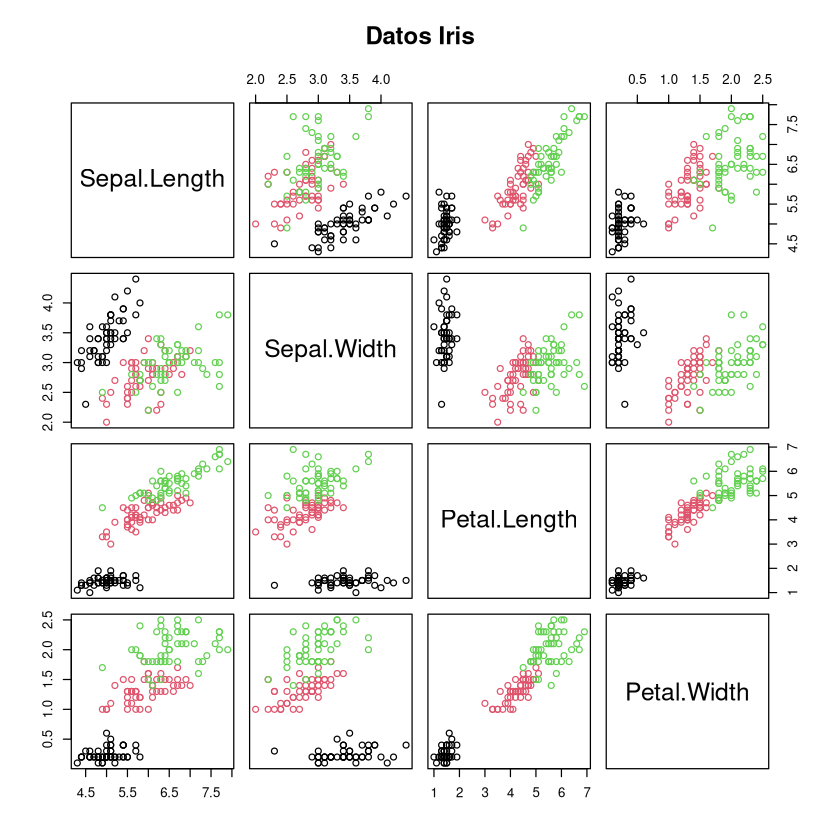


-> GAP statistic:  3

Warning message:
“did not converge in 10 iterations”


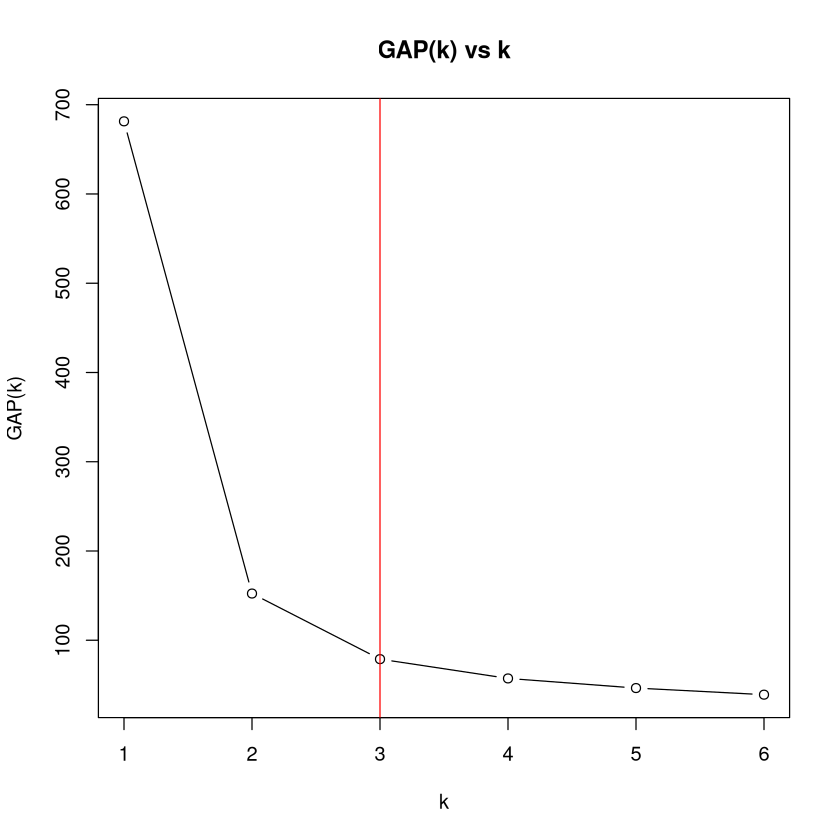


-> Estabilidad  :  2

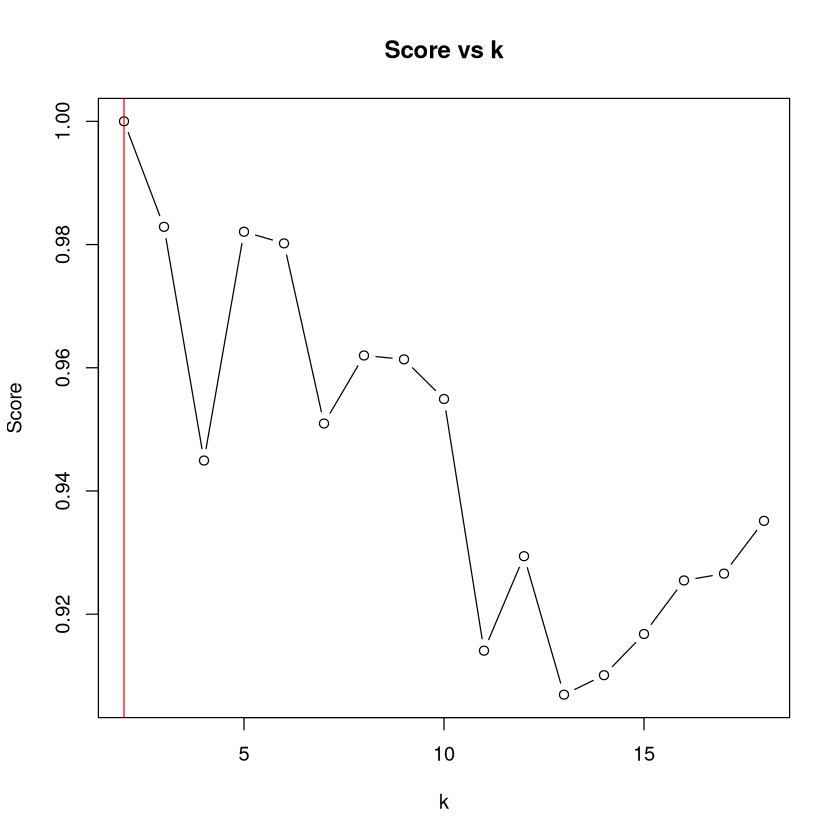

In [47]:
data(iris)
iris.x <- iris[,1:4]
iris.y <- iris[,5]

plot(iris.x, col=iris.y, main="Datos Iris")

calcular_cant_clusters(iris.x)

#### Conclusiones
Para GAP-statistic la cantidad de clusters optima debería ser 3, mientras que para Estabilidad es 2. GAP-statistic encuentra la cantidad real de clusters.

### Problema de las Gaussianas

In [48]:
cuatro_gaussianas <- function(totPuntos=100, gap=2, plotBool=FALSE){
    
    #cuatro clusters de dist. gaussianas
    
    x<-rnorm(totPuntos,mean=-gap)
    y<-rnorm(totPuntos,mean=-gap)
    gausianas<-cbind(x,y,rep(1,length(x)))

    x<-rnorm(totPuntos,mean=2*gap)
    y<-rnorm(totPuntos,mean=0)
    gausianas<-rbind(gausianas,cbind(x,y,rep(2,length(x))))
    
    x<-rnorm(totPuntos,mean=0.7*gap,sd=0.5)
    y<-rnorm(totPuntos,mean=2.5*gap,sd=0.5)
    gausianas<-rbind(gausianas,cbind(x,y,rep(3,length(x))))
    
    x<-rnorm(totPuntos,mean=-gap,sd=0.5)
    y<-rnorm(totPuntos,mean=gap,sd=0.5)
    gausianas<-rbind(gausianas,cbind(x,y,rep(4,length(x))))
    
    if(plotBool){
        plot(gausianas[,1:2],col=gausianas[,3])
    }
    return(gausianas)
}


Buscamos cuales deberían ser los clusters óptimos para los datos

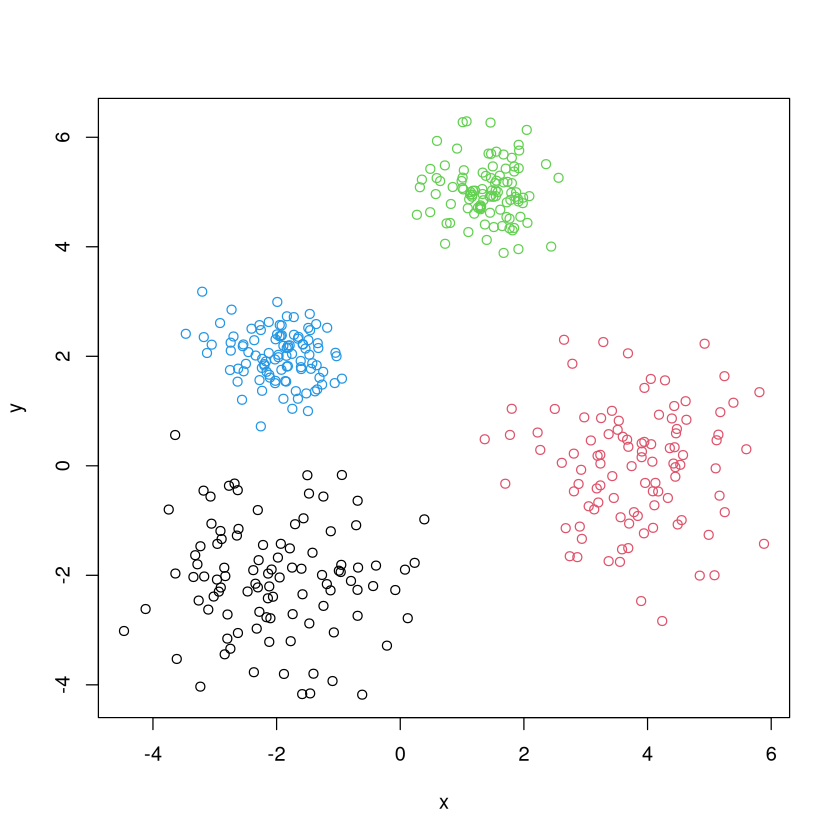


-> GAP statistic:  4

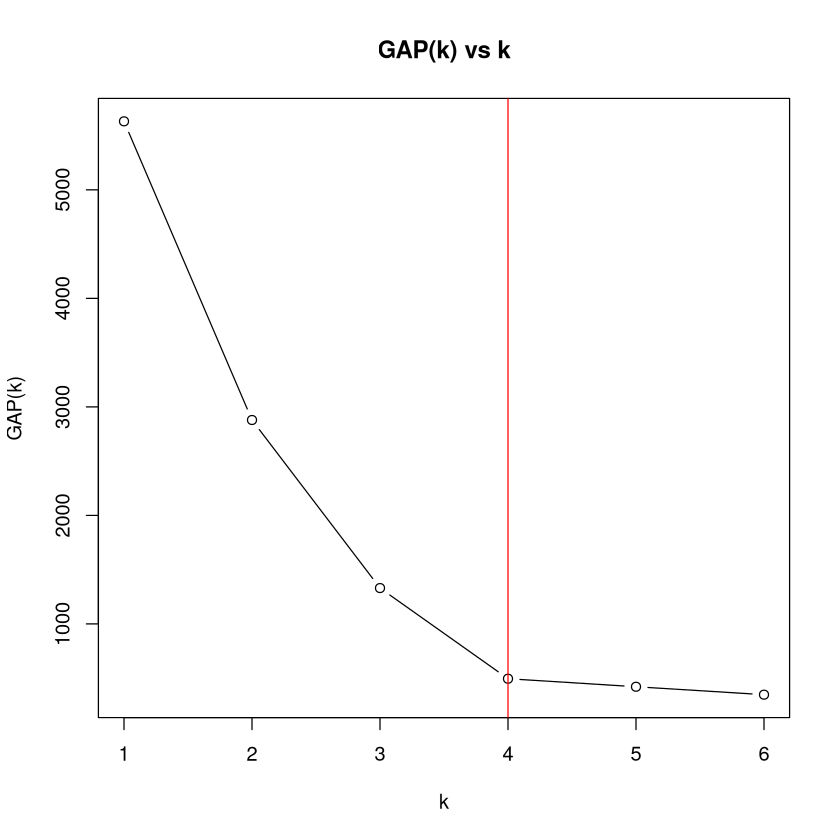


-> Estabilidad  :  2

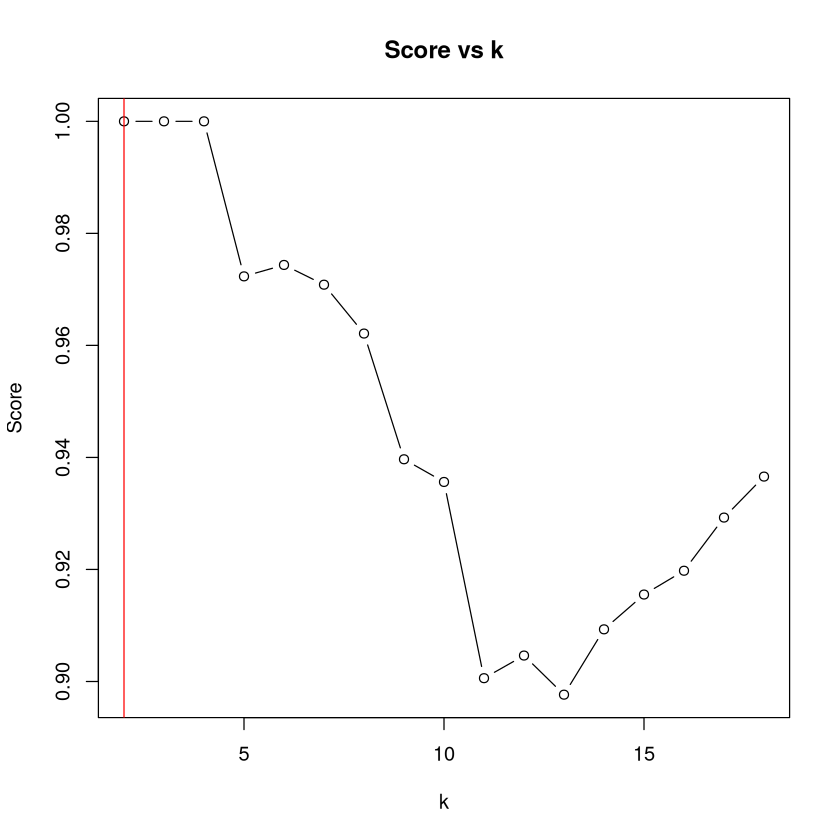

In [49]:
gaussian   <- cuatro_gaussianas(plotBool=TRUE)
gaussian.x <- gaussian[,1:2]
calcular_cant_clusters(gaussian.x)

#### Conclusiones
Para GAP-statistic la cantidad de clusters optima debería ser 4, mientras que para Estabilidad es 2. GAP-statistic encuentra la cantidad real de clusters.

### Lampone


Buscamos cuales deberían ser los clusters óptimos para los datos

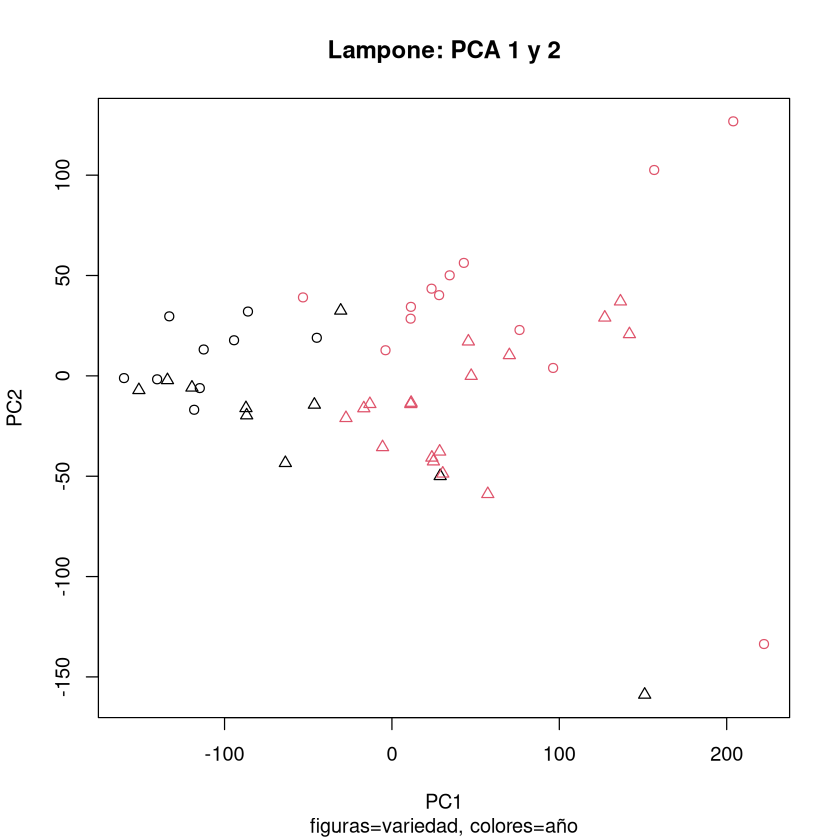


-> GAP statistic:  1

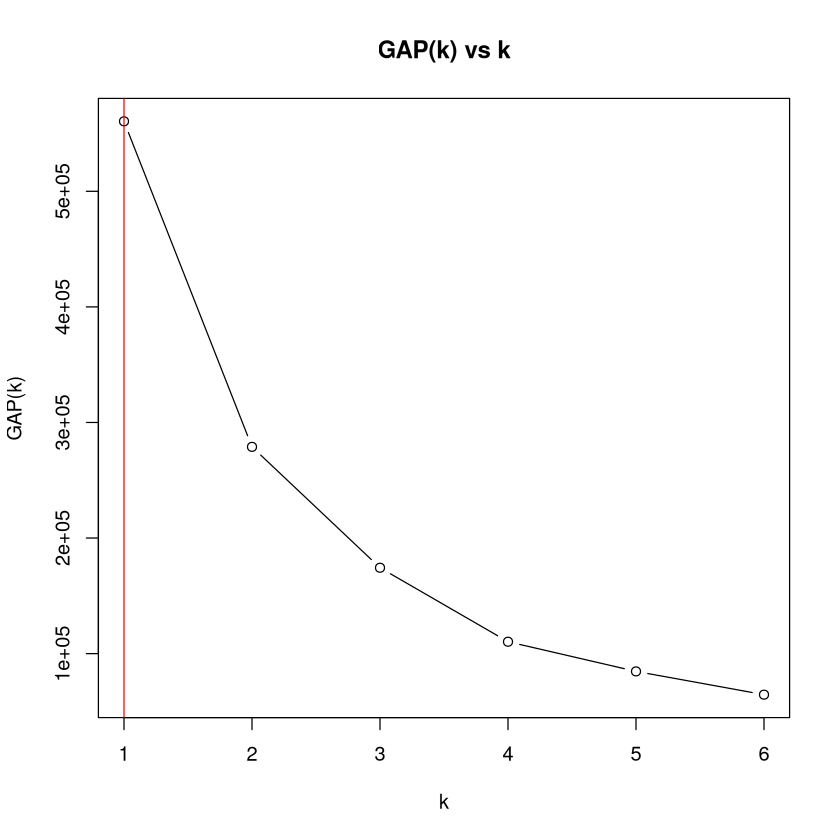


-> Estabilidad  :  10

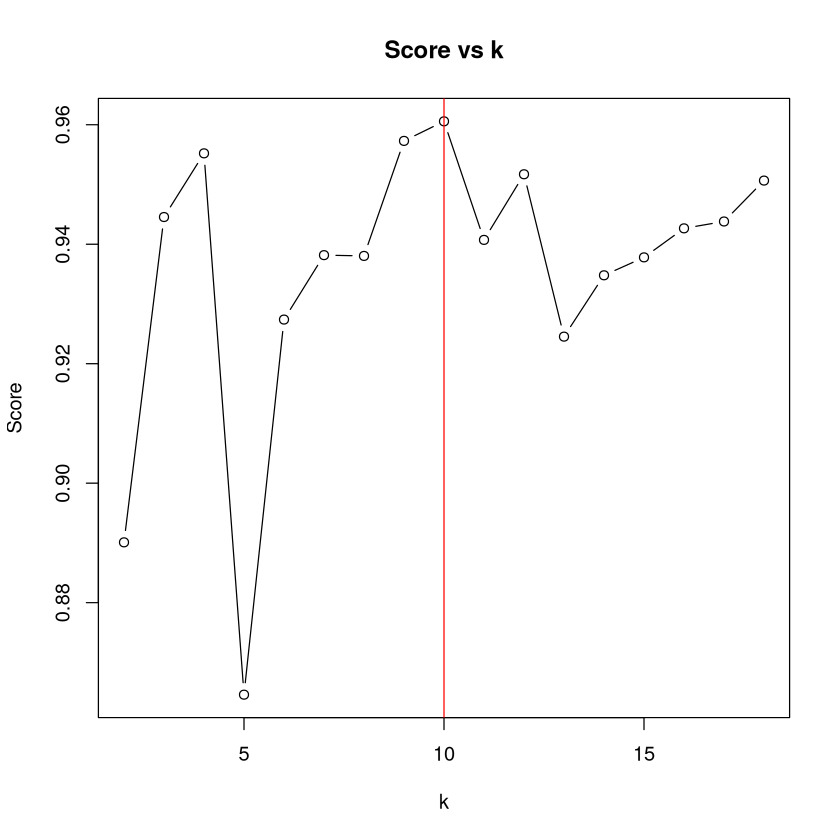

In [50]:
plot(lampone.x.pca$x[, 1:2], col = as.numeric(lampone[, 1]), pch = as.numeric(lampone[, 143]), main="Lampone: PCA 1 y 2", sub="figuras=variedad, colores=año")
calcular_cant_clusters(lampone.x.pca$x)

#### Conclusiones
Para GAP-statistic la cantidad de clusters optima debería ser 1, mientras que para Estabilidad es 10. ninguno encuentra la cantidad de clases del problema original (pueden ser 4 o 2).

## Dataset a la carta
En este caso el dataset que elegí para analizar es el **[Breast Cancer Wisconsin](https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data)**, dataset obtenido en *Kaglle*.

> [!WARNING]
> Si se descarga directamente falta un salto de linea en la primera lo que deja desalineado el archo y agrega una columna de na. Para resolverlo agregar el salto de linea en la primera y queda parcheado =D.
> También hay una fila con un dato demás que desalinea los datos, tener cuidado con eso.

Este dataset clasifica en 2 las muestras de cáncer, en malignos(**M**) y benignos(**B**) además agrega información relevante del tumor. Estos valores se ven el la variable **Diagnóstico**(diagnosis).

Otra observación es que hay más ejemplos de una de las clases que de otra. Las muestras de benignos son más con una diferencia del 25% sobre el total(*).

(*) Esta es la diferencia que te consulté por mail si valía la pena eliminar.

[1] 569  32

       id            diagnosis  radius_mean      texture_mean  
 Min.   :     8670   B:357     Min.   : 6.981   Min.   : 9.71  
 1st Qu.:   869218   M:212     1st Qu.:11.700   1st Qu.:16.17  
 Median :   906024             Median :13.370   Median :18.84  
 Mean   : 30371831             Mean   :14.127   Mean   :19.29  
 3rd Qu.:  8813129             3rd Qu.:15.780   3rd Qu.:21.80  
 Max.   :911320502             Max.   :28.110   Max.   :39.28  
 perimeter_mean     area_mean      smoothness_mean   compactness_mean 
 Min.   : 43.79   Min.   : 143.5   Min.   :0.05263   Min.   :0.01938  
 1st Qu.: 75.17   1st Qu.: 420.3   1st Qu.:0.08637   1st Qu.:0.06492  
 Median : 86.24   Median : 551.1   Median :0.09587   Median :0.09263  
 Mean   : 91.97   Mean   : 654.9   Mean   :0.09636   Mean   :0.10434  
 3rd Qu.:104.10   3rd Qu.: 782.7   3rd Qu.:0.10530   3rd Qu.:0.13040  
 Max.   :188.50   Max.   :2501.0   Max.   :0.16340   Max.   :0.34540  
 concavity_mean    concave.points_mean symmetry_mean   

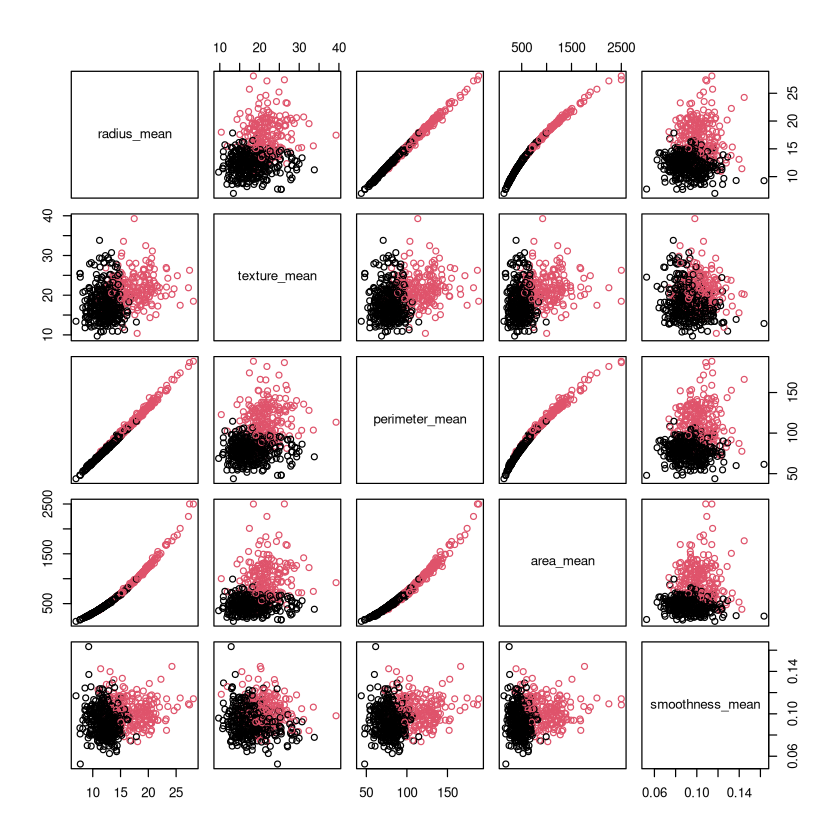

In [71]:
# BreastCancerWisconsin <- read.csv("./archive/sample.csv")
BreastCancerWisconsin <- read.csv("./archive/BreastCancerWisconsin.csv")

dim(BreastCancerWisconsin)

# Elimino las filas con datos faltantes
# BreastCancerWisconsin <- na.omit(BreastCancerWisconsin)
# Para tomar las clases como factores
BreastCancerWisconsin[,2] <- as.factor(BreastCancerWisconsin[,2]) 
# No se leía como numérica la columna 3 (lo es dela información del dataset)  
BreastCancerWisconsin[,3] <- as.numeric(BreastCancerWisconsin[,3]) 
# BreastCancerWisconsin
summary(BreastCancerWisconsin)

BreastCancerWisconsin.x <- BreastCancerWisconsin[,-c(1,2)]
BreastCancerWisconsin.y <- BreastCancerWisconsin[,2]
plot(BreastCancerWisconsin.x[,1:5], col=as.factor(BreastCancerWisconsin.y))


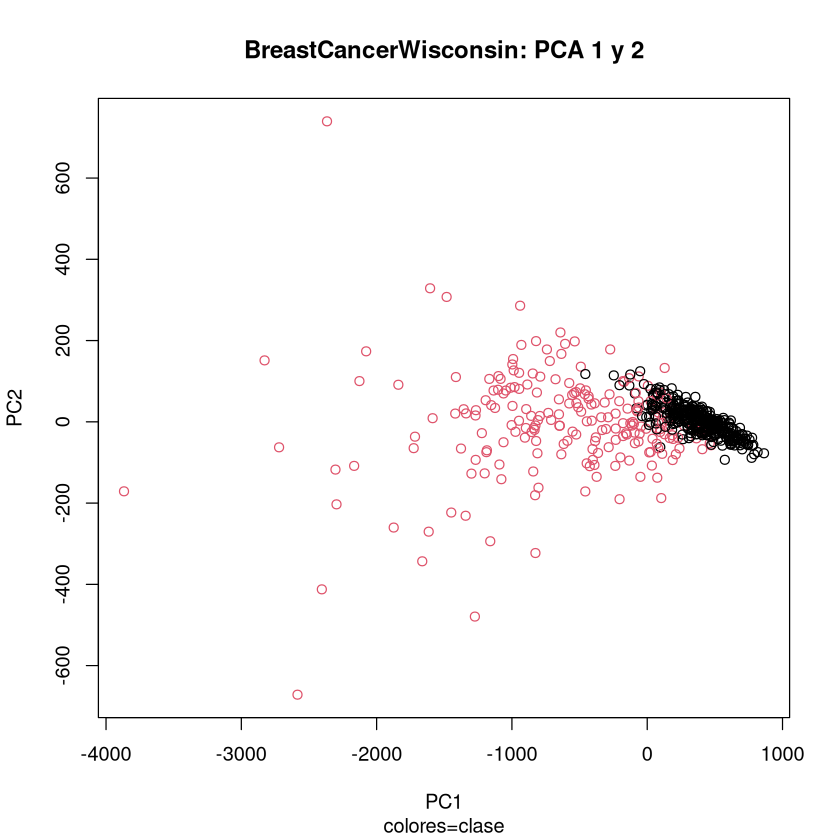

In [52]:
BreastCancerWisconsin.x.pca <- prcomp(BreastCancerWisconsin.x, scale. = FALSE)$x

plot(BreastCancerWisconsin.x.pca[,1:2], col = as.factor(BreastCancerWisconsin.y), main="BreastCancerWisconsin: PCA 1 y 2", sub="colores=clase")


Buscamos cuales deberían ser los clusters óptimos para los datos
-> GAP statistic:  2

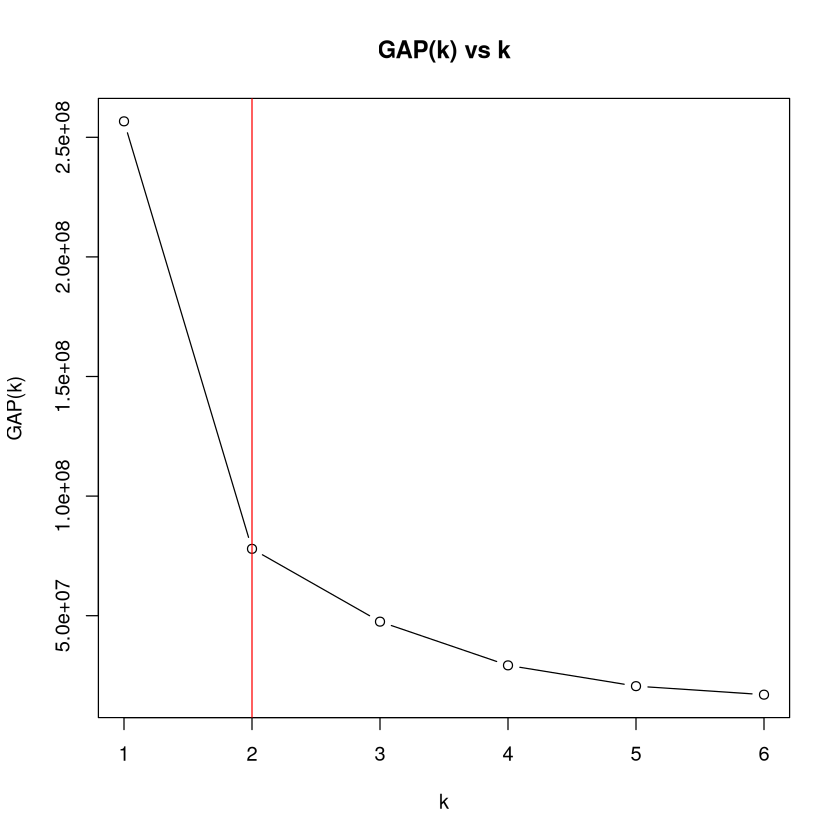


-> Estabilidad  :  2
Buscamos cuales deberían ser los clusters óptimos para los datos

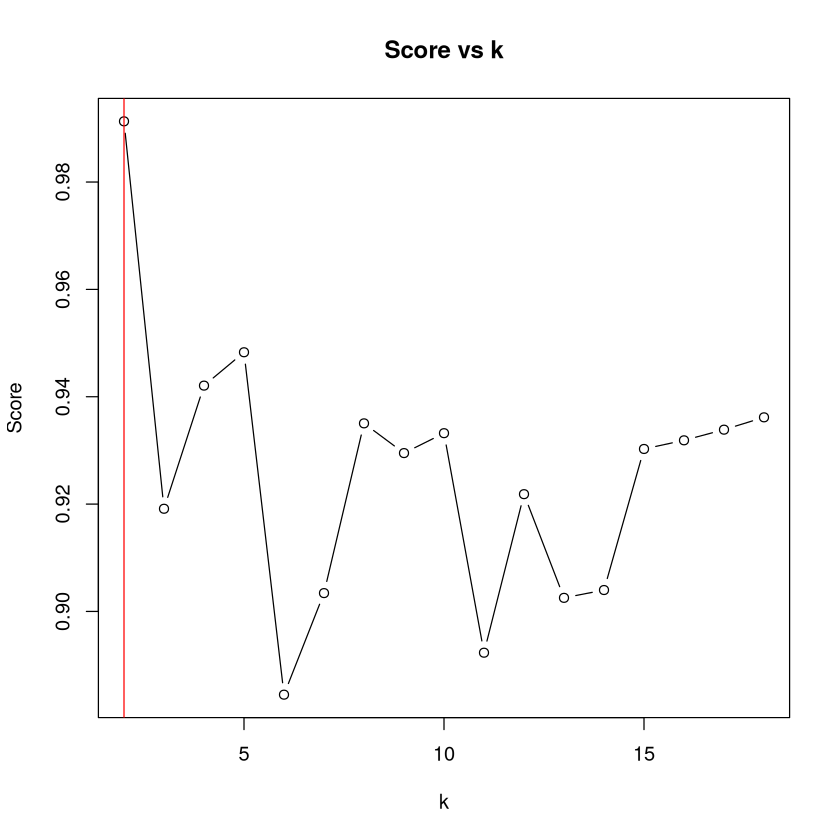


-> GAP statistic:  2

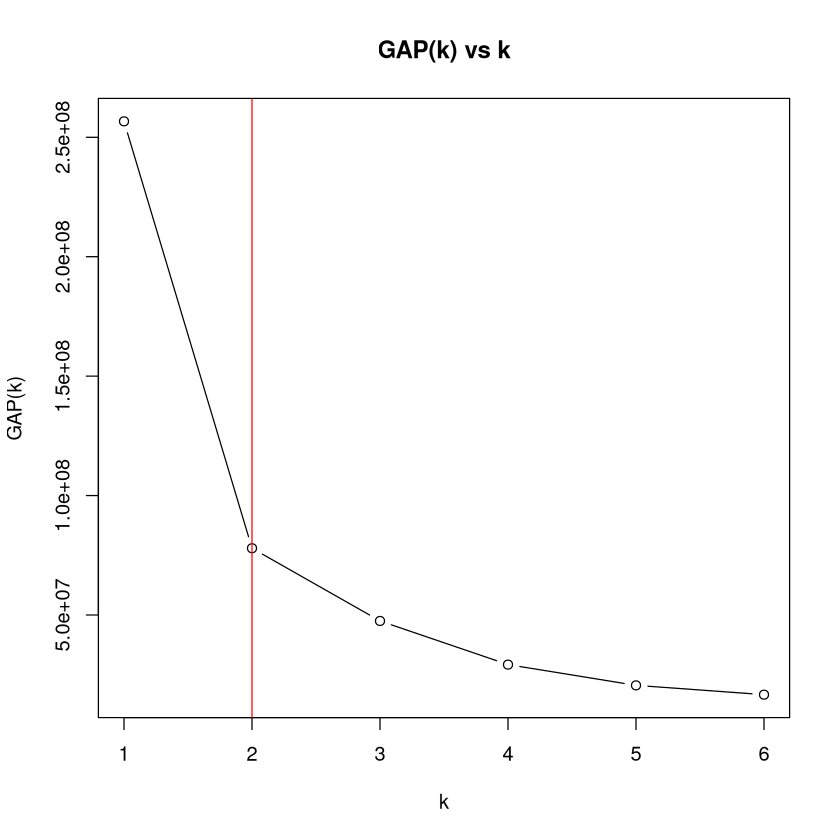


-> Estabilidad  :  2

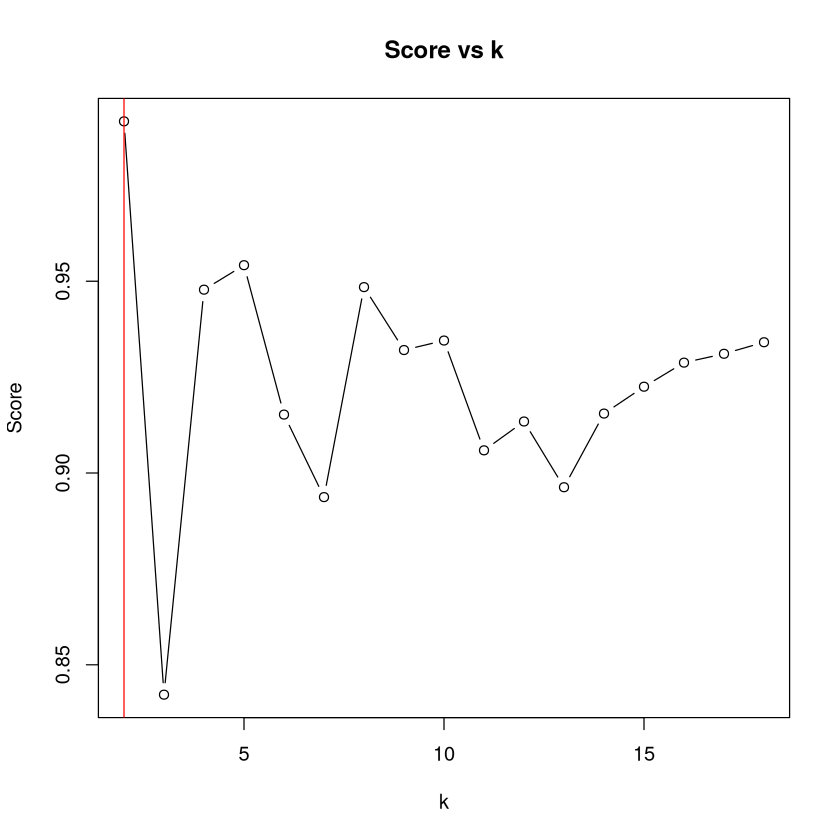

In [53]:
calcular_cant_clusters(BreastCancerWisconsin.x)
calcular_cant_clusters(BreastCancerWisconsin.x.pca)

### k-means

In [54]:

calcular_kmeans <- function(x){
    bcw.kmeans.2 <- kmeans(x, centers=k2)

    cat("\nVariedad\n")
    compararClases(BreastCancerWisconsin.y,  bcw.kmeans.2$cluster)
    cat("\n-----------------------------------------\n")
    
    # Mostralas a todas no tiene mucho sentido, pero si algunas
    # muestro las primeras 5 columnas (las primeras son interesantes luego de la PCA)
    plot(x[,1:5], col=as.factor(BreastCancerWisconsin.y),  pch=bcw.kmeans.2$cluster, main="Clasificación k-means (2 clusters)")
}


Variedad
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 85.41 %
           agrupacion2
agrupacion1   1   2
          B 356   1
          M  82 130

-----------------------------------------



Variedad
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 85.41 %
           agrupacion2
agrupacion1   2   1
          B 356   1
          M  82 130

-----------------------------------------


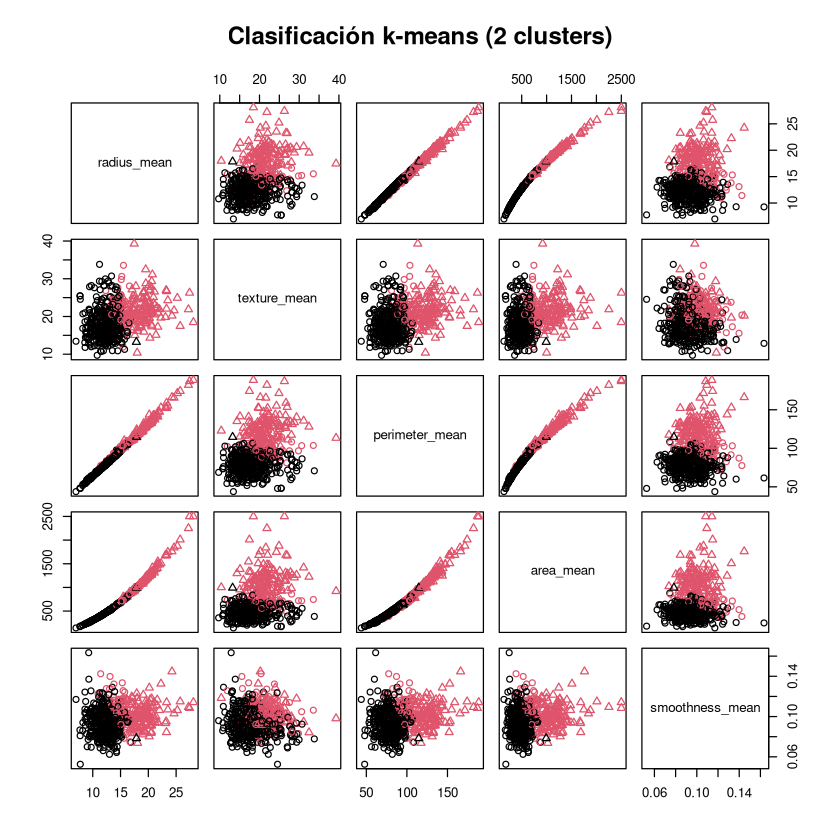

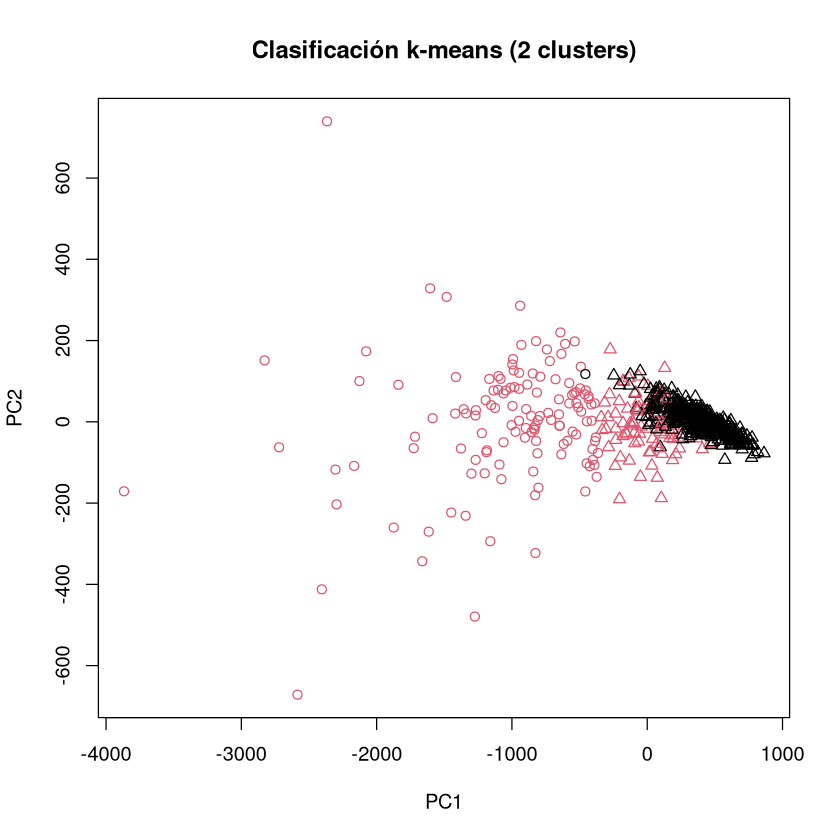

In [55]:
calcular_kmeans(BreastCancerWisconsin.x)
calcular_kmeans(BreastCancerWisconsin.x.pca)

### hclust

In [62]:
calcular_hclust <- function(x, methodUse = "compleat"){
    # Clasificación con hclust
    bcw.dist  <- dist(x)
    bcw.hclust <- hclust(bcw.dist, method = methodUse)

    plot(as.dendrogram(bcw.hclust))

    bcw.hclust.cut.2 <- cutree(bcw.hclust, k = 2)

    cat("\nTipo:\n")
    compararClases(BreastCancerWisconsin.y,  bcw.hclust.cut.2)
    cat("\n-----------------------------------------\n")

    # Mostralas a todas no tiene mucho sentido, pero si algunas
    # mustro las primeras 5 columnas (las primeras son interesantes luego de la PCA)
    plot(x[,1:5], col=as.factor(BreastCancerWisconsin.y),  pch=bcw.hclust.cut.2, main="Clasificación hclust (2 clusters)")
}


Tipo:
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 66.26 %
           agrupacion2
agrupacion1   1   2
          B 357   0
          M 192  20

-----------------------------------------


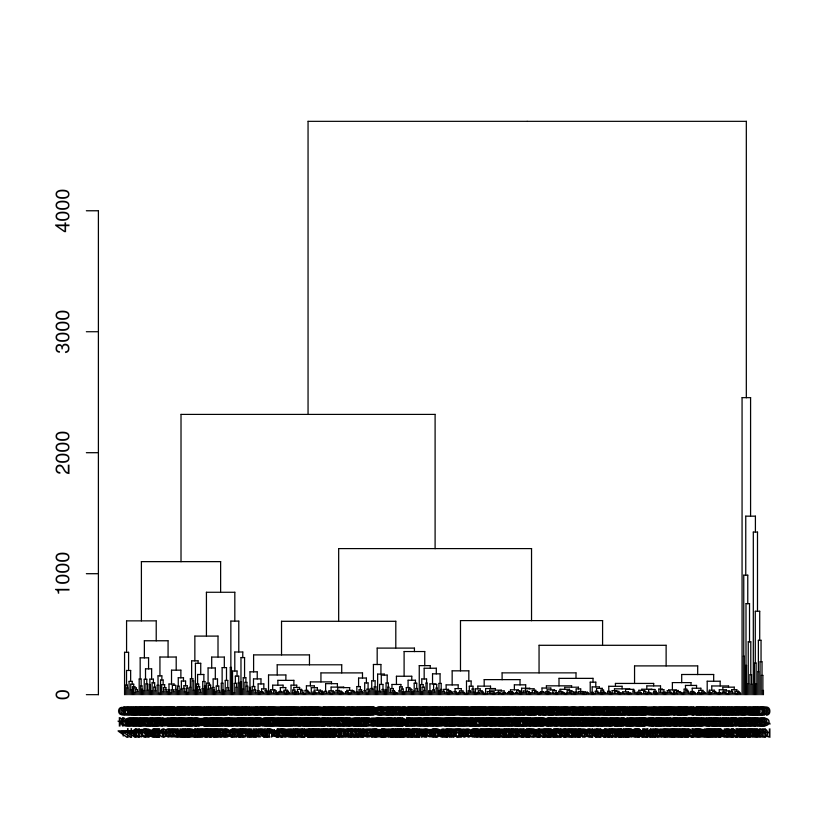

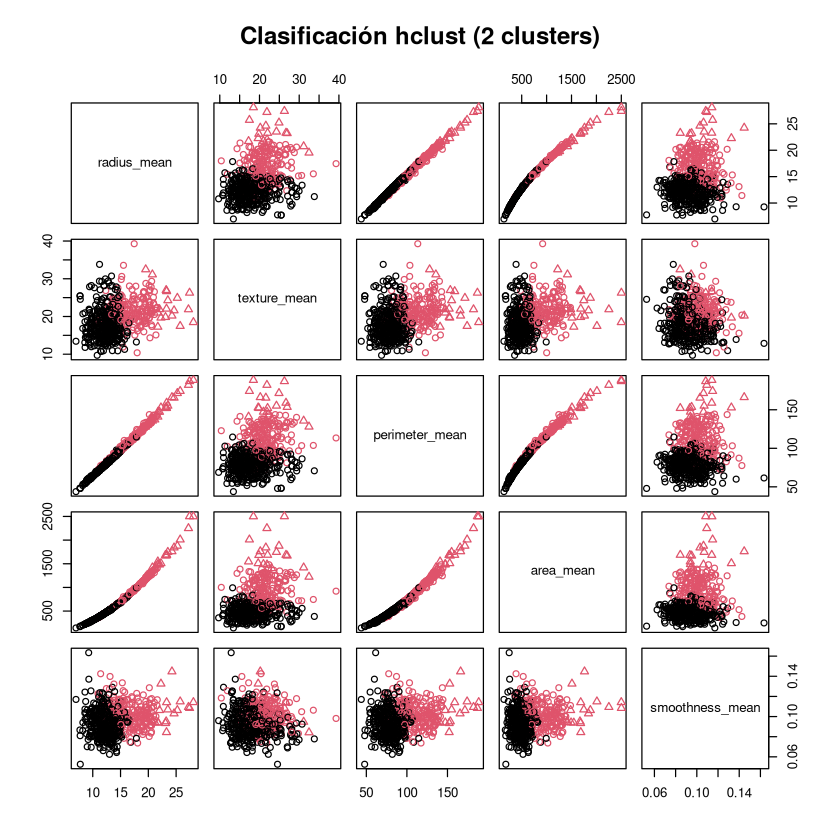


Tipo:
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 66.26 %
           agrupacion2
agrupacion1   1   2
          B 357   0
          M 192  20

-----------------------------------------


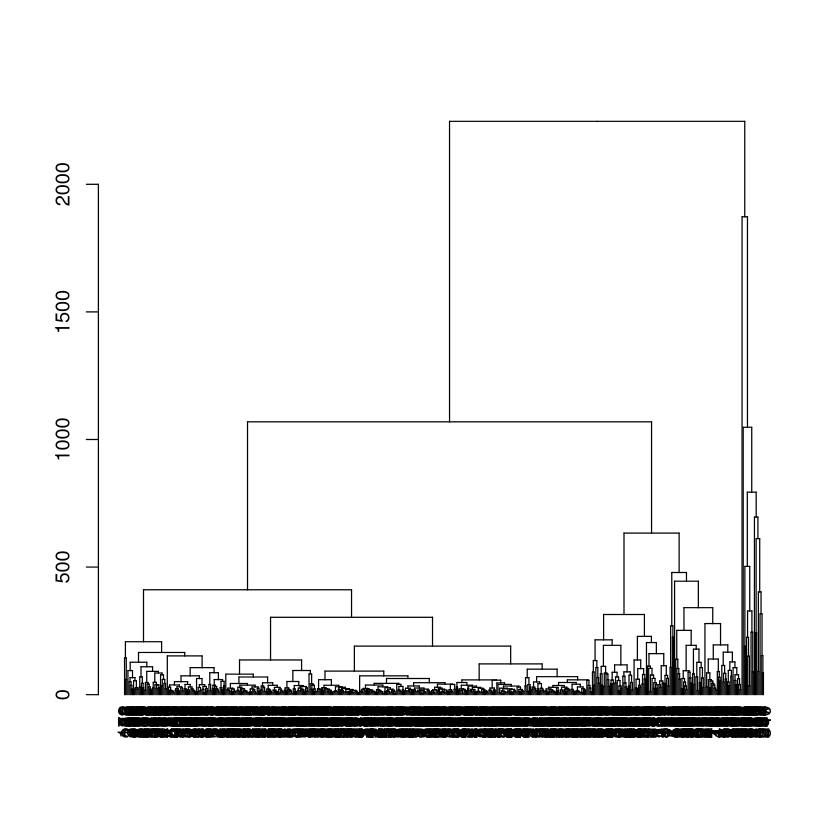

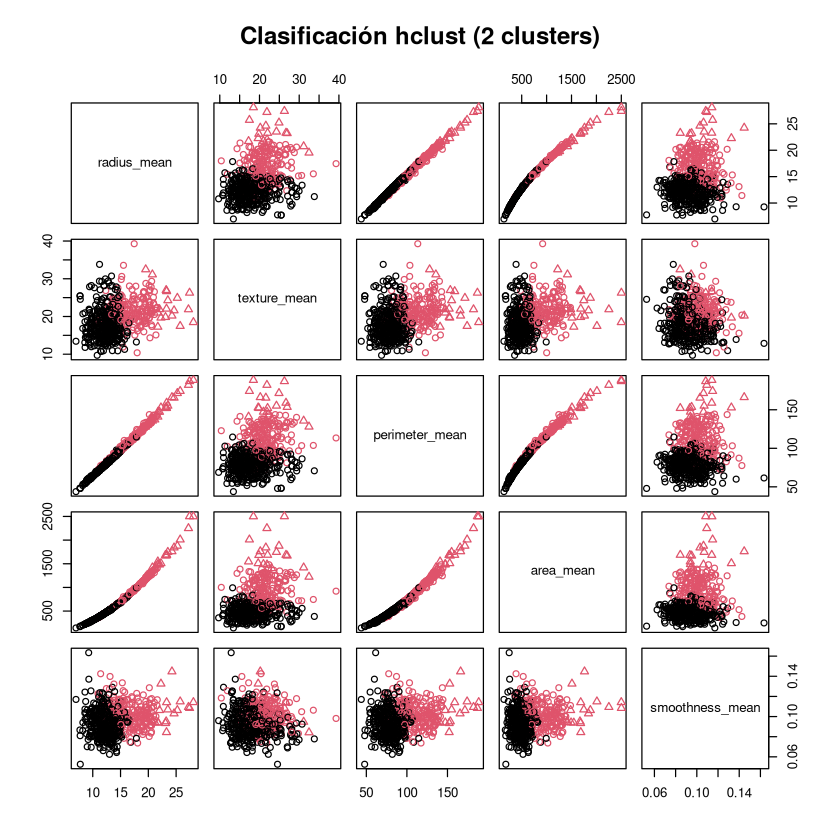


Tipo:
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 62.92 %
           agrupacion2
agrupacion1   1   2
          B 357   0
          M 211   1

-----------------------------------------


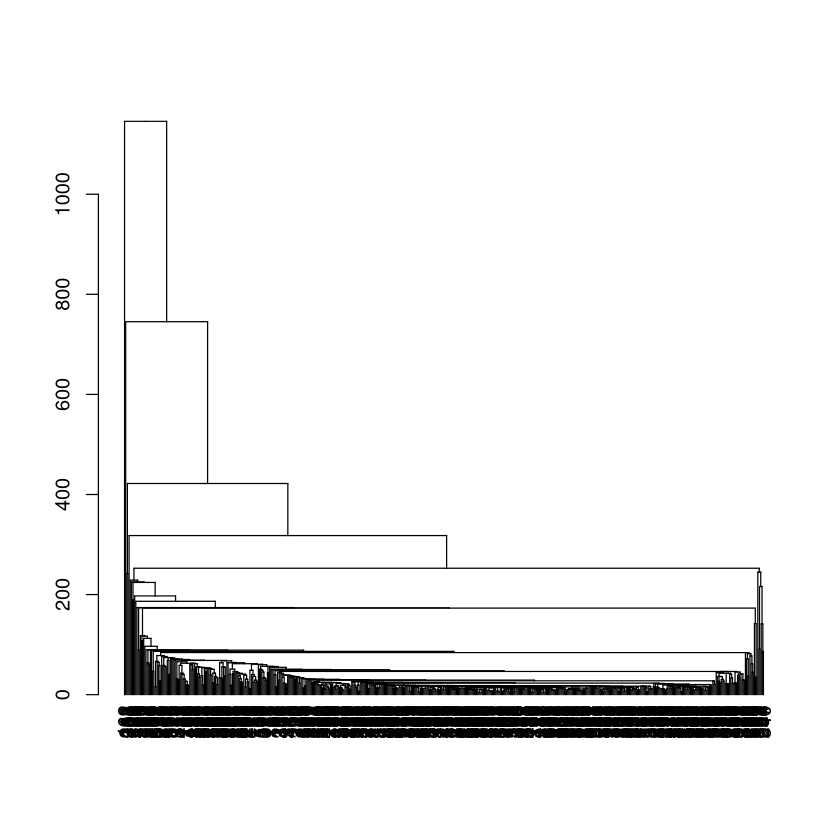

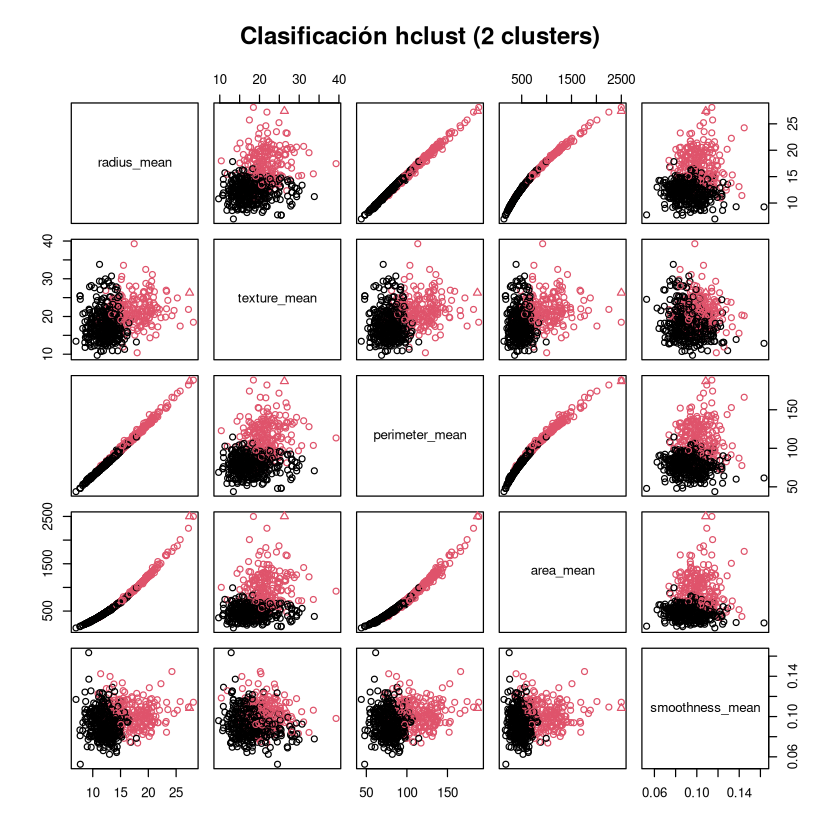

In [63]:
# Sin PCA
calcular_hclust(BreastCancerWisconsin.x, "complete")
calcular_hclust(BreastCancerWisconsin.x, "average")
calcular_hclust(BreastCancerWisconsin.x, "single")


Tipo:
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 66.26 %
           agrupacion2
agrupacion1   1   2
          B 357   0
          M 192  20

-----------------------------------------


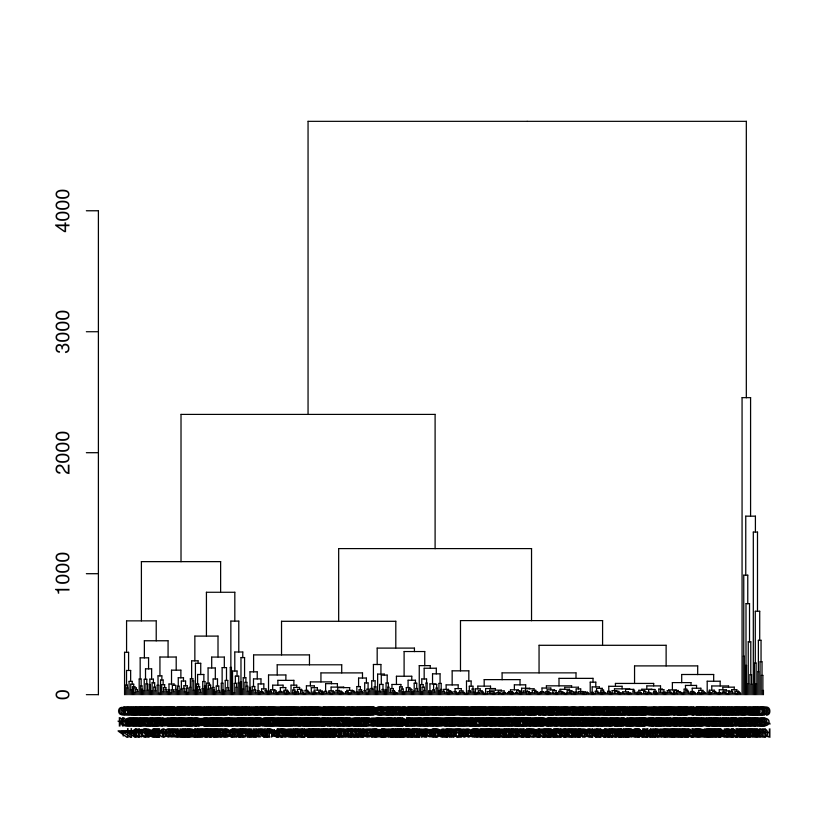

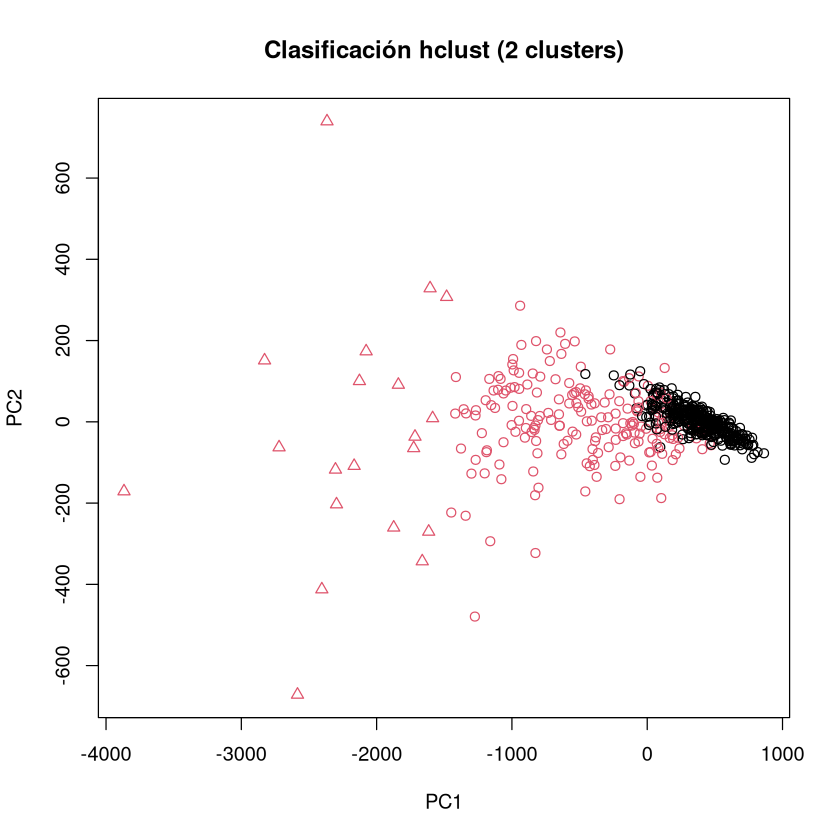


Tipo:
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 66.26 %
           agrupacion2
agrupacion1   1   2
          B 357   0
          M 192  20

-----------------------------------------


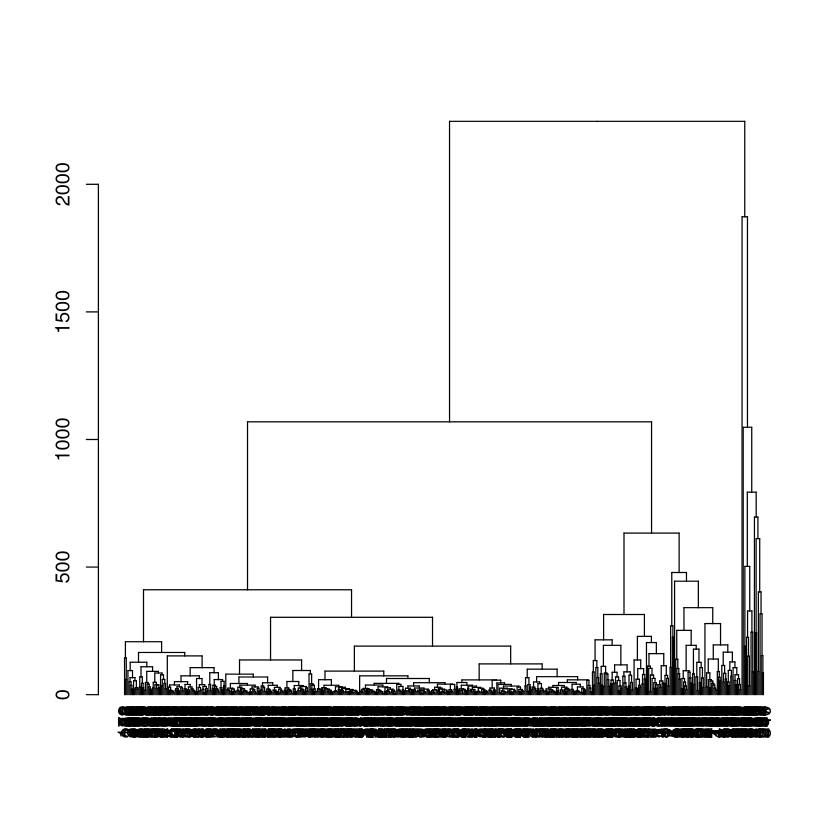

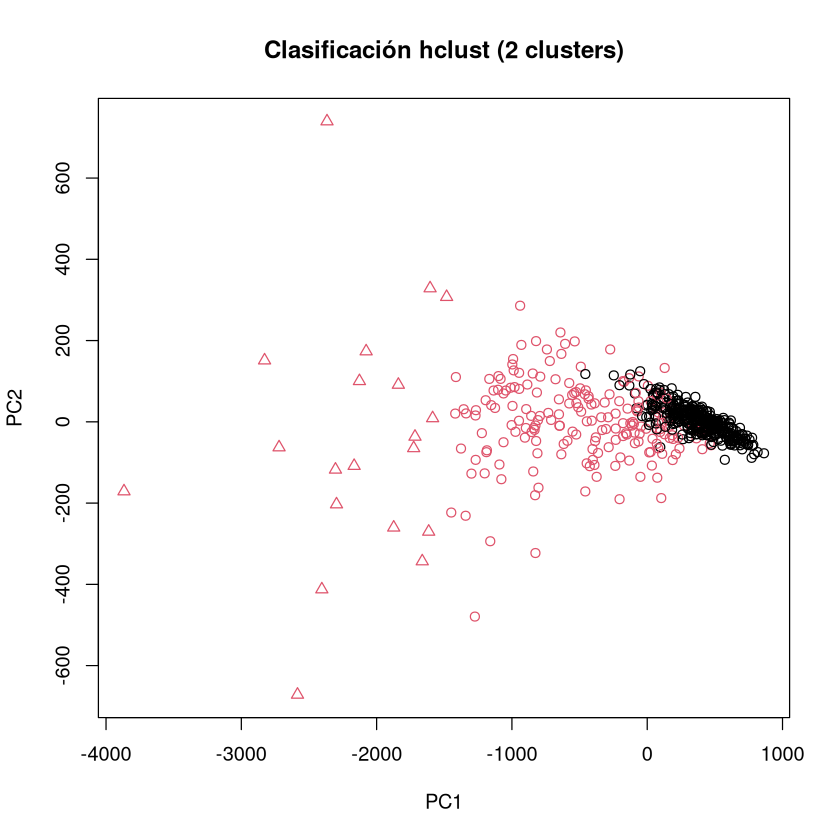


Tipo:
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 62.92 %
           agrupacion2
agrupacion1   1   2
          B 357   0
          M 211   1

-----------------------------------------


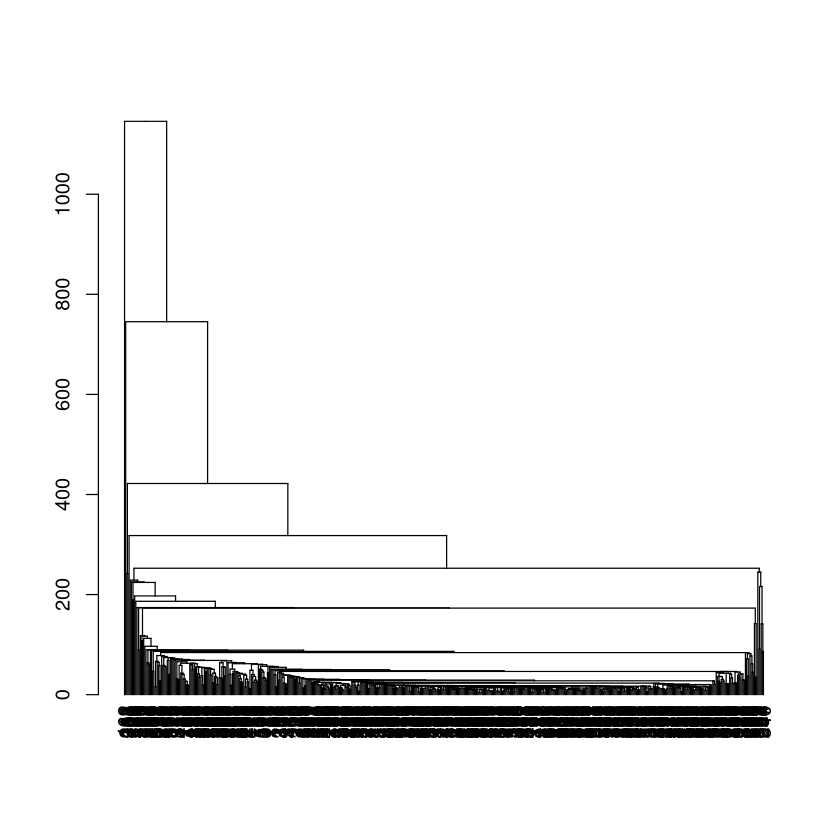

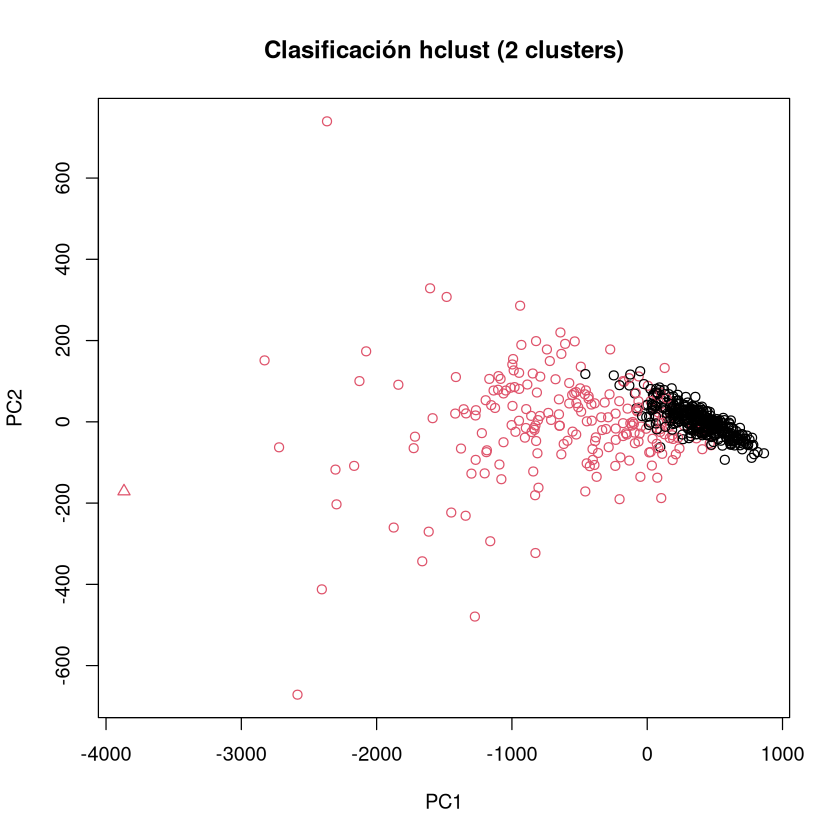

In [64]:
# Con PCA
calcular_hclust(BreastCancerWisconsin.x.pca, "complete")
calcular_hclust(BreastCancerWisconsin.x.pca, "average")
calcular_hclust(BreastCancerWisconsin.x.pca, "single")

### Conclusiones
En este caso ambos métodos para obtener el número de clusters optimo arrojan como valor 2, sin importar si se aplicó o no PCA, este número coincide con la cantidad de clases de los datos originales.

En este caso muestro en porcentajes la similitud de las agrupaciones hechas con respecto a como estaban los datos agrupados.

| Trasformación   | k-means | hclust(compleat) | hclust(average) | hclust(single) |
|:----------------|:--------|:-----------------|:----------------|:---------------|
| nada            | 85		| 66		       | 66              | 62             |
|    PCA          | 85		| 66		       | 66              | 62             |


